In [1]:
# back to project root
%cd ~/research

import argparse
import gc
import os
import sys
import time
from glob import glob

import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import torch
from tqdm import tqdm
import yaml
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, confusion_matrix
from torch import nn, optim

sys.path.append("src")
from group.passing.dataset import make_data_loaders, make_all_data
from group.passing.lstm_model import LSTMModel
from utility.activity_loader import load_individuals
from utility.logger import logger
from tools.train_passing import init_model, init_loss, init_optim, train, test

/raid6/home/yokoyama/research


/home/yokoyama/research/.venv/lib/python3.8/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams["font.size"] = 24
plt.rcParams['xtick.direction'] = 'in'  # x axis in
plt.rcParams['ytick.direction'] = 'in'  # y axis in

In [3]:
os.environ["CUDA_VISIBLE_DEVICES"] = "4"
device = 'cuda' if torch.cuda.is_available() else 'cpu'
device

'cuda'

In [4]:
cfg_path = "config/passing/pass_train.yaml"
with open(cfg_path, "r") as f:
    train_cfg = yaml.safe_load(f)
with open(train_cfg["config_path"]["individual"], "r") as f:
    ind_cfg = yaml.safe_load(f)
with open(train_cfg["config_path"]["group"], "r") as f:
    grp_cfg = yaml.safe_load(f)

In [5]:
data_dirs_all = {}
for room_num, surgery_items in train_cfg["dataset"]["setting"].items():
    for surgery_num in surgery_items.keys():
        dirs = sorted(glob(os.path.join("data", room_num, surgery_num, "passing", "*")))
        data_dirs_all[f"{room_num}_{surgery_num}"] = dirs

inds = {}
for key_prefix, dirs in tqdm(data_dirs_all.items()):
    for model_path in dirs:
        num = model_path.split("/")[-1]
        json_path = os.path.join(model_path, ".json", "individual.json")
        tmp_inds = load_individuals(json_path, ind_cfg)
        for pid, ind in tmp_inds.items():
            inds[f"{key_prefix}_{num}_{pid}"] = ind

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [01:15<00:00, 12.65s/it]


# グリッドサーチ

In [6]:
# create data loader
dataset_cfg = train_cfg["dataset"]
passing_defs = grp_cfg["passing"]["default"]
train_loader, val_loader, test_loader = make_data_loaders(
    inds, dataset_cfg, passing_defs, logger
)

2022-08-18 13:25:58,083 => createing time series 02_001
100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:04<00:00,  4.09it/s]
2022-08-18 13:26:02,239 => createing time series 07_001
100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 48/48 [00:28<00:00,  1.68it/s]
2022-08-18 13:26:30,898 => createing time series 08_001
100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 38/38 [00:05<00:00,  6.56it/s]
2022-08-18 13:26:36,689 => createing time series 08_002
100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 45/45 [00:31<00:00,  1.44it/s]


In [7]:
# model config
mdl_cfg = {
    "dropouts": [0.1, 0],
    "hidden_dims": [128, 64],
    "n_classes": 2,
    "n_linears": 2,
    "rnn_dropout": 0.1,
    "size": 4,
}

# grid search parameters
params = {
    'n_rnns': [1, 2, 3],
    'rnn_hidden_dim': [128, 256],
    'pos_weight': [8, 16, 32]
}

# epoch
epoch_len = train_cfg["optim"]["epoch"]

In [8]:
max_acc = [[0, 0, 0, 0], None]
max_pre = [[0, 0, 0, 0], None]
max_rcl = [[0, 0, 0, 0], None]
max_f1 = [[0, 0, 0, 0], None]
max_models = [None for _ in range(4)]

for n_rnns in params['n_rnns']:
    for dim in params['rnn_hidden_dim']:
        for weight in params['pos_weight']:
            param = dict(n_rnns=n_rnns, rnn_hidden_dim=dim, weight=weight)
            print(param)
            
            # update config
            config = {}
            for key, val in mdl_cfg.items():
                config[key] = val
            for key, val in param.items():
                config[key] = val
            pos_weight = param["weight"]
                
            # init model, loss, optim
            model = init_model(config, device)
            criterion = init_loss([1, pos_weight], device)
            optimizer, scheduler = init_optim(
                model, train_cfg["optim"]["lr"], train_cfg["optim"]["lr_rate"]
            )
            
            # training
            model, epoch, history = train(
                model, train_loader, val_loader,
                criterion, optimizer, scheduler,
                epoch_len, logger, device
            )
            
            # test
            score = test(model, test_loader, logger, device)
            acc, pre, rcl, f1 = score
            
            # update max scores
            if acc > max_acc[0][0]:
                max_acc[0] = score
                max_acc[1] = param
                max_models[0] = model
            if pre > max_pre[0][1]:
                max_pre[0] = score
                max_pre[1] = param
                max_models[1] = model
            if rcl > max_rcl[0][2]:
                max_rcl[0] = score
                max_rcl[1] = param
                max_models[2] = model
            if f1 > max_f1[0][3]:
                max_f1[0] = score
                max_f1[1] = param
                max_models[3] = model
                
            torch.cuda.empty_cache()

{'n_rnns': 1, 'rnn_hidden_dim': 128, 'weight': 8}


2022-08-18 13:30:47,589 => start training
2022-08-18 13:30:58,657 Epoch[1/100] train loss: 0.45784, val loss: nan, lr: 0.0010000, time: 11.07
2022-08-18 13:31:08,449 Epoch[2/100] train loss: 0.39733, val loss: nan, lr: 0.0010000, time: 9.79
2022-08-18 13:31:18,361 Epoch[3/100] train loss: 0.39449, val loss: nan, lr: 0.0010000, time: 9.91
2022-08-18 13:31:28,247 Epoch[4/100] train loss: 0.39298, val loss: nan, lr: 0.0010000, time: 9.88
2022-08-18 13:31:38,265 Epoch[5/100] train loss: 0.39182, val loss: nan, lr: 0.0010000, time: 10.02
2022-08-18 13:31:48,467 Epoch[6/100] train loss: 0.39054, val loss: nan, lr: 0.0010000, time: 10.20
2022-08-18 13:31:58,619 Epoch[7/100] train loss: 0.38974, val loss: nan, lr: 0.0010000, time: 10.15
2022-08-18 13:32:08,934 Epoch[8/100] train loss: 0.38860, val loss: nan, lr: 0.0010000, time: 10.31
2022-08-18 13:32:18,911 Epoch[9/100] train loss: 0.38795, val loss: nan, lr: 0.0010000, time: 9.97
2022-08-18 13:32:28,967 Epoch[10/100] train loss: 0.38710, val

{'n_rnns': 1, 'rnn_hidden_dim': 128, 'weight': 16}


2022-08-18 13:48:13,742 Epoch[1/100] train loss: 0.46860, val loss: nan, lr: 0.0010000, time: 10.04
2022-08-18 13:48:23,844 Epoch[2/100] train loss: 0.42769, val loss: nan, lr: 0.0010000, time: 10.10
2022-08-18 13:48:33,855 Epoch[3/100] train loss: 0.42515, val loss: nan, lr: 0.0010000, time: 10.01
2022-08-18 13:48:43,730 Epoch[4/100] train loss: 0.42356, val loss: nan, lr: 0.0010000, time: 9.87
2022-08-18 13:48:53,871 Epoch[5/100] train loss: 0.42212, val loss: nan, lr: 0.0010000, time: 10.14
2022-08-18 13:49:04,166 Epoch[6/100] train loss: 0.42065, val loss: nan, lr: 0.0010000, time: 10.29
2022-08-18 13:49:14,397 Epoch[7/100] train loss: 0.41898, val loss: nan, lr: 0.0010000, time: 10.23
2022-08-18 13:49:24,354 Epoch[8/100] train loss: 0.41813, val loss: nan, lr: 0.0010000, time: 9.95
2022-08-18 13:49:34,211 Epoch[9/100] train loss: 0.41677, val loss: nan, lr: 0.0010000, time: 9.85
2022-08-18 13:49:44,383 Epoch[10/100] train loss: 0.41500, val loss: nan, lr: 0.0010000, time: 10.17
20

{'n_rnns': 1, 'rnn_hidden_dim': 128, 'weight': 32}


2022-08-18 14:05:33,028 Epoch[1/100] train loss: 0.53686, val loss: nan, lr: 0.0010000, time: 9.91
2022-08-18 14:05:43,629 Epoch[2/100] train loss: 0.48057, val loss: nan, lr: 0.0010000, time: 10.60
2022-08-18 14:05:54,020 Epoch[3/100] train loss: 0.47562, val loss: nan, lr: 0.0010000, time: 10.39
2022-08-18 14:06:04,300 Epoch[4/100] train loss: 0.47275, val loss: nan, lr: 0.0010000, time: 10.28
2022-08-18 14:06:14,639 Epoch[5/100] train loss: 0.47056, val loss: nan, lr: 0.0010000, time: 10.34
2022-08-18 14:06:24,866 Epoch[6/100] train loss: 0.46801, val loss: nan, lr: 0.0010000, time: 10.23
2022-08-18 14:06:34,912 Epoch[7/100] train loss: 0.46665, val loss: nan, lr: 0.0010000, time: 10.04
2022-08-18 14:06:45,172 Epoch[8/100] train loss: 0.46378, val loss: nan, lr: 0.0010000, time: 10.26
2022-08-18 14:06:55,864 Epoch[9/100] train loss: 0.46229, val loss: nan, lr: 0.0010000, time: 10.69
2022-08-18 14:07:06,332 Epoch[10/100] train loss: 0.46027, val loss: nan, lr: 0.0010000, time: 10.47


{'n_rnns': 1, 'rnn_hidden_dim': 256, 'weight': 8}


2022-08-18 14:23:11,094 Epoch[1/100] train loss: 0.48782, val loss: nan, lr: 0.0010000, time: 12.86
2022-08-18 14:23:24,011 Epoch[2/100] train loss: 0.39898, val loss: nan, lr: 0.0010000, time: 12.91
2022-08-18 14:23:37,001 Epoch[3/100] train loss: 0.39522, val loss: nan, lr: 0.0010000, time: 12.99
2022-08-18 14:23:50,067 Epoch[4/100] train loss: 0.39365, val loss: nan, lr: 0.0010000, time: 13.06
2022-08-18 14:24:03,035 Epoch[5/100] train loss: 0.39215, val loss: nan, lr: 0.0010000, time: 12.97
2022-08-18 14:24:16,025 Epoch[6/100] train loss: 0.39084, val loss: nan, lr: 0.0010000, time: 12.99
2022-08-18 14:24:28,974 Epoch[7/100] train loss: 0.38981, val loss: nan, lr: 0.0010000, time: 12.95
2022-08-18 14:24:41,937 Epoch[8/100] train loss: 0.38895, val loss: nan, lr: 0.0010000, time: 12.96
2022-08-18 14:24:54,960 Epoch[9/100] train loss: 0.38760, val loss: nan, lr: 0.0010000, time: 13.02
2022-08-18 14:25:07,984 Epoch[10/100] train loss: 0.38715, val loss: nan, lr: 0.0010000, time: 13.02

{'n_rnns': 1, 'rnn_hidden_dim': 256, 'weight': 16}


2022-08-18 14:45:07,811 Epoch[1/100] train loss: 0.47625, val loss: nan, lr: 0.0010000, time: 12.95
2022-08-18 14:45:20,740 Epoch[2/100] train loss: 0.42869, val loss: nan, lr: 0.0010000, time: 12.93
2022-08-18 14:45:33,695 Epoch[3/100] train loss: 0.42577, val loss: nan, lr: 0.0010000, time: 12.95
2022-08-18 14:45:46,718 Epoch[4/100] train loss: 0.42383, val loss: nan, lr: 0.0010000, time: 13.02
2022-08-18 14:45:59,731 Epoch[5/100] train loss: 0.42227, val loss: nan, lr: 0.0010000, time: 13.01
2022-08-18 14:46:12,650 Epoch[6/100] train loss: 0.42041, val loss: nan, lr: 0.0010000, time: 12.92
2022-08-18 14:46:25,653 Epoch[7/100] train loss: 0.41877, val loss: nan, lr: 0.0010000, time: 13.00
2022-08-18 14:46:38,592 Epoch[8/100] train loss: 0.41686, val loss: nan, lr: 0.0010000, time: 12.94
2022-08-18 14:46:51,572 Epoch[9/100] train loss: 0.41600, val loss: nan, lr: 0.0010000, time: 12.98
2022-08-18 14:47:04,597 Epoch[10/100] train loss: 0.41470, val loss: nan, lr: 0.0010000, time: 13.02

{'n_rnns': 1, 'rnn_hidden_dim': 256, 'weight': 32}


2022-08-18 15:07:05,433 Epoch[1/100] train loss: 0.52958, val loss: nan, lr: 0.0010000, time: 12.89
2022-08-18 15:07:18,344 Epoch[2/100] train loss: 0.48073, val loss: nan, lr: 0.0010000, time: 12.91
2022-08-18 15:07:31,290 Epoch[3/100] train loss: 0.47645, val loss: nan, lr: 0.0010000, time: 12.95
2022-08-18 15:07:44,244 Epoch[4/100] train loss: 0.47394, val loss: nan, lr: 0.0010000, time: 12.95
2022-08-18 15:07:57,247 Epoch[5/100] train loss: 0.47165, val loss: nan, lr: 0.0010000, time: 13.00
2022-08-18 15:08:10,219 Epoch[6/100] train loss: 0.46989, val loss: nan, lr: 0.0010000, time: 12.97
2022-08-18 15:08:23,134 Epoch[7/100] train loss: 0.46685, val loss: nan, lr: 0.0010000, time: 12.91
2022-08-18 15:08:36,173 Epoch[8/100] train loss: 0.46535, val loss: nan, lr: 0.0010000, time: 13.04
2022-08-18 15:08:49,188 Epoch[9/100] train loss: 0.46339, val loss: nan, lr: 0.0010000, time: 13.01
2022-08-18 15:09:02,150 Epoch[10/100] train loss: 0.46146, val loss: nan, lr: 0.0010000, time: 12.96

{'n_rnns': 2, 'rnn_hidden_dim': 128, 'weight': 8}


2022-08-18 15:28:57,561 Epoch[1/100] train loss: 0.46232, val loss: nan, lr: 0.0010000, time: 11.16
2022-08-18 15:29:08,226 Epoch[2/100] train loss: 0.39813, val loss: nan, lr: 0.0010000, time: 10.66
2022-08-18 15:29:19,151 Epoch[3/100] train loss: 0.39493, val loss: nan, lr: 0.0010000, time: 10.92
2022-08-18 15:29:30,365 Epoch[4/100] train loss: 0.39339, val loss: nan, lr: 0.0010000, time: 11.21
2022-08-18 15:29:41,554 Epoch[5/100] train loss: 0.39290, val loss: nan, lr: 0.0010000, time: 11.19
2022-08-18 15:29:52,106 Epoch[6/100] train loss: 0.39189, val loss: nan, lr: 0.0010000, time: 10.55
2022-08-18 15:30:02,756 Epoch[7/100] train loss: 0.39101, val loss: nan, lr: 0.0010000, time: 10.65
2022-08-18 15:30:13,723 Epoch[8/100] train loss: 0.39025, val loss: nan, lr: 0.0010000, time: 10.96
2022-08-18 15:30:24,562 Epoch[9/100] train loss: 0.38893, val loss: nan, lr: 0.0010000, time: 10.84
2022-08-18 15:30:35,610 Epoch[10/100] train loss: 0.38816, val loss: nan, lr: 0.0010000, time: 11.04

{'n_rnns': 2, 'rnn_hidden_dim': 128, 'weight': 16}


2022-08-18 15:47:30,884 Epoch[1/100] train loss: 0.47971, val loss: nan, lr: 0.0010000, time: 11.38
2022-08-18 15:47:41,762 Epoch[2/100] train loss: 0.42965, val loss: nan, lr: 0.0010000, time: 10.88
2022-08-18 15:47:52,550 Epoch[3/100] train loss: 0.42592, val loss: nan, lr: 0.0010000, time: 10.79
2022-08-18 15:48:03,535 Epoch[4/100] train loss: 0.42477, val loss: nan, lr: 0.0010000, time: 10.98
2022-08-18 15:48:15,080 Epoch[5/100] train loss: 0.42281, val loss: nan, lr: 0.0010000, time: 11.54
2022-08-18 15:48:26,638 Epoch[6/100] train loss: 0.42178, val loss: nan, lr: 0.0010000, time: 11.56
2022-08-18 15:48:37,674 Epoch[7/100] train loss: 0.42120, val loss: nan, lr: 0.0010000, time: 11.03
2022-08-18 15:48:48,707 Epoch[8/100] train loss: 0.41977, val loss: nan, lr: 0.0010000, time: 11.03
2022-08-18 15:48:59,980 Epoch[9/100] train loss: 0.41821, val loss: nan, lr: 0.0010000, time: 11.27
2022-08-18 15:49:11,302 Epoch[10/100] train loss: 0.41695, val loss: nan, lr: 0.0010000, time: 11.32

{'n_rnns': 2, 'rnn_hidden_dim': 128, 'weight': 32}


2022-08-18 16:05:56,371 Epoch[1/100] train loss: 0.53127, val loss: nan, lr: 0.0010000, time: 10.83
2022-08-18 16:06:06,959 Epoch[2/100] train loss: 0.48105, val loss: nan, lr: 0.0010000, time: 10.59
2022-08-18 16:06:17,569 Epoch[3/100] train loss: 0.47700, val loss: nan, lr: 0.0010000, time: 10.61
2022-08-18 16:06:28,393 Epoch[4/100] train loss: 0.47438, val loss: nan, lr: 0.0010000, time: 10.82
2022-08-18 16:06:39,075 Epoch[5/100] train loss: 0.47185, val loss: nan, lr: 0.0010000, time: 10.68
2022-08-18 16:06:49,625 Epoch[6/100] train loss: 0.46992, val loss: nan, lr: 0.0010000, time: 10.55
2022-08-18 16:07:00,194 Epoch[7/100] train loss: 0.46815, val loss: nan, lr: 0.0010000, time: 10.57
2022-08-18 16:07:10,785 Epoch[8/100] train loss: 0.46476, val loss: nan, lr: 0.0010000, time: 10.59
2022-08-18 16:07:21,559 Epoch[9/100] train loss: 0.46281, val loss: nan, lr: 0.0010000, time: 10.77
2022-08-18 16:07:32,214 Epoch[10/100] train loss: 0.46087, val loss: nan, lr: 0.0010000, time: 10.65

{'n_rnns': 2, 'rnn_hidden_dim': 256, 'weight': 8}


2022-08-18 16:24:26,772 Epoch[1/100] train loss: 0.45435, val loss: nan, lr: 0.0010000, time: 24.85
2022-08-18 16:24:51,780 Epoch[2/100] train loss: 0.39858, val loss: nan, lr: 0.0010000, time: 25.01
2022-08-18 16:25:16,743 Epoch[3/100] train loss: 0.39548, val loss: nan, lr: 0.0010000, time: 24.96
2022-08-18 16:25:41,643 Epoch[4/100] train loss: 0.39405, val loss: nan, lr: 0.0010000, time: 24.90
2022-08-18 16:26:06,607 Epoch[5/100] train loss: 0.39279, val loss: nan, lr: 0.0010000, time: 24.96
2022-08-18 16:26:31,540 Epoch[6/100] train loss: 0.39158, val loss: nan, lr: 0.0010000, time: 24.93
2022-08-18 16:26:56,535 Epoch[7/100] train loss: 0.39074, val loss: nan, lr: 0.0010000, time: 24.99
2022-08-18 16:27:21,519 Epoch[8/100] train loss: 0.38880, val loss: nan, lr: 0.0010000, time: 24.98
2022-08-18 16:27:46,512 Epoch[9/100] train loss: 0.38812, val loss: nan, lr: 0.0010000, time: 24.99
2022-08-18 16:28:11,503 Epoch[10/100] train loss: 0.38578, val loss: nan, lr: 0.0010000, time: 24.99

{'n_rnns': 2, 'rnn_hidden_dim': 256, 'weight': 16}


2022-08-18 17:06:24,784 Epoch[1/100] train loss: 0.48248, val loss: nan, lr: 0.0010000, time: 24.82
2022-08-18 17:06:49,739 Epoch[2/100] train loss: 0.43155, val loss: nan, lr: 0.0010000, time: 24.95
2022-08-18 17:07:14,711 Epoch[3/100] train loss: 0.42682, val loss: nan, lr: 0.0010000, time: 24.97
2022-08-18 17:07:39,643 Epoch[4/100] train loss: 0.42518, val loss: nan, lr: 0.0010000, time: 24.93
2022-08-18 17:08:04,571 Epoch[5/100] train loss: 0.42367, val loss: nan, lr: 0.0010000, time: 24.93
2022-08-18 17:08:29,424 Epoch[6/100] train loss: 0.42188, val loss: nan, lr: 0.0010000, time: 24.85
2022-08-18 17:08:54,291 Epoch[7/100] train loss: 0.42071, val loss: nan, lr: 0.0010000, time: 24.87
2022-08-18 17:09:19,141 Epoch[8/100] train loss: 0.41944, val loss: nan, lr: 0.0010000, time: 24.85
2022-08-18 17:09:44,020 Epoch[9/100] train loss: 0.41703, val loss: nan, lr: 0.0010000, time: 24.88
2022-08-18 17:10:08,919 Epoch[10/100] train loss: 0.41586, val loss: nan, lr: 0.0010000, time: 24.90

{'n_rnns': 2, 'rnn_hidden_dim': 256, 'weight': 32}


2022-08-18 17:48:16,255 Epoch[1/100] train loss: 0.53828, val loss: nan, lr: 0.0010000, time: 24.80
2022-08-18 17:48:41,223 Epoch[2/100] train loss: 0.48225, val loss: nan, lr: 0.0010000, time: 24.97
2022-08-18 17:49:06,158 Epoch[3/100] train loss: 0.47763, val loss: nan, lr: 0.0010000, time: 24.93
2022-08-18 17:49:31,107 Epoch[4/100] train loss: 0.47502, val loss: nan, lr: 0.0010000, time: 24.95
2022-08-18 17:49:56,049 Epoch[5/100] train loss: 0.47240, val loss: nan, lr: 0.0010000, time: 24.94
2022-08-18 17:50:20,978 Epoch[6/100] train loss: 0.47083, val loss: nan, lr: 0.0010000, time: 24.93
2022-08-18 17:50:45,838 Epoch[7/100] train loss: 0.46779, val loss: nan, lr: 0.0010000, time: 24.86
2022-08-18 17:51:10,836 Epoch[8/100] train loss: 0.46560, val loss: nan, lr: 0.0010000, time: 25.00
2022-08-18 17:51:35,784 Epoch[9/100] train loss: 0.46227, val loss: nan, lr: 0.0010000, time: 24.95
2022-08-18 17:52:00,706 Epoch[10/100] train loss: 0.46077, val loss: nan, lr: 0.0010000, time: 24.92

{'n_rnns': 3, 'rnn_hidden_dim': 128, 'weight': 8}


2022-08-18 18:30:04,460 Epoch[1/100] train loss: 0.46389, val loss: nan, lr: 0.0010000, time: 16.49
2022-08-18 18:30:20,898 Epoch[2/100] train loss: 0.39975, val loss: nan, lr: 0.0010000, time: 16.44
2022-08-18 18:30:37,284 Epoch[3/100] train loss: 0.39517, val loss: nan, lr: 0.0010000, time: 16.38
2022-08-18 18:30:53,755 Epoch[4/100] train loss: 0.39419, val loss: nan, lr: 0.0010000, time: 16.47
2022-08-18 18:31:10,234 Epoch[5/100] train loss: 0.39300, val loss: nan, lr: 0.0010000, time: 16.48
2022-08-18 18:31:26,703 Epoch[6/100] train loss: 0.39234, val loss: nan, lr: 0.0010000, time: 16.47
2022-08-18 18:31:43,288 Epoch[7/100] train loss: 0.39134, val loss: nan, lr: 0.0010000, time: 16.58
2022-08-18 18:31:59,842 Epoch[8/100] train loss: 0.39118, val loss: nan, lr: 0.0010000, time: 16.55
2022-08-18 18:32:16,295 Epoch[9/100] train loss: 0.38923, val loss: nan, lr: 0.0010000, time: 16.45
2022-08-18 18:32:32,787 Epoch[10/100] train loss: 0.38876, val loss: nan, lr: 0.0010000, time: 16.49

{'n_rnns': 3, 'rnn_hidden_dim': 128, 'weight': 16}


2022-08-18 18:57:51,716 Epoch[1/100] train loss: 0.48358, val loss: nan, lr: 0.0010000, time: 16.41
2022-08-18 18:58:07,965 Epoch[2/100] train loss: 0.42985, val loss: nan, lr: 0.0010000, time: 16.25
2022-08-18 18:58:24,430 Epoch[3/100] train loss: 0.42713, val loss: nan, lr: 0.0010000, time: 16.46
2022-08-18 18:58:40,860 Epoch[4/100] train loss: 0.42450, val loss: nan, lr: 0.0010000, time: 16.43
2022-08-18 18:58:57,615 Epoch[5/100] train loss: 0.42295, val loss: nan, lr: 0.0010000, time: 16.75
2022-08-18 18:59:14,164 Epoch[6/100] train loss: 0.42361, val loss: nan, lr: 0.0010000, time: 16.55
2022-08-18 18:59:30,704 Epoch[7/100] train loss: 0.42166, val loss: nan, lr: 0.0010000, time: 16.54
2022-08-18 18:59:47,342 Epoch[8/100] train loss: 0.42189, val loss: nan, lr: 0.0010000, time: 16.64
2022-08-18 19:00:03,696 Epoch[9/100] train loss: 0.41890, val loss: nan, lr: 0.0010000, time: 16.35
2022-08-18 19:00:20,178 Epoch[10/100] train loss: 0.41815, val loss: nan, lr: 0.0010000, time: 16.48

{'n_rnns': 3, 'rnn_hidden_dim': 128, 'weight': 32}


2022-08-18 19:25:37,130 Epoch[1/100] train loss: 0.54874, val loss: nan, lr: 0.0010000, time: 16.36
2022-08-18 19:25:53,552 Epoch[2/100] train loss: 0.48431, val loss: nan, lr: 0.0010000, time: 16.42
2022-08-18 19:26:10,162 Epoch[3/100] train loss: 0.47957, val loss: nan, lr: 0.0010000, time: 16.61
2022-08-18 19:26:26,607 Epoch[4/100] train loss: 0.47729, val loss: nan, lr: 0.0010000, time: 16.44
2022-08-18 19:26:43,049 Epoch[5/100] train loss: 0.47513, val loss: nan, lr: 0.0010000, time: 16.44
2022-08-18 19:26:59,515 Epoch[6/100] train loss: 0.47687, val loss: nan, lr: 0.0010000, time: 16.46
2022-08-18 19:27:15,849 Epoch[7/100] train loss: 0.47400, val loss: nan, lr: 0.0010000, time: 16.33
2022-08-18 19:27:32,341 Epoch[8/100] train loss: 0.47272, val loss: nan, lr: 0.0010000, time: 16.49
2022-08-18 19:27:48,779 Epoch[9/100] train loss: 0.47016, val loss: nan, lr: 0.0010000, time: 16.44
2022-08-18 19:28:05,201 Epoch[10/100] train loss: 0.46992, val loss: nan, lr: 0.0010000, time: 16.42

{'n_rnns': 3, 'rnn_hidden_dim': 256, 'weight': 8}


2022-08-18 19:53:41,117 Epoch[1/100] train loss: 0.45359, val loss: nan, lr: 0.0010000, time: 40.08
2022-08-18 19:54:21,357 Epoch[2/100] train loss: 0.40005, val loss: nan, lr: 0.0010000, time: 40.24
2022-08-18 19:55:01,608 Epoch[3/100] train loss: 0.39678, val loss: nan, lr: 0.0010000, time: 40.25
2022-08-18 19:55:41,869 Epoch[4/100] train loss: 0.39551, val loss: nan, lr: 0.0010000, time: 40.26
2022-08-18 19:56:22,087 Epoch[5/100] train loss: 0.39514, val loss: nan, lr: 0.0010000, time: 40.22
2022-08-18 19:57:02,342 Epoch[6/100] train loss: 0.39413, val loss: nan, lr: 0.0010000, time: 40.25
2022-08-18 19:57:42,535 Epoch[7/100] train loss: 0.39349, val loss: nan, lr: 0.0010000, time: 40.19
2022-08-18 19:58:22,726 Epoch[8/100] train loss: 0.39248, val loss: nan, lr: 0.0010000, time: 40.19
2022-08-18 19:59:02,864 Epoch[9/100] train loss: 0.39177, val loss: nan, lr: 0.0010000, time: 40.14
2022-08-18 19:59:43,146 Epoch[10/100] train loss: 0.39097, val loss: nan, lr: 0.0010000, time: 40.28

{'n_rnns': 3, 'rnn_hidden_dim': 256, 'weight': 16}


2022-08-18 21:01:08,835 Epoch[1/100] train loss: 0.48343, val loss: nan, lr: 0.0010000, time: 40.09
2022-08-18 21:01:48,981 Epoch[2/100] train loss: 0.43084, val loss: nan, lr: 0.0010000, time: 40.14
2022-08-18 21:02:29,133 Epoch[3/100] train loss: 0.42713, val loss: nan, lr: 0.0010000, time: 40.15
2022-08-18 21:03:09,355 Epoch[4/100] train loss: 0.42654, val loss: nan, lr: 0.0010000, time: 40.22
2022-08-18 21:03:49,469 Epoch[5/100] train loss: 0.42495, val loss: nan, lr: 0.0010000, time: 40.11
2022-08-18 21:04:29,573 Epoch[6/100] train loss: 0.42345, val loss: nan, lr: 0.0010000, time: 40.10
2022-08-18 21:05:09,731 Epoch[7/100] train loss: 0.42172, val loss: nan, lr: 0.0010000, time: 40.16
2022-08-18 21:05:49,843 Epoch[8/100] train loss: 0.42030, val loss: nan, lr: 0.0010000, time: 40.11
2022-08-18 21:06:29,915 Epoch[9/100] train loss: 0.41877, val loss: nan, lr: 0.0010000, time: 40.07
2022-08-18 21:07:09,867 Epoch[10/100] train loss: 0.41625, val loss: nan, lr: 0.0010000, time: 39.95

{'n_rnns': 3, 'rnn_hidden_dim': 256, 'weight': 32}


2022-08-18 22:08:28,802 Epoch[1/100] train loss: 0.54196, val loss: nan, lr: 0.0010000, time: 40.18
2022-08-18 22:09:09,090 Epoch[2/100] train loss: 0.48423, val loss: nan, lr: 0.0010000, time: 40.29
2022-08-18 22:09:49,405 Epoch[3/100] train loss: 0.47967, val loss: nan, lr: 0.0010000, time: 40.31
2022-08-18 22:10:29,636 Epoch[4/100] train loss: 0.47769, val loss: nan, lr: 0.0010000, time: 40.23
2022-08-18 22:11:09,732 Epoch[5/100] train loss: 0.47714, val loss: nan, lr: 0.0010000, time: 40.09
2022-08-18 22:11:49,915 Epoch[6/100] train loss: 0.47443, val loss: nan, lr: 0.0010000, time: 40.18
2022-08-18 22:12:30,167 Epoch[7/100] train loss: 0.47601, val loss: nan, lr: 0.0010000, time: 40.25
2022-08-18 22:13:10,463 Epoch[8/100] train loss: 0.47370, val loss: nan, lr: 0.0010000, time: 40.29
2022-08-18 22:13:50,644 Epoch[9/100] train loss: 0.47078, val loss: nan, lr: 0.0010000, time: 40.18
2022-08-18 22:14:30,901 Epoch[10/100] train loss: 0.46896, val loss: nan, lr: 0.0010000, time: 40.25

In [9]:
print(f"epoch={epoch}")
print('max accuracy: ', max_acc[1])
acc, pre, rcl, f1 = max_acc[0]
print('accuracy: {:.3f}'.format(acc), 'precision: {:.3f}'.format(pre), 'recall: {:.3f}'.format(rcl), 'f1_score: {:.3f}'.format(f1))

print('max precision: ', max_pre[1])
acc, pre, rcl, f1 = max_pre[0]
print('accuracy: {:.3f}'.format(acc), 'precision: {:.3f}'.format(pre), 'recall: {:.3f}'.format(rcl), 'f1_score: {:.3f}'.format(f1))

print('max recall: ', max_rcl[1])
acc, pre, rcl, f1 = max_rcl[0]
print('accuracy: {:.3f}'.format(acc), 'precision: {:.3f}'.format(pre), 'recall: {:.3f}'.format(rcl), 'f1_score: {:.3f}'.format(f1))

print('max f1: ', max_f1[1])
acc, pre, rcl, f1 = max_f1[0]
print('accuracy: {:.3f}'.format(acc), 'precision: {:.3f}'.format(pre), 'recall: {:.3f}'.format(rcl), 'f1_score: {:.3f}'.format(f1))

epoch=100
max accuracy:  {'n_rnns': 3, 'rnn_hidden_dim': 256, 'weight': 8}
accuracy: 0.995 precision: 0.295 recall: 0.267 f1_score: 0.280
max precision:  {'n_rnns': 3, 'rnn_hidden_dim': 256, 'weight': 16}
accuracy: 0.995 precision: 0.301 recall: 0.296 f1_score: 0.299
max recall:  {'n_rnns': 1, 'rnn_hidden_dim': 128, 'weight': 32}
accuracy: 0.991 precision: 0.165 recall: 0.400 f1_score: 0.234
max f1:  {'n_rnns': 3, 'rnn_hidden_dim': 256, 'weight': 16}
accuracy: 0.995 precision: 0.301 recall: 0.296 f1_score: 0.299


## モデル保存

In [10]:
# select max recall
model = max_models[2]
param = max_rcl[1]
config = {}
for key, val in mdl_cfg.items():
    config[key] = val
for key, val in param.items():
    config[key] = val

In [11]:
model_path = f'models/passing/pass_model_lstm_recall_ep{epoch}.pth'
torch.save(model.state_dict(), model_path)

In [12]:
config["pretrained_path"] = model_path
with open(f'config/passing/pass_model_lstm_recall_ep{epoch}.yaml', 'w') as f:
    yaml.dump(config, f)

In [13]:
# select max f1
model = max_models[3]
param = max_f1[1]
config = {}
for key, val in mdl_cfg.items():
    config[key] = val
for key, val in param.items():
    config[key] = val

In [14]:
model_path = f'models/passing/pass_model_lstm_f1_ep{epoch}.pth'
torch.save(model.state_dict(), model_path)

In [15]:
config["pretrained_path"] = model_path
with open(f'config/passing/pass_model_lstm_f1_ep{epoch}.yaml', 'w') as f:
    yaml.dump(config, f)

# 検証
## モデルロード

In [6]:
# load model
epoch = 100
rcl_f1 = "f1"

try:
    torch.cuda.empty_cache()
    del model
    gc.collect()
except NameError:
    pass

mdl_cfg_path = f'config/passing/pass_model_lstm_{rcl_f1}_ep{epoch}.yaml'
with open(mdl_cfg_path, "r") as f:
    mdl_cfg = yaml.safe_load(f)
model = init_model(mdl_cfg, device)

param = torch.load(mdl_cfg["pretrained_path"])
model.load_state_dict(param)

<All keys matched successfully>

## データロード

In [7]:
x_dict, y_dict = make_all_data(inds, train_cfg["dataset"]["setting"], grp_cfg["passing"]["default"], logger)

2022-08-19 10:50:16,254 => createing time series 02_001
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:04<00:00,  3.56it/s]
2022-08-19 10:50:21,039 => createing time series 07_001
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 48/48 [00:31<00:00,  1.51it/s]
2022-08-19 10:50:52,836 => createing time series 08_001
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 38/38 [00:06<00:00,  5.56it/s]
2022-08-19 10:50:59,678 => createing time series 08_002
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 45/45 [00:34<00:00,  1.30it/s]
2022-08-19 10:51:34,214 => createing time series 09_001
100%|███████████████████████████████████████████████████████████████████████████████

In [8]:
np.random.seed(train_cfg["dataset"]["random_seed"])

seq_len = grp_cfg["passing"]["default"]["seq_len"]
size = mdl_cfg["size"]

keys_1 = [key for key in x_dict if 1 in y_dict[key]]
keys_0 = [key for key in x_dict if 1 not in y_dict[key]]
random_keys_1 = np.random.choice(keys_1, size=len(keys_1), replace=False)
random_keys_0 = np.random.choice(keys_0, size=len(keys_0), replace=False)

train_ratio = train_cfg["dataset"]["train_ratio"]
val_ratio = train_cfg["dataset"]["val_ratio"]
train_len_1 = int(len(keys_1) * train_ratio)
train_len_0 = int(len(keys_0) * train_ratio)
val_len_1 = int(len(keys_1) * val_ratio)
val_len_0 = int(len(keys_0) * val_ratio)

train_keys_1 = random_keys_1[:train_len_1].tolist()
val_keys_1 = random_keys_1[train_len_1 : train_len_1 + val_len_1].tolist()
test_keys_1 = random_keys_1[train_len_1 + val_len_1 :].tolist()
train_keys_0 = random_keys_0[:train_len_0].tolist()
test_keys_0 = random_keys_0[train_len_0:].tolist()
val_keys_0 = random_keys_1[train_len_0 : train_len_0 + val_len_0].tolist()

train_keys = sorted(train_keys_1 + train_keys_0)
val_keys = sorted(val_keys_1 + val_keys_0)
test_keys = sorted(test_keys_1 + test_keys_0)

In [9]:
def create_sequence(x_lst, y_lst, seq_len=30, size=4):
    x_seq = []
    y_seq = []
    for i in range(len(x_lst) - seq_len + 1):
        x = x_lst[i:i + seq_len]
        x_seq.append(x)
        y_seq.append(y_lst[i + seq_len - 1])
    
    return x_seq, y_seq


columns = ["distance", "body_direction", "arm_ave", "wrist_distance"]
def plot(x_lst, y_lst, pred, seq_len=30, path=None):
    x_lst = [[0 for _ in range(x_lst.shape[1])]] + [[np.nan for _ in range(x_lst.shape[1])] for i in range(seq_len - 1)] + x_lst.tolist()
    y_lst = [0] + [np.nan for i in range(seq_len - 1)] + y_lst
    pred = [0] + [np.nan for i in range(seq_len - 1)] + pred.tolist()
    
    fig = plt.figure(figsize=(13, 4))
    ax = fig.add_axes((0.04, 0.17, 0.80, 0.81))
    
    ax.plot(pred, label='pred')
    ax.plot(y_lst, linestyle=':', label='ground truth')
    for i, feature in enumerate(np.array(x_lst).T):
        ax.plot(feature, alpha=0.4, label=columns[i])

    ax.set_ylim((-0.05, 1.05))
    ax.set_xlabel('frame')
    ax.legend(
        bbox_to_anchor=(1.01, 1), loc='upper left', borderaxespad=0,
        fontsize=20, handlelength=0.8, handletextpad=0.2
    )
    
    fig.subplots_adjust(left=0, right=1, bottom=0, top=1)
    if path is not None:
        fig.savefig(path)
    plt.show()

## トレインデータ

In [10]:
save_keys = [
    '02_06_1_3',
]

02_001_03_4_5


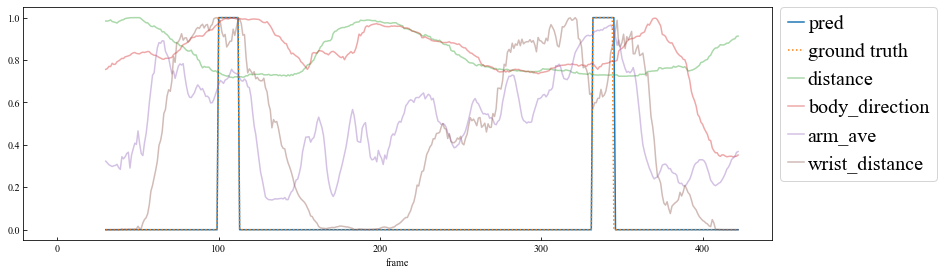

02_001_04_5_25


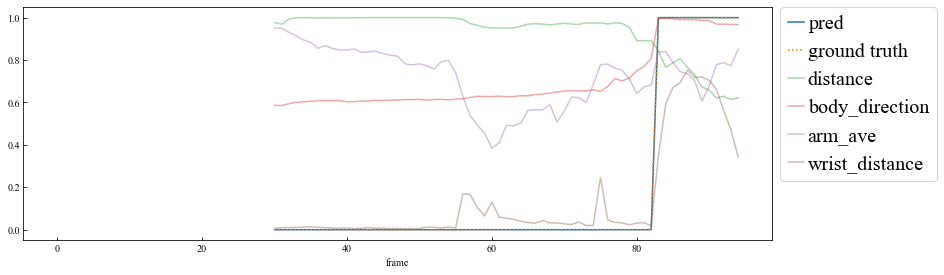

02_001_05_23_32


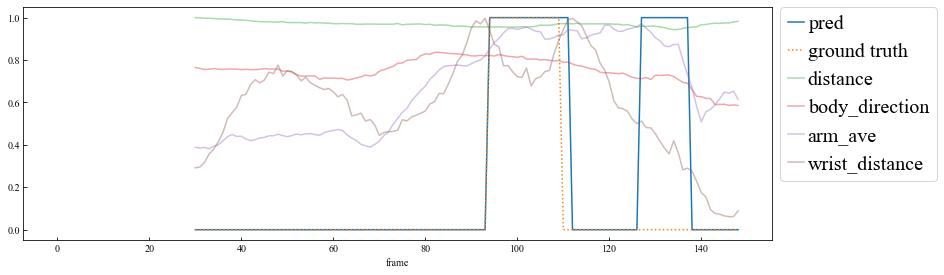

02_001_06_24_39


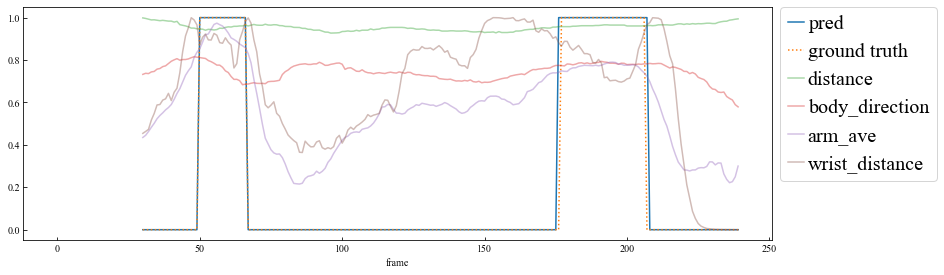

02_001_08_23_39


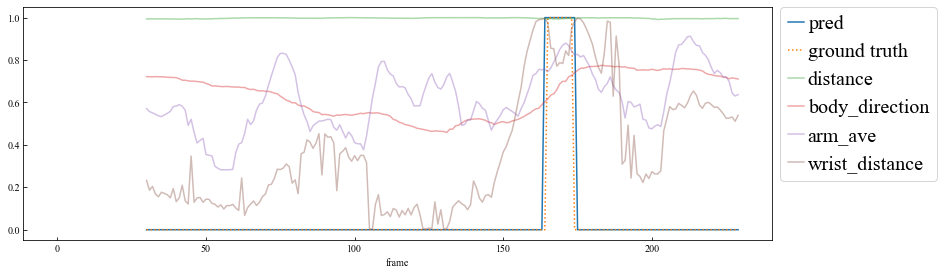

02_001_09_39_51


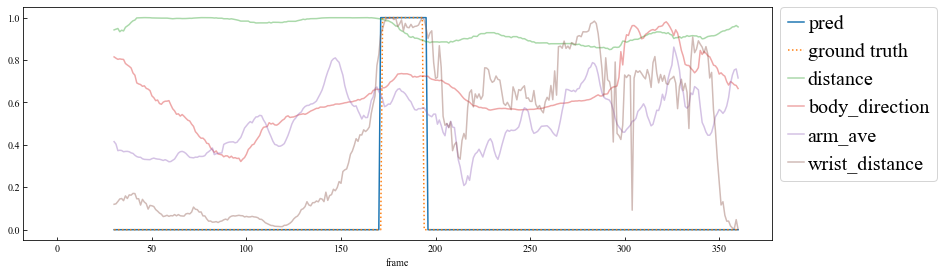

02_001_10_39_67


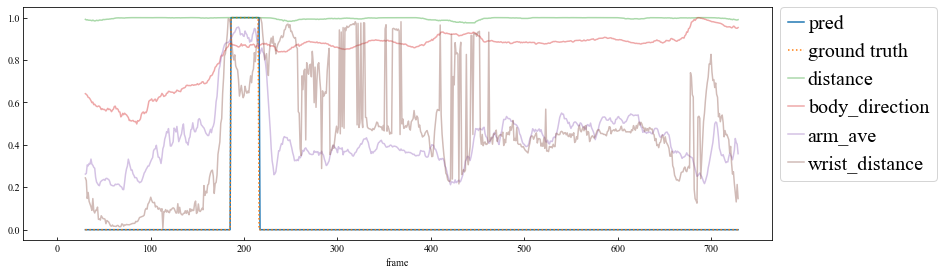

02_001_18_38_94


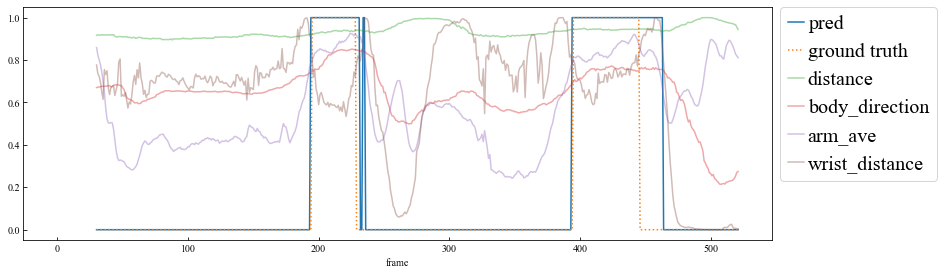

02_001_19_38_94


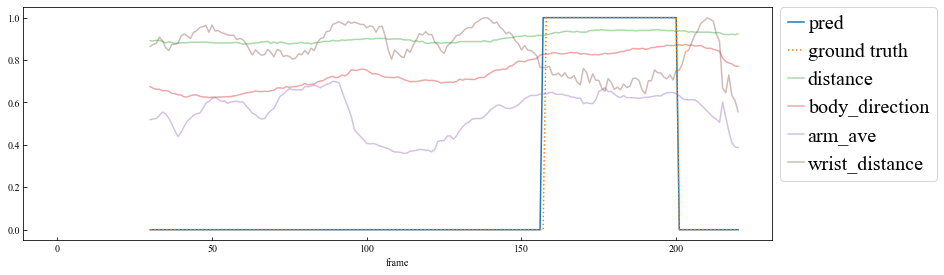

02_001_20_38_138


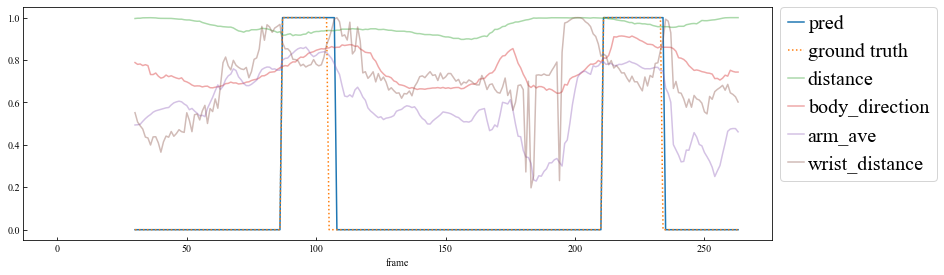

02_001_21_38_152


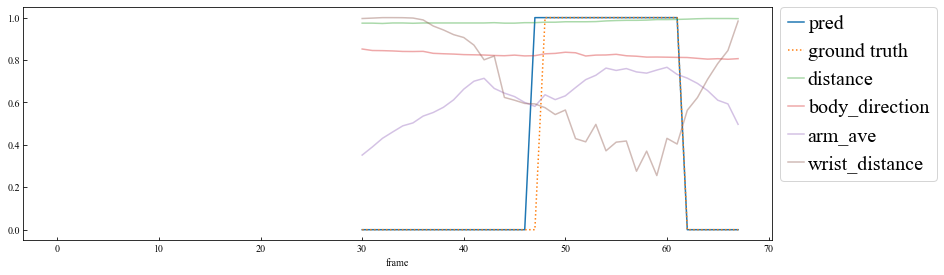

02_001_22_150_152


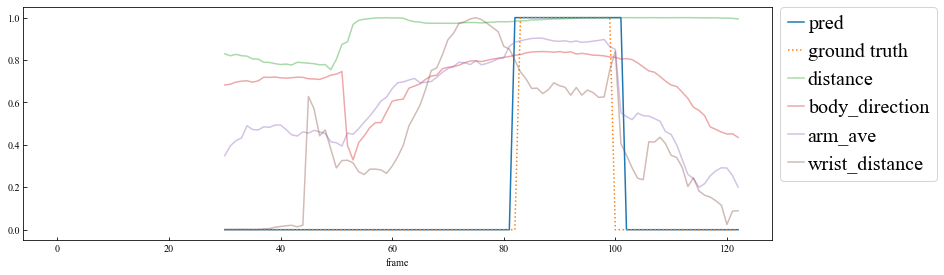

07_001_02_6_11


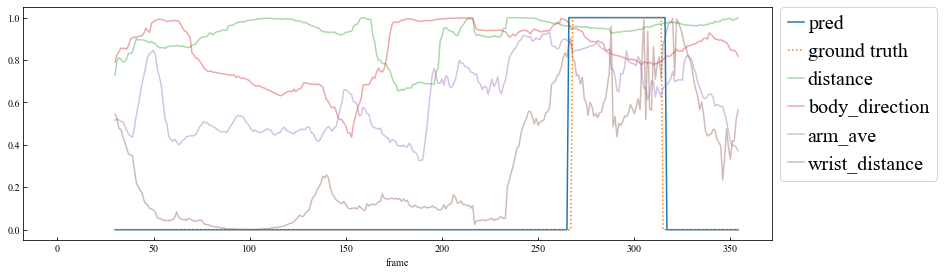

07_001_03_19_24


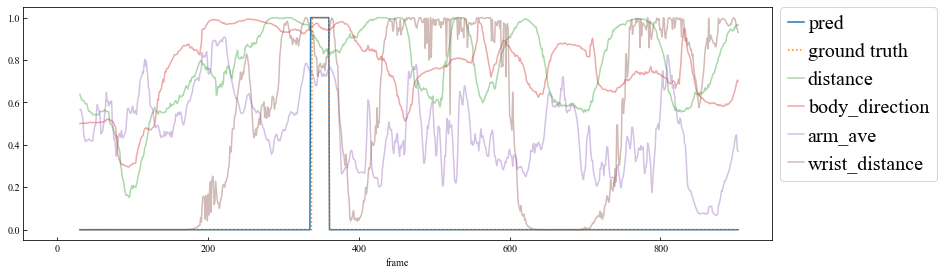

07_001_04_41_49


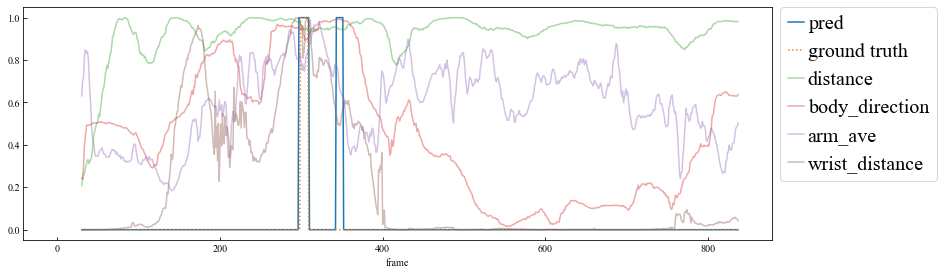

07_001_10_135_144


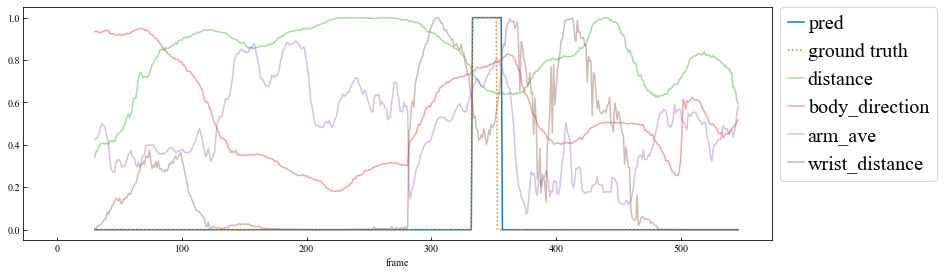

07_001_11_135_144


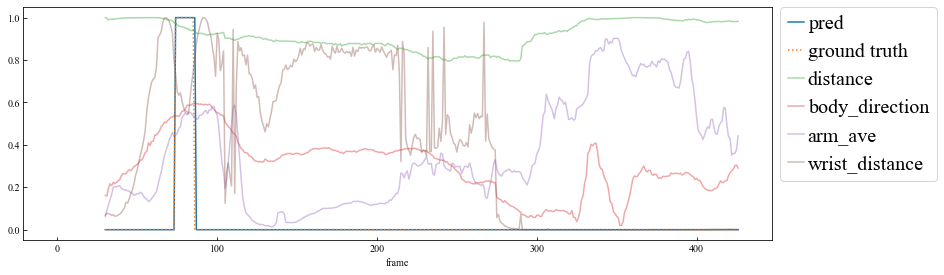

07_001_12_168_172


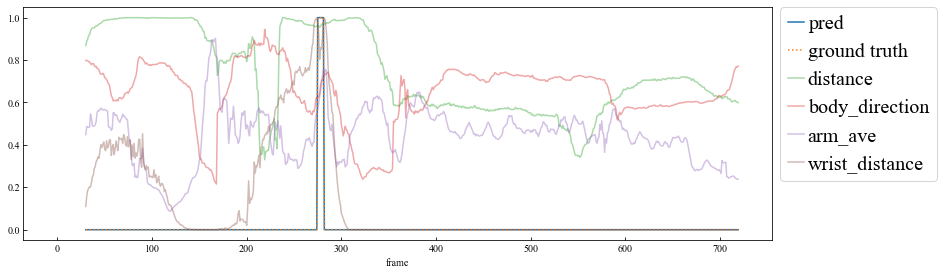

07_001_14_207_209


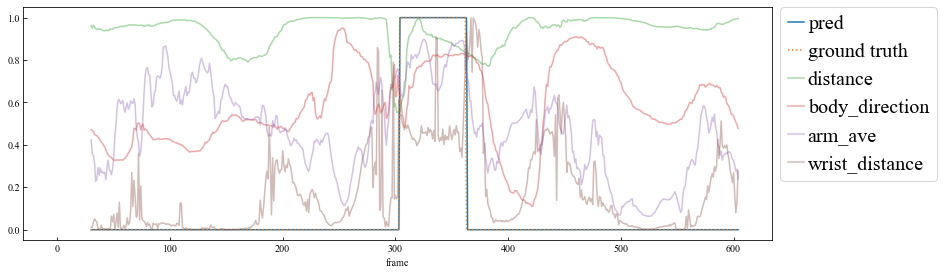

07_001_15_209_224


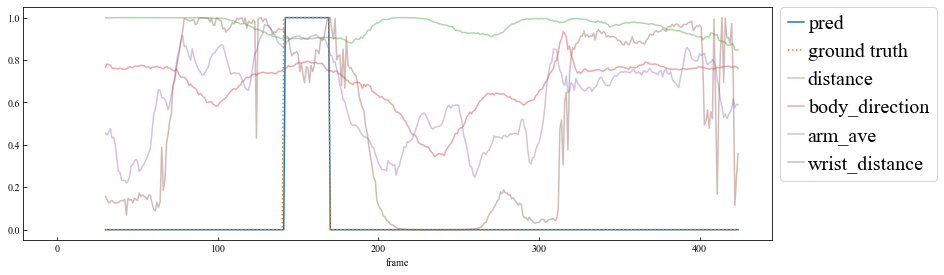

07_001_17_242_262


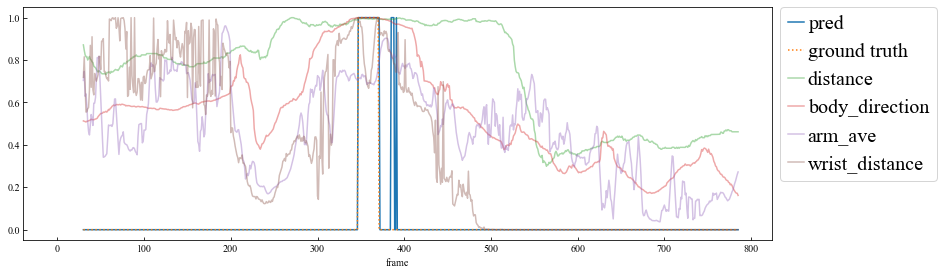

07_001_18_270_274


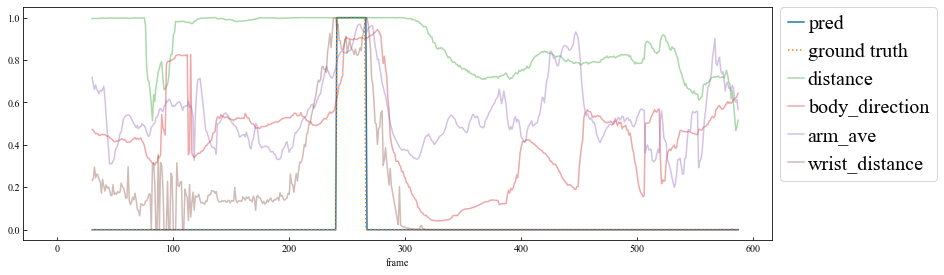

07_001_19_281_285


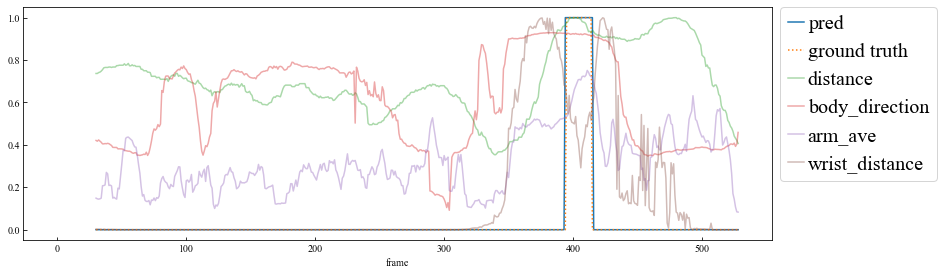

07_001_21_274_294


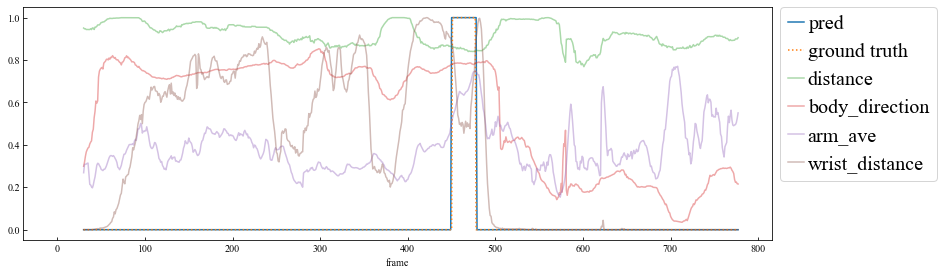

07_001_23_333_344


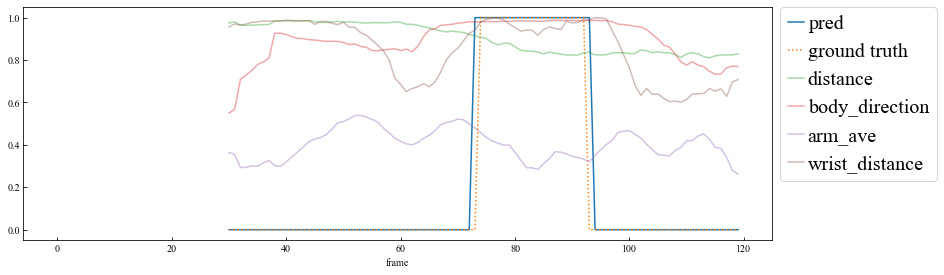

07_001_24_347_352


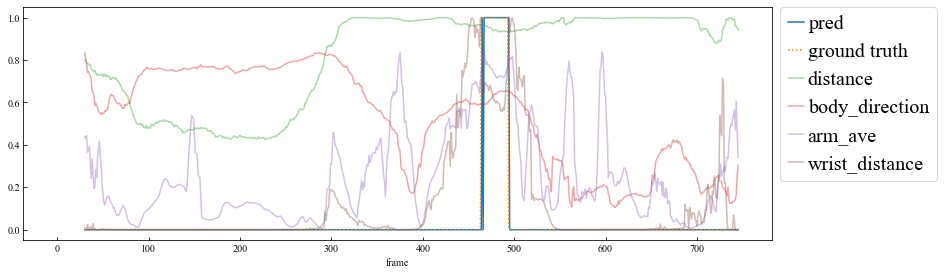

07_001_26_381_382


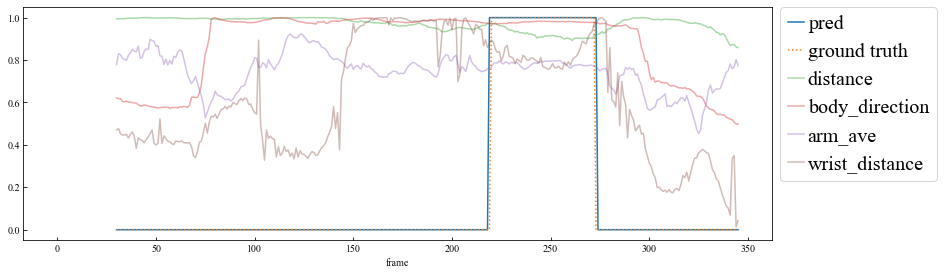

07_001_26_382_392


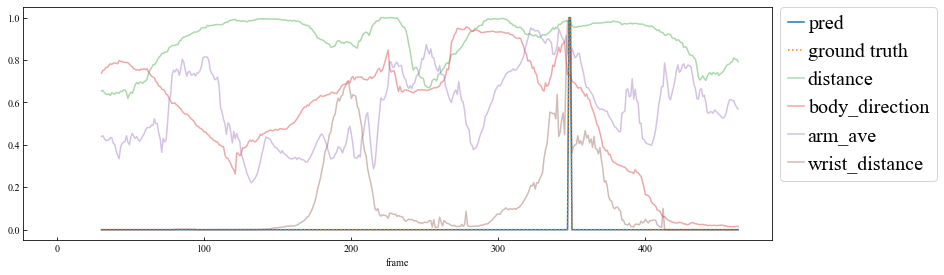

07_001_28_402_406


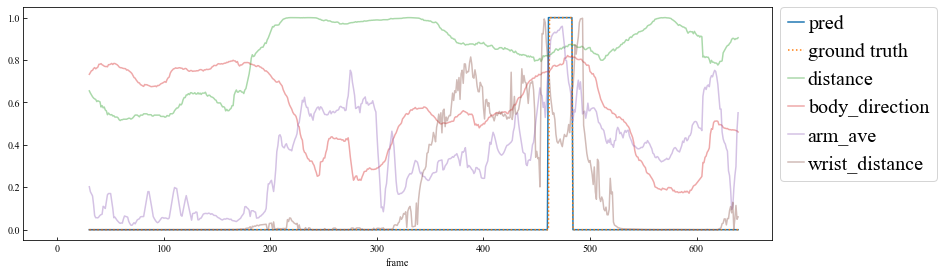

07_001_29_413_430


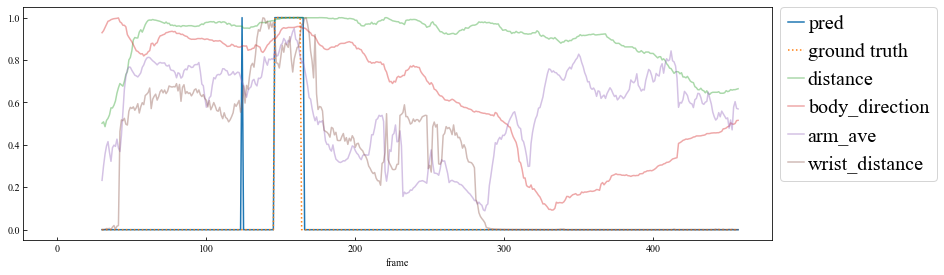

07_001_31_438_453


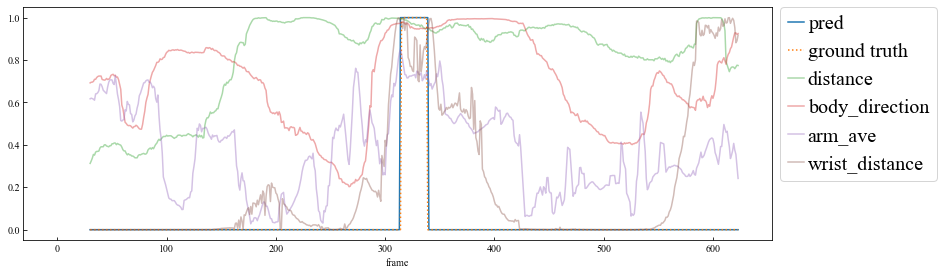

07_001_32_466_468


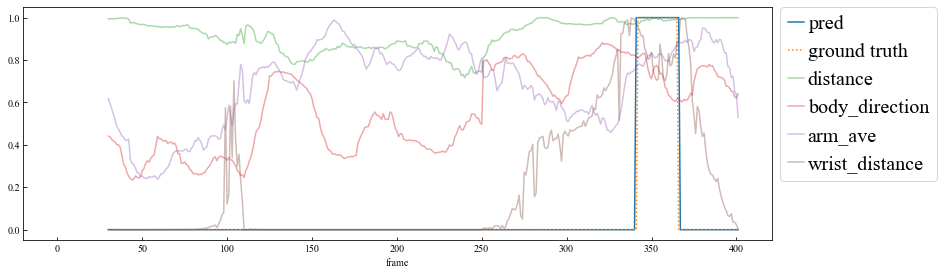

07_001_33_466_483


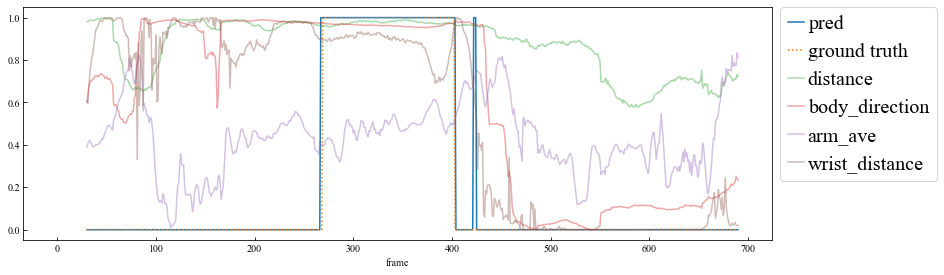

07_001_34_482_483


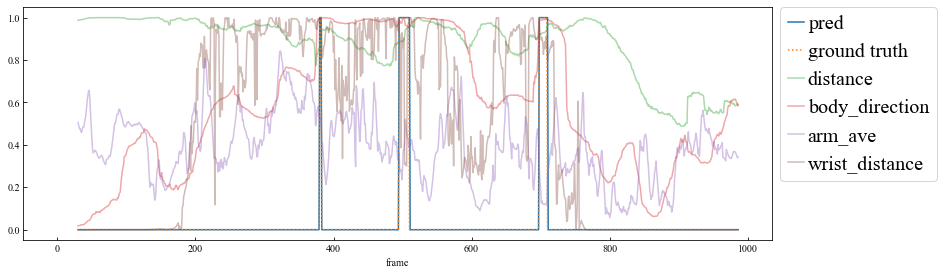

07_001_35_482_483


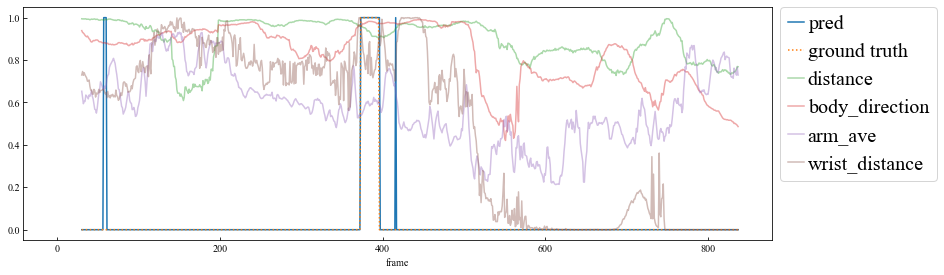

07_001_36_482_520


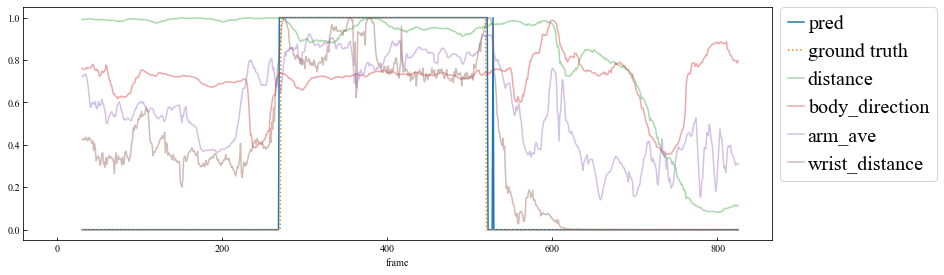

07_001_37_520_542


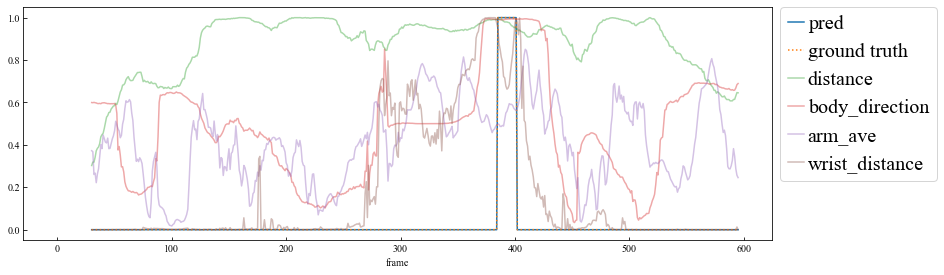

07_001_38_520_565


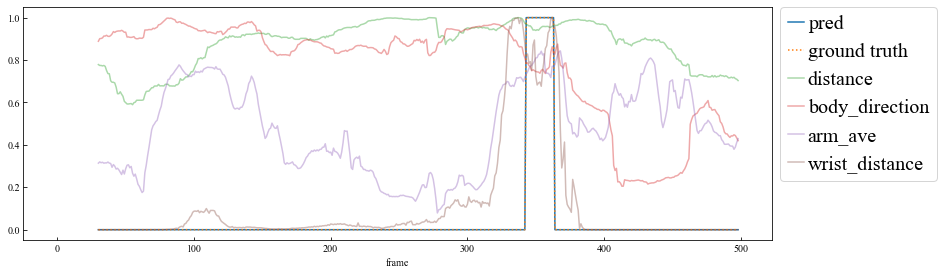

07_001_39_520_565


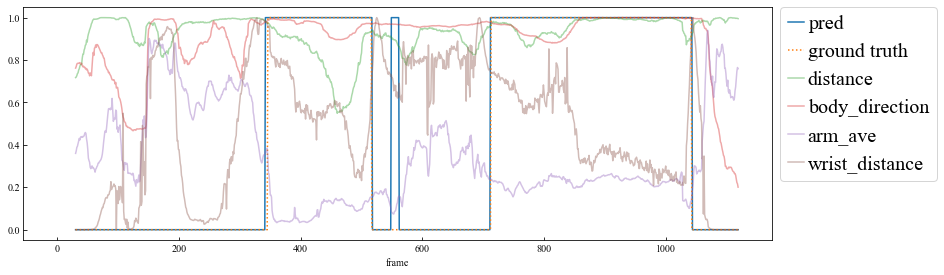

07_001_40_520_565


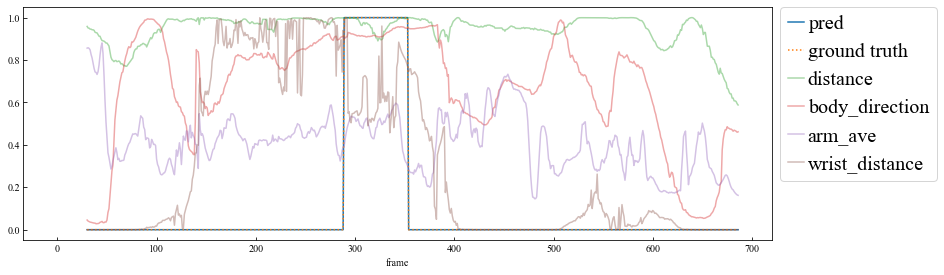

07_001_44_609_610


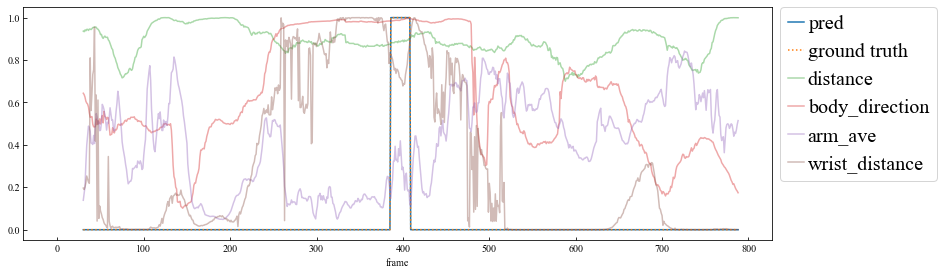

07_001_45_610_629


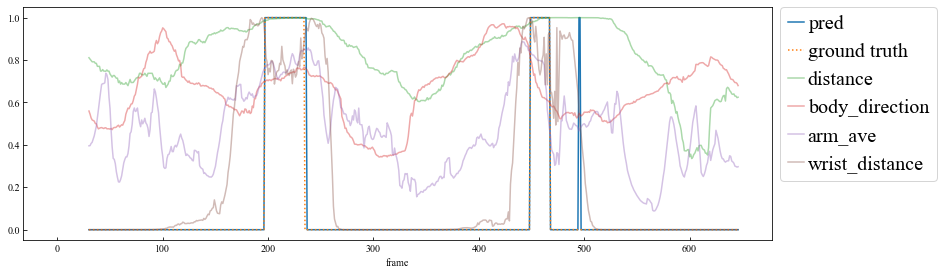

07_001_46_628_629


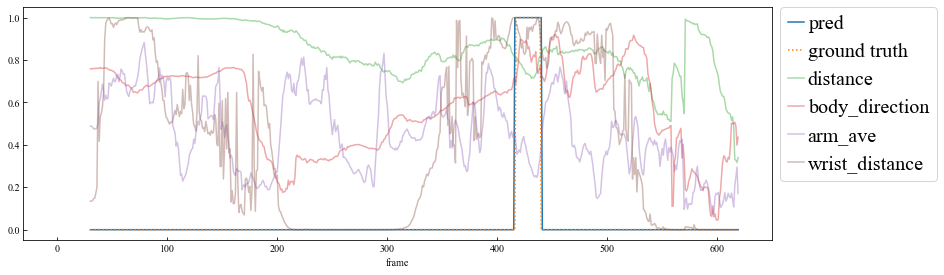

07_001_47_640_646


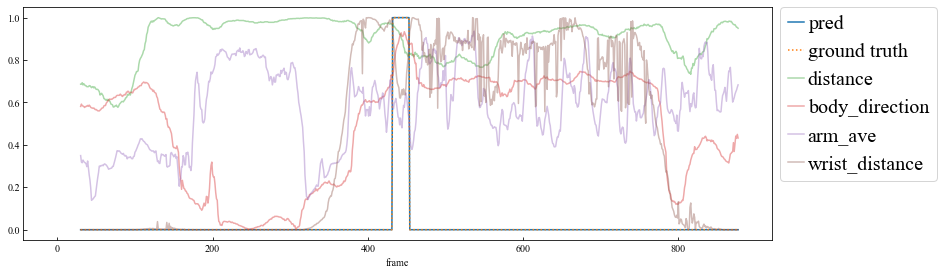

07_001_48_640_649


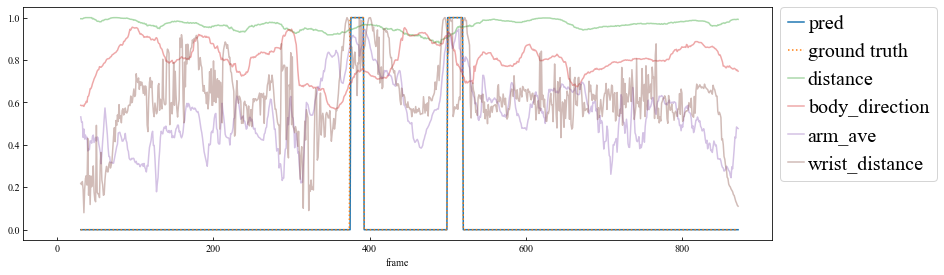

07_001_49_640_649


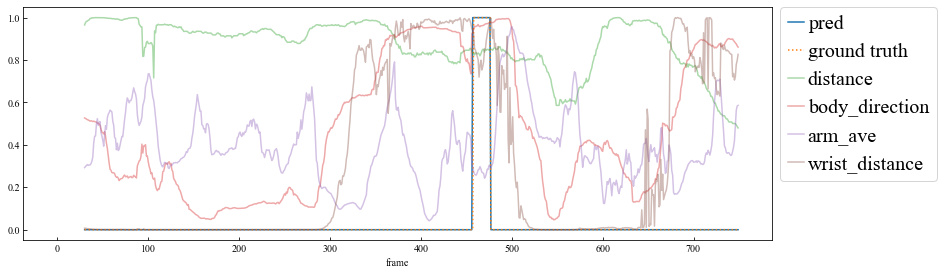

07_001_50_649_661


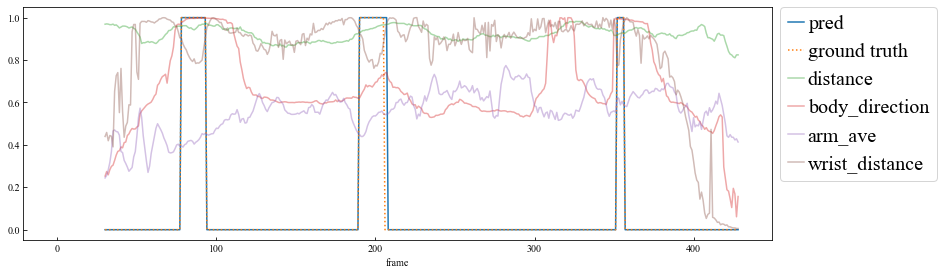

08_001_01_1_8


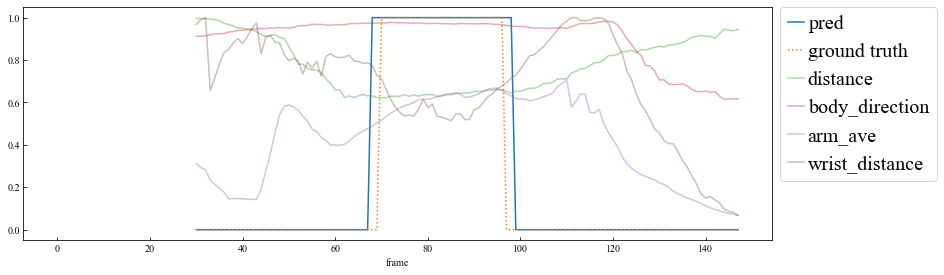

08_001_03_1_15


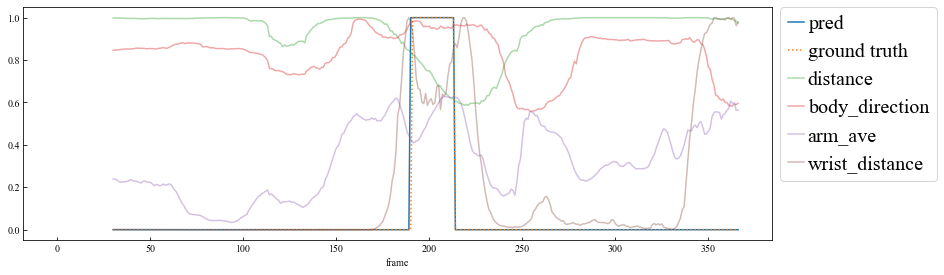

08_001_05_1_29


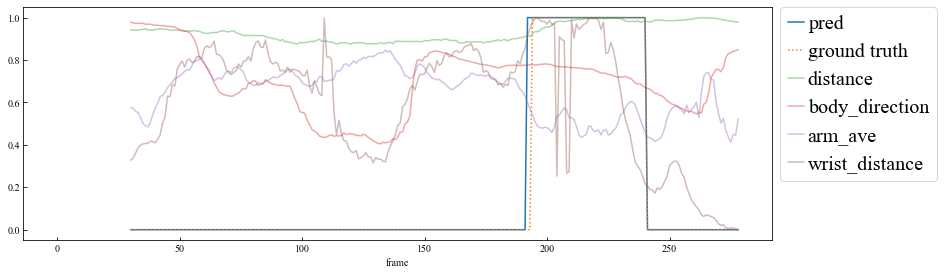

08_001_06_35_36


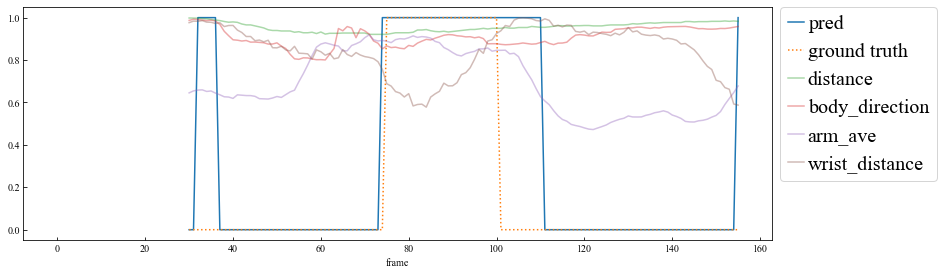

08_001_07_29_39


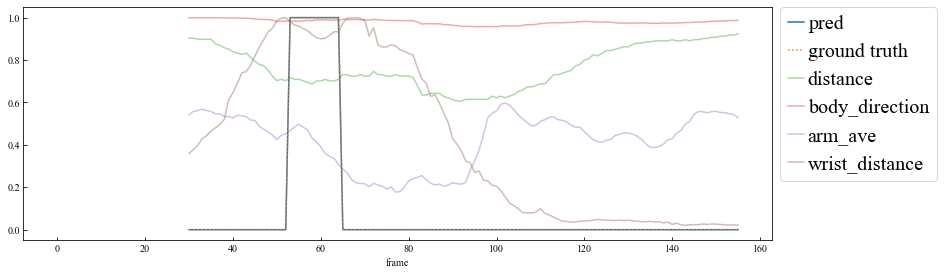

08_001_08_34_43


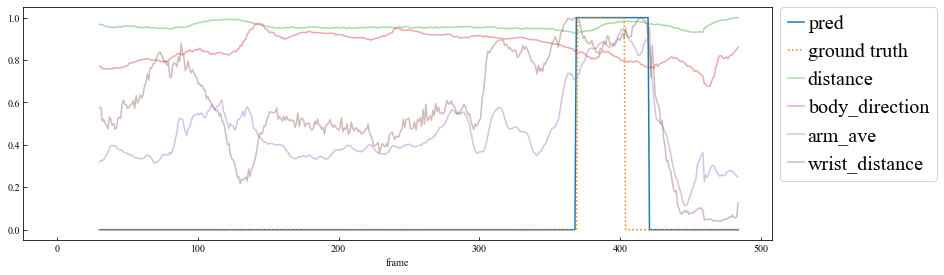

08_001_11_43_51


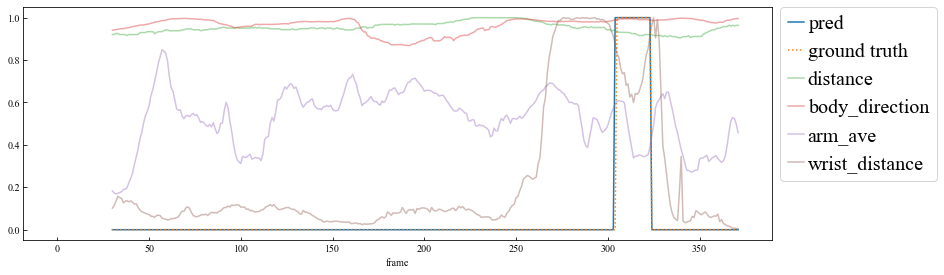

08_001_12_43_68


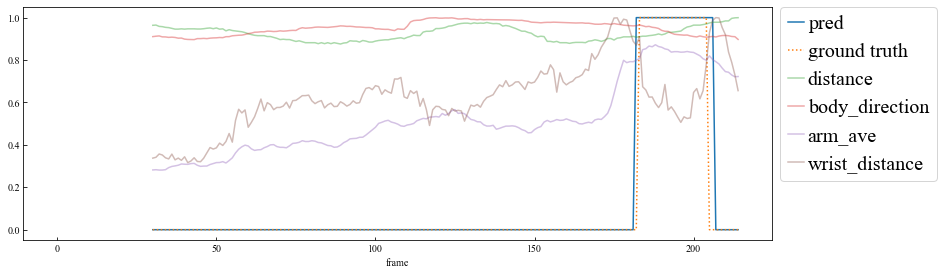

08_001_13_43_68


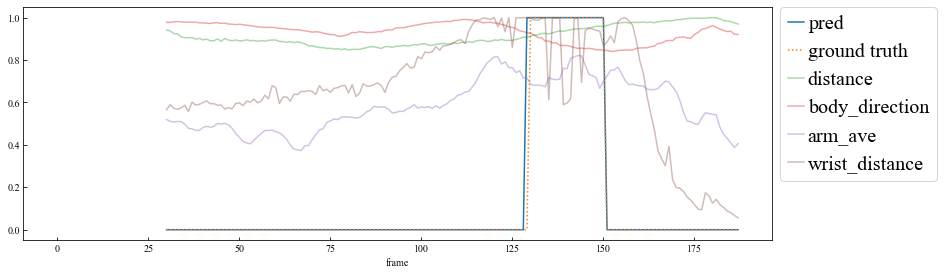

08_001_15_43_77


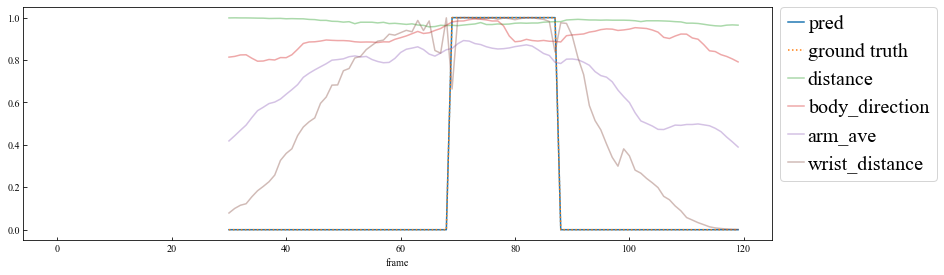

08_001_16_43_97


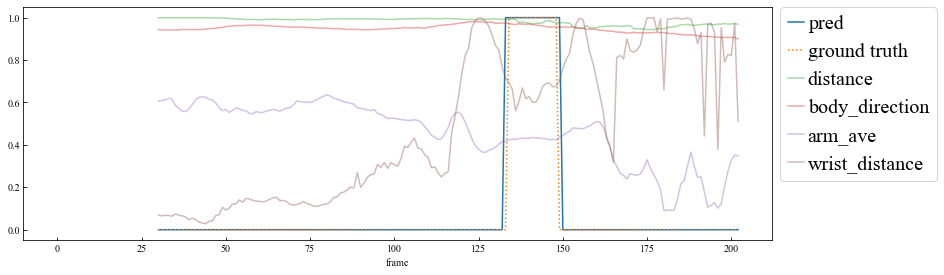

08_001_17_97_100


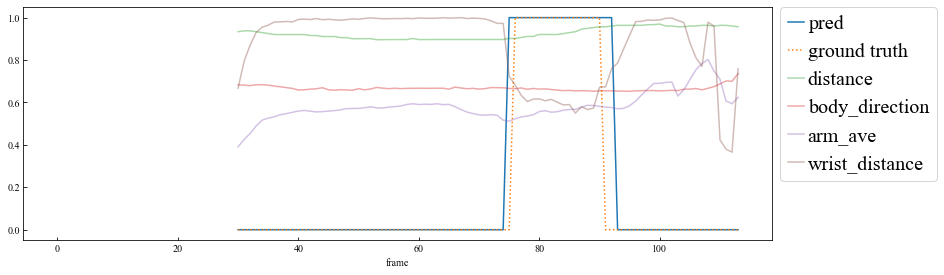

08_001_19_43_103


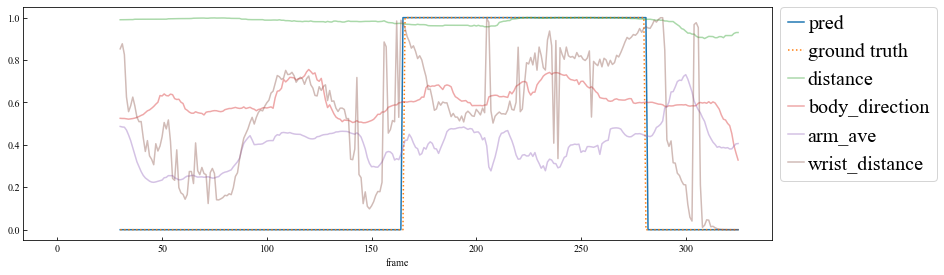

08_001_21_103_111


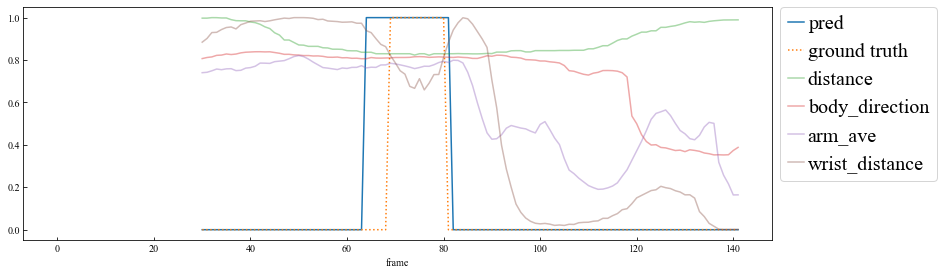

08_001_26_111_141


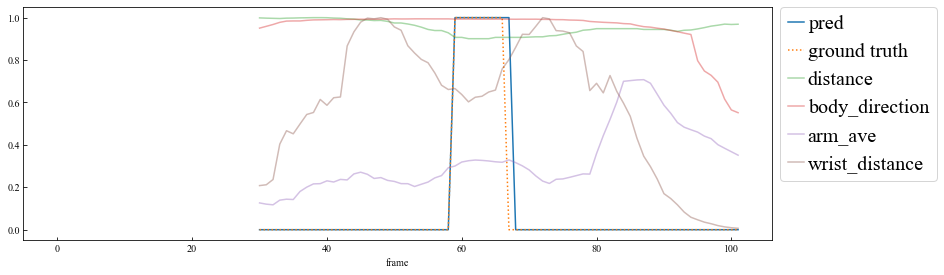

08_001_27_111_145


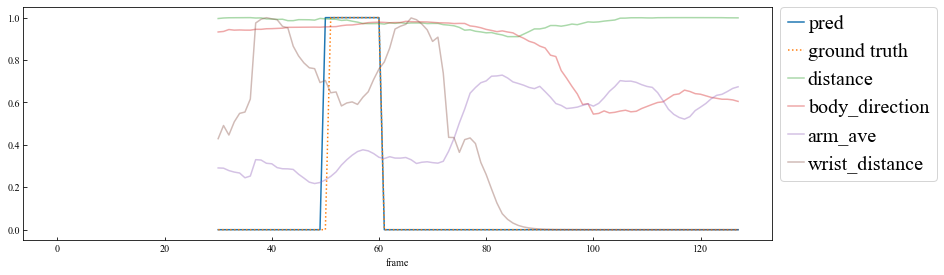

08_001_29_145_151


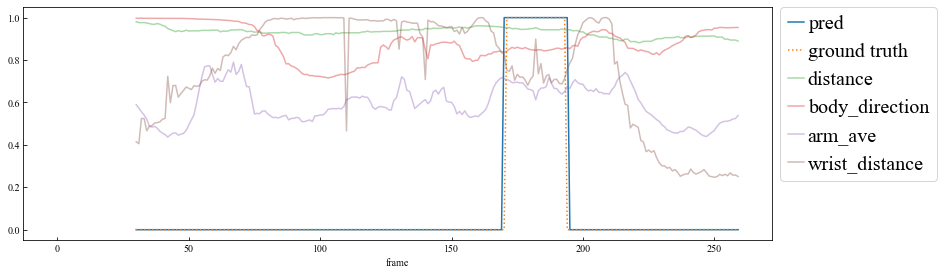

08_001_30_151_157


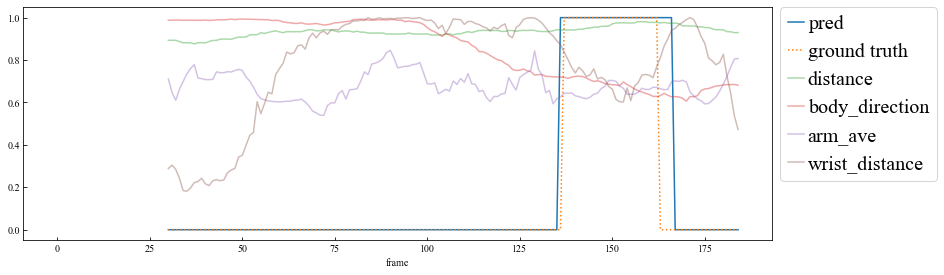

08_001_31_151_168


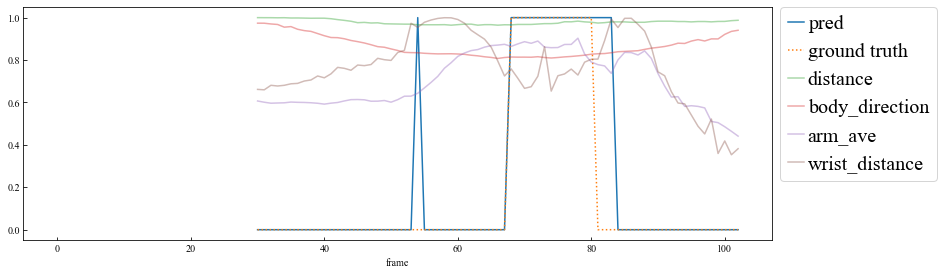

08_001_32_167_172


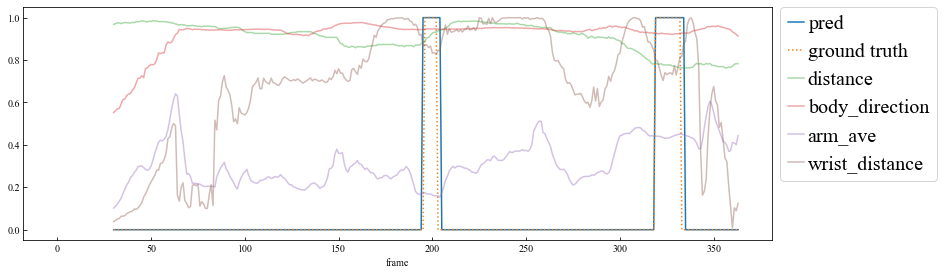

08_001_33_167_172


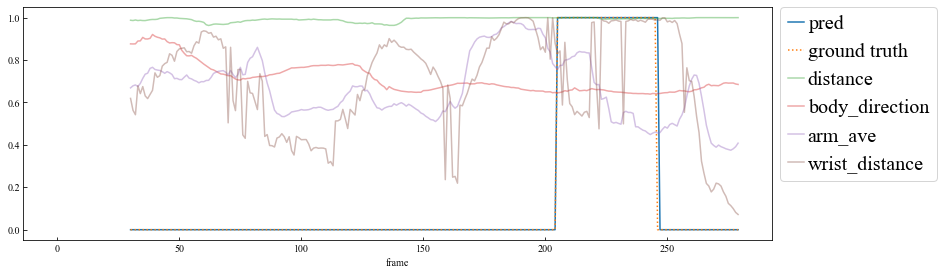

08_001_34_158_172


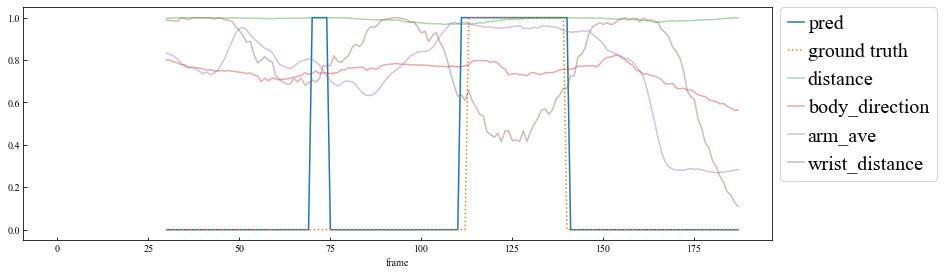

08_001_35_158_172


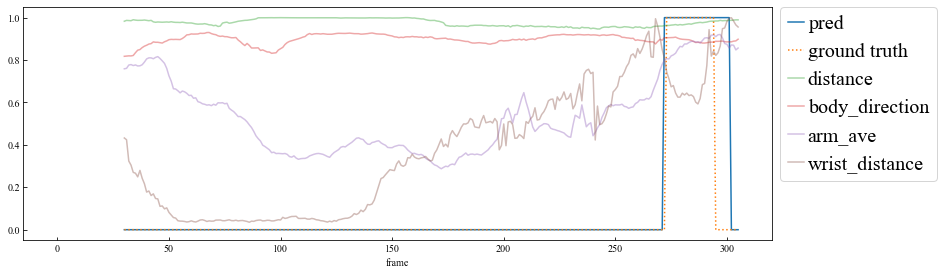

08_001_36_158_183


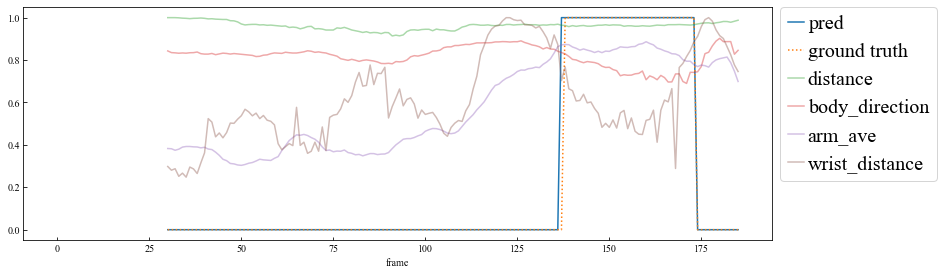

08_001_37_158_172


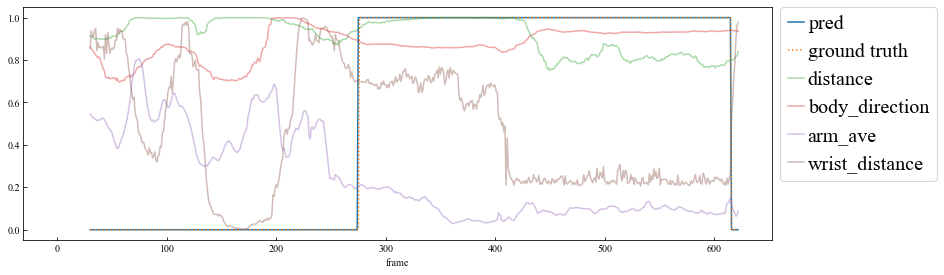

08_001_38_158_172


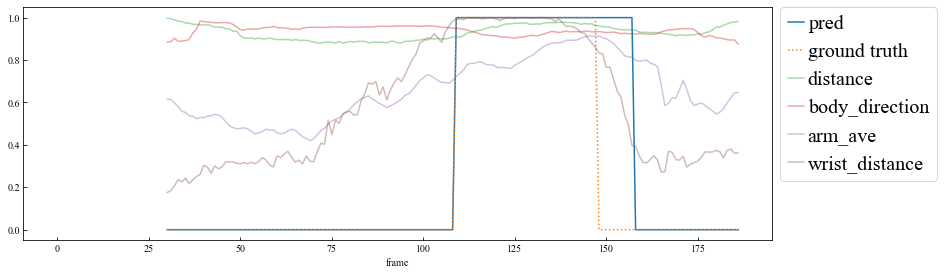

08_001_39_158_203


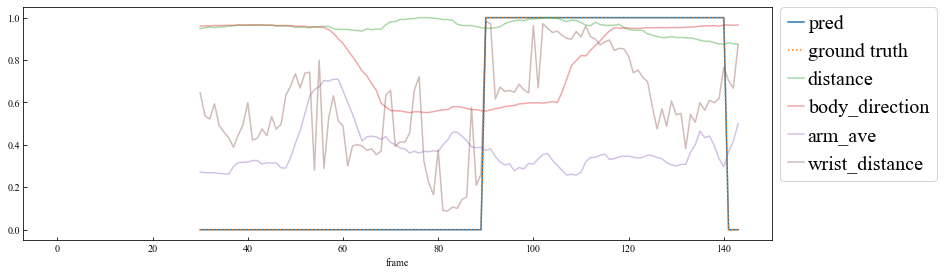

08_001_40_203_210


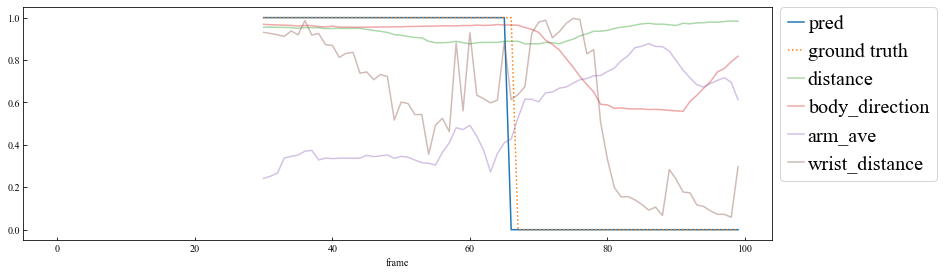

08_002_01_7_10


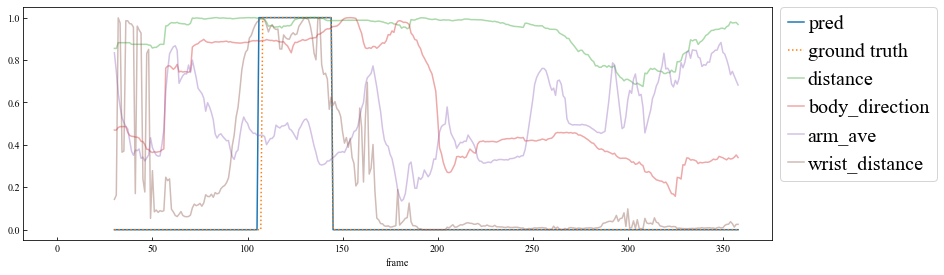

08_002_02_10_30


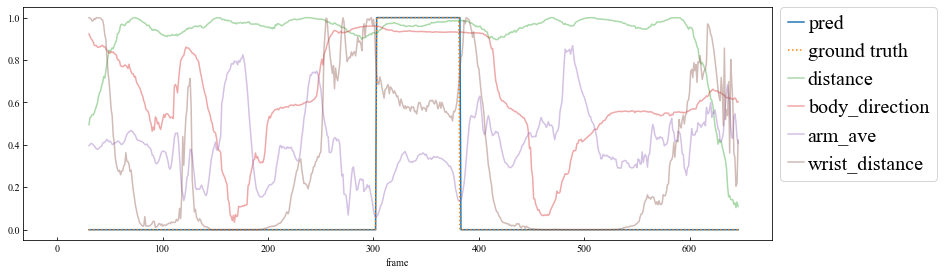

08_002_03_37_41


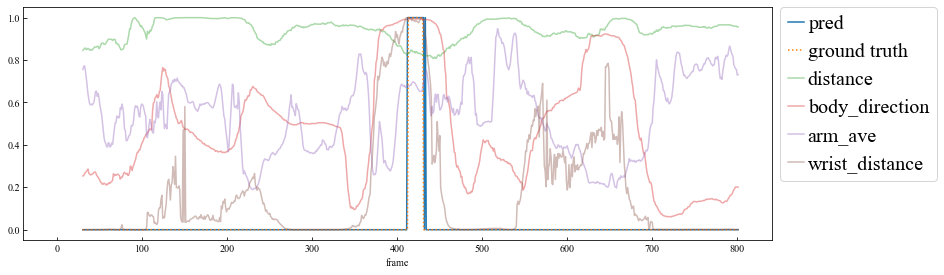

08_002_05_52_61


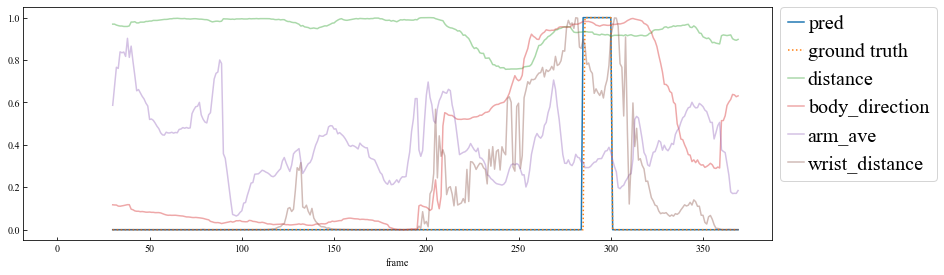

08_002_06_71_72


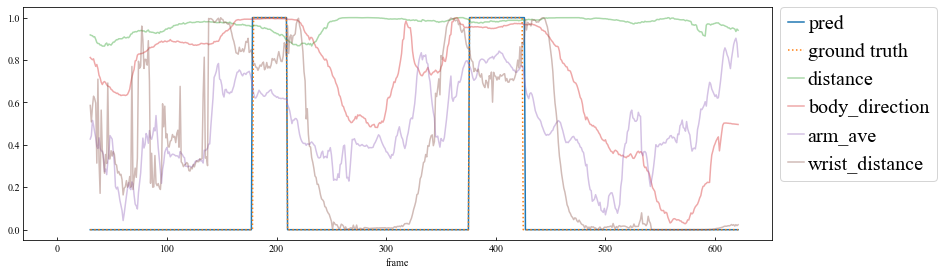

08_002_07_72_85


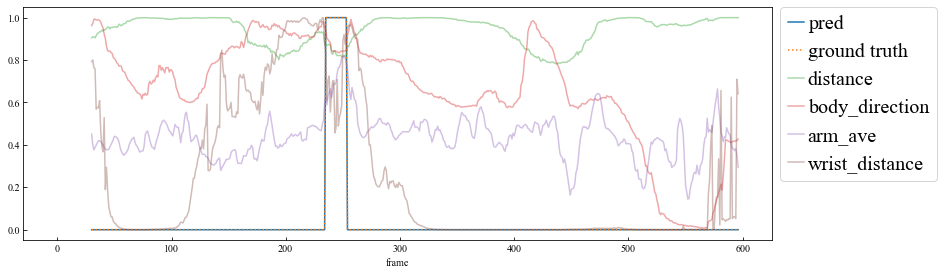

08_002_08_72_98


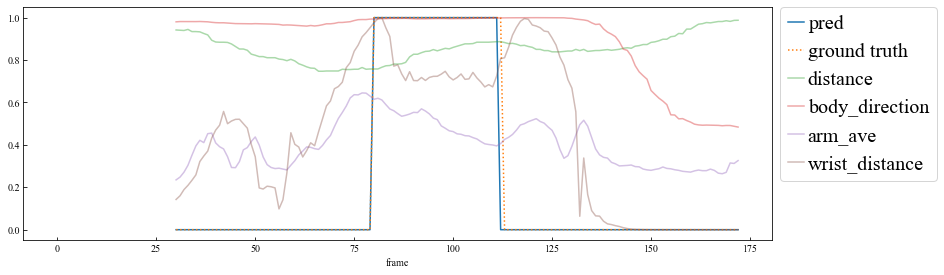

08_002_09_72_102


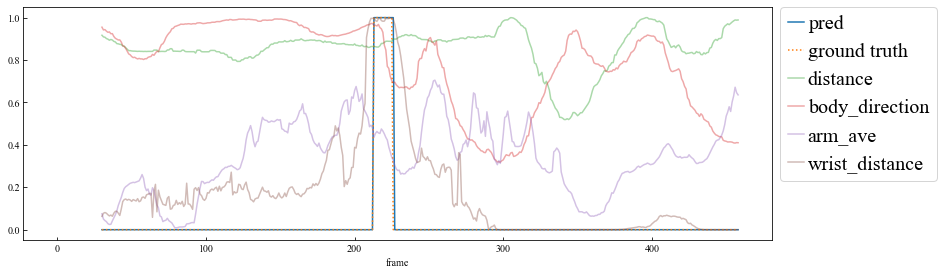

08_002_09_72_106


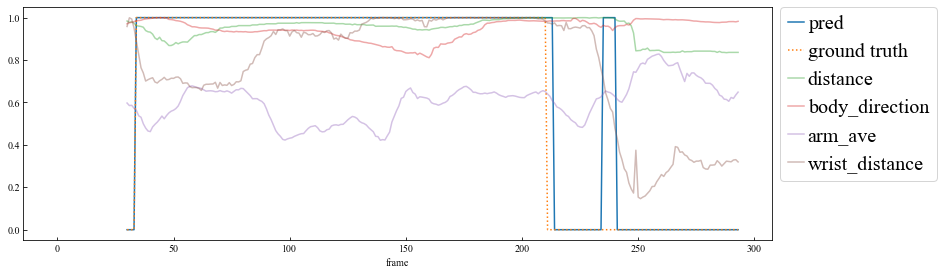

08_002_10_72_110


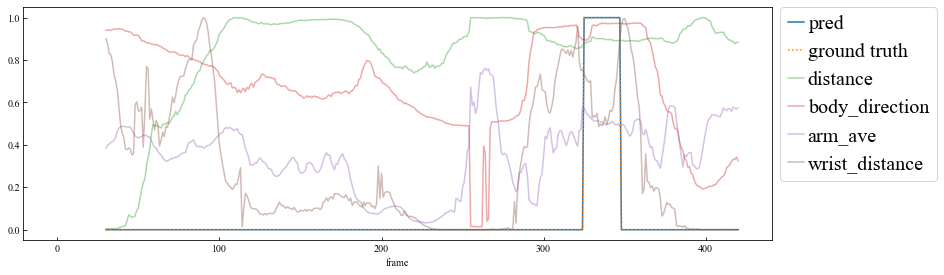

08_002_12_125_129


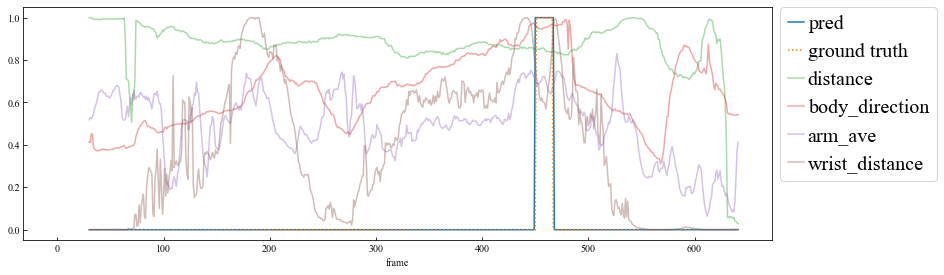

08_002_14_154_159


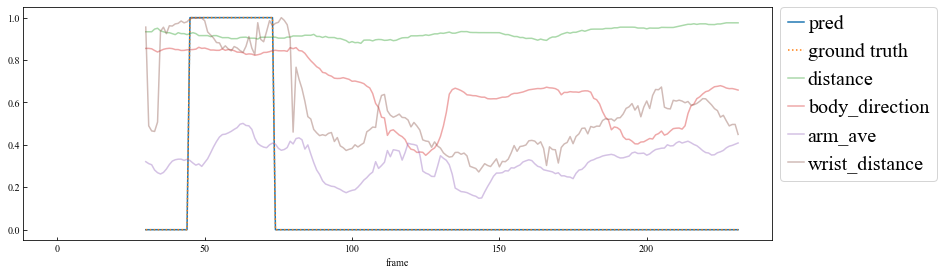

08_002_15_153_154


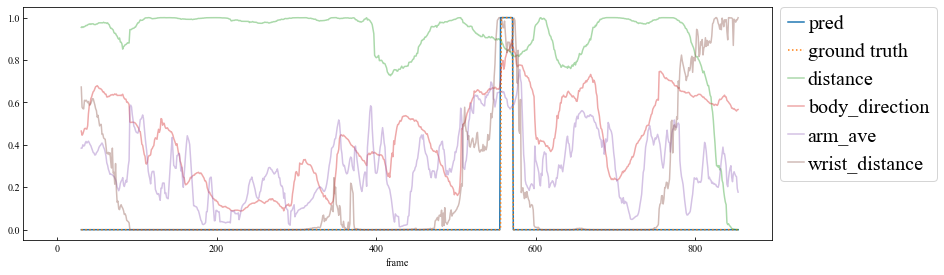

08_002_16_153_182


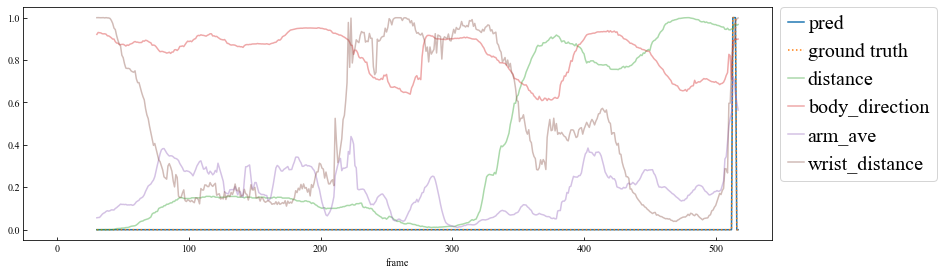

08_002_16_165_182


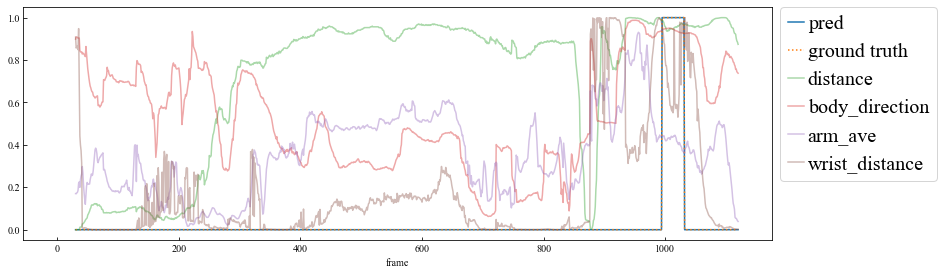

08_002_17_182_206


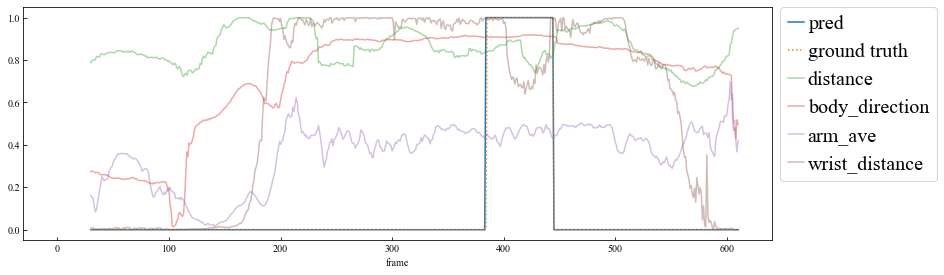

08_002_20_226_229


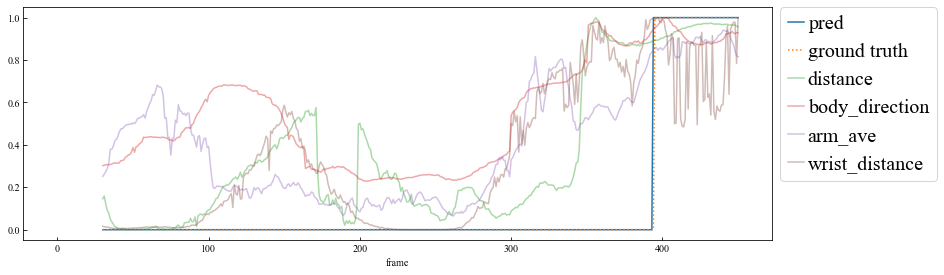

08_002_20_226_236


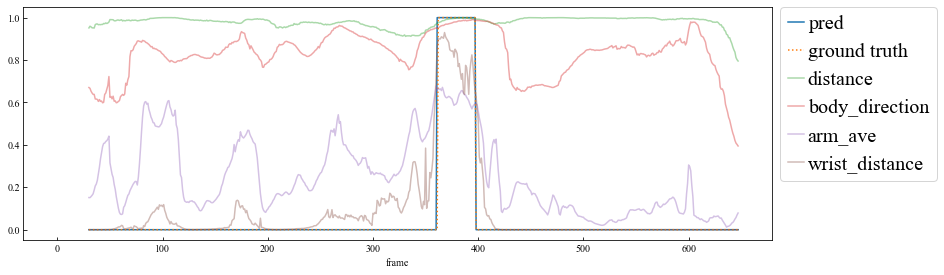

08_002_21_225_232


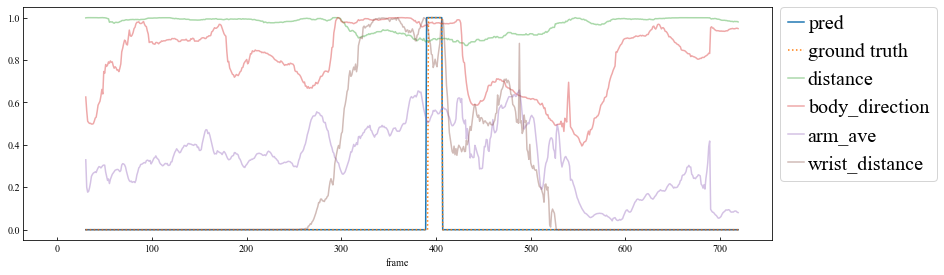

08_002_22_253_256


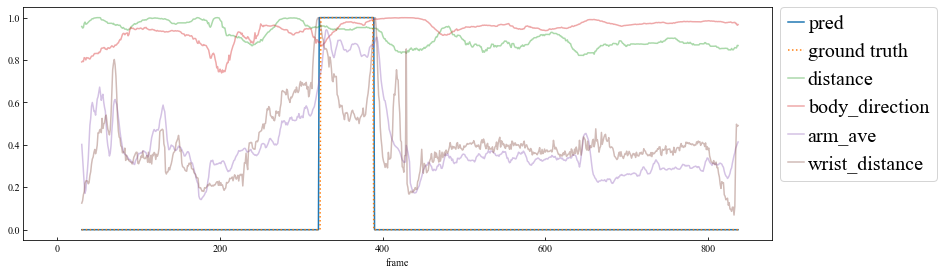

08_002_23_253_266


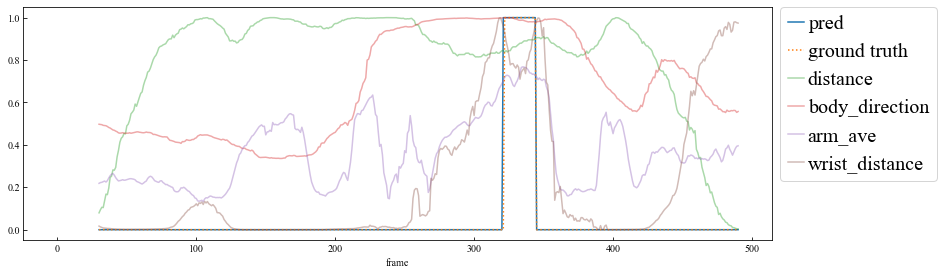

08_002_24_272_276


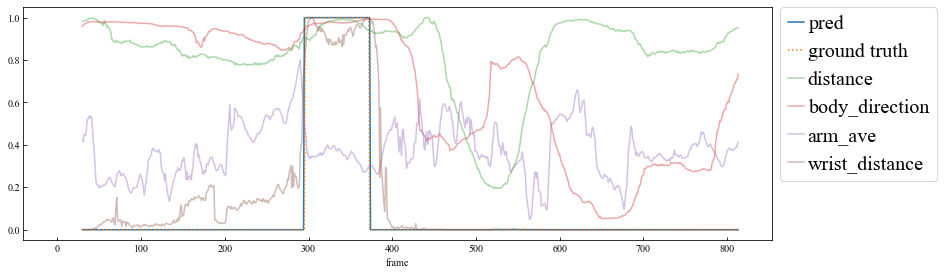

08_002_25_284_289


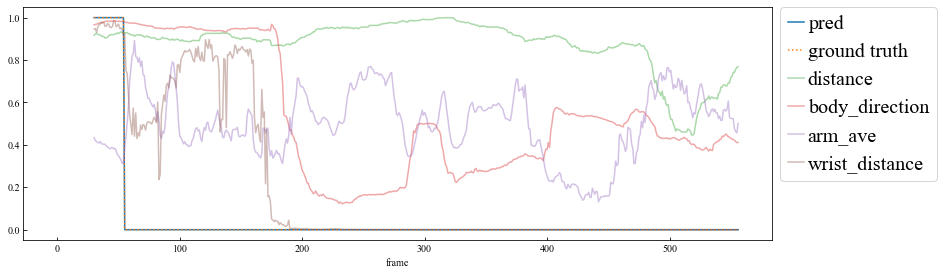

08_002_26_289_295


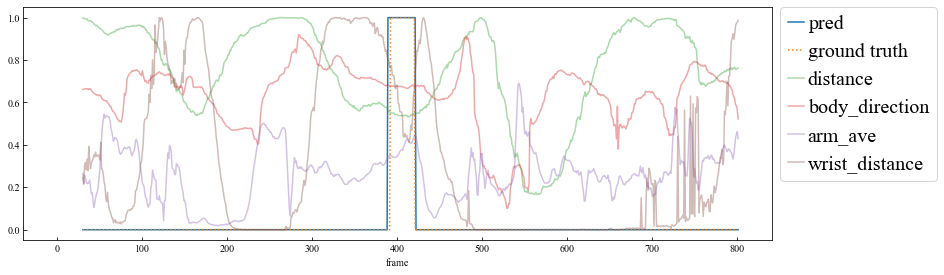

08_002_27_289_315


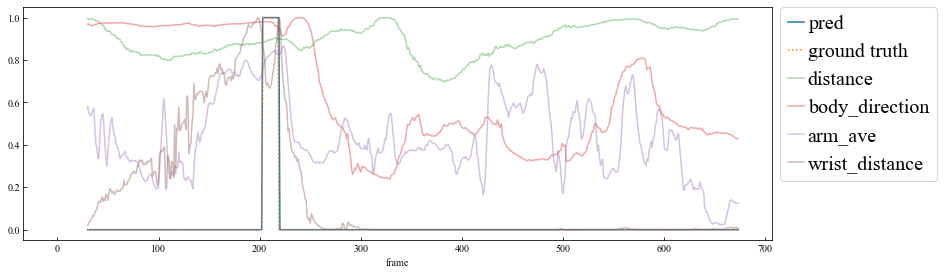

08_002_28_289_320


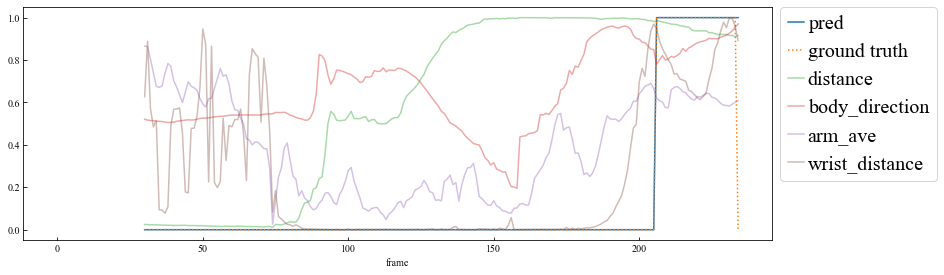

08_002_29_320_331


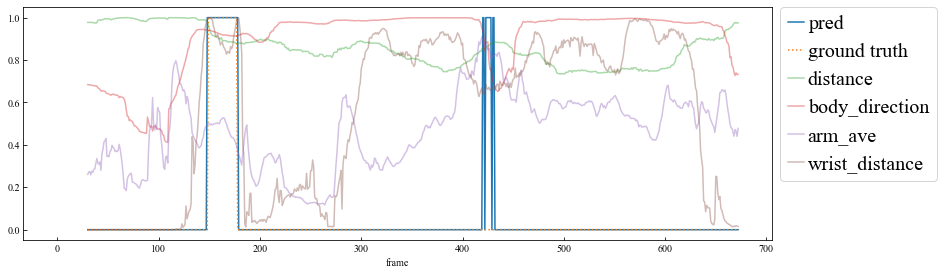

08_002_30_338_340


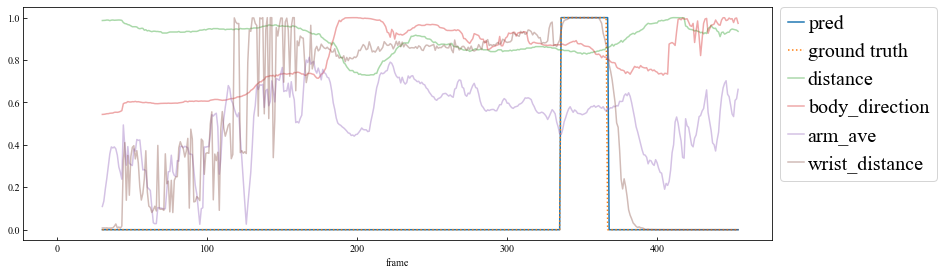

08_002_31_331_349


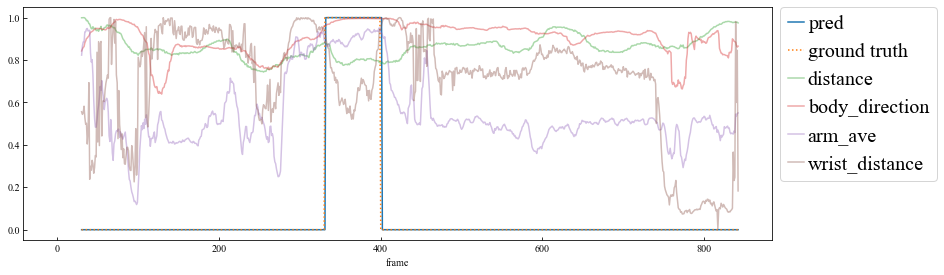

08_002_32_331_349


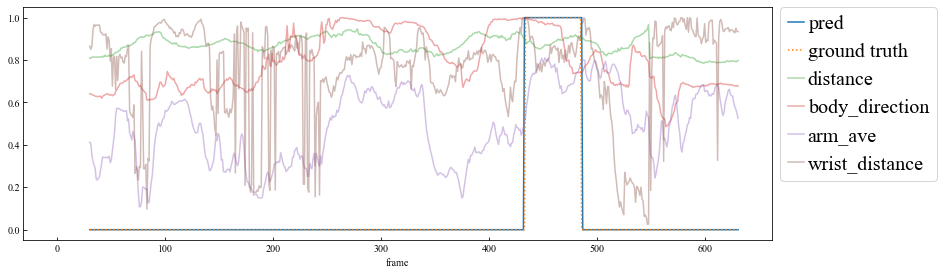

08_002_33_331_349


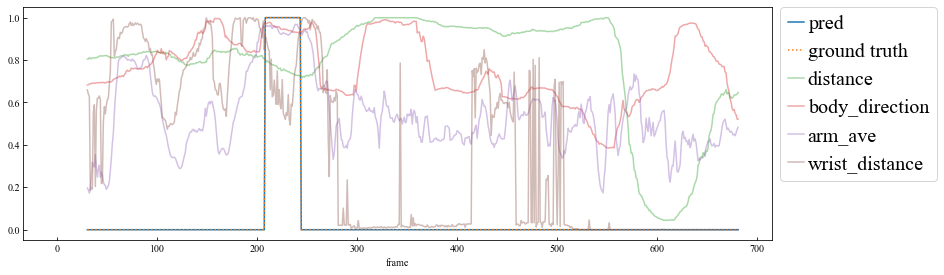

08_002_36_390_391


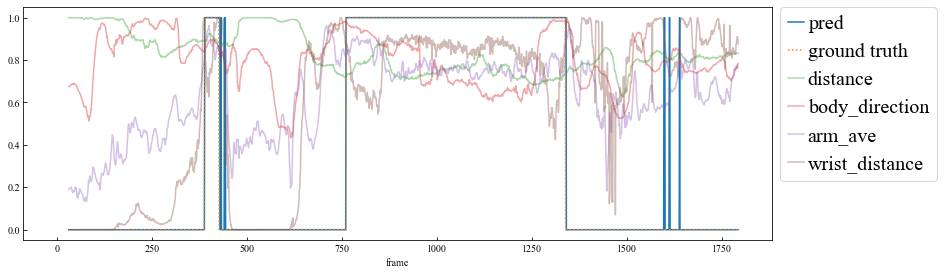

08_002_37_390_391


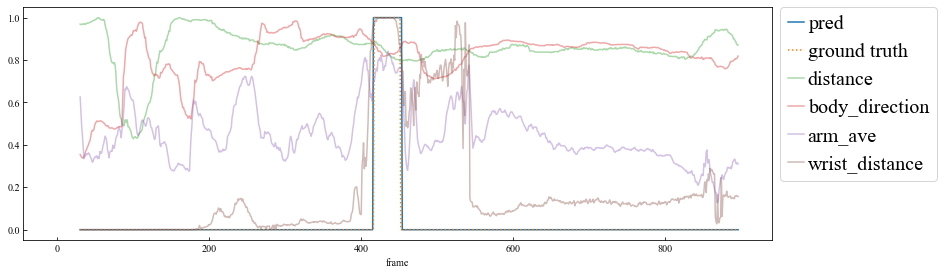

08_002_39_390_426


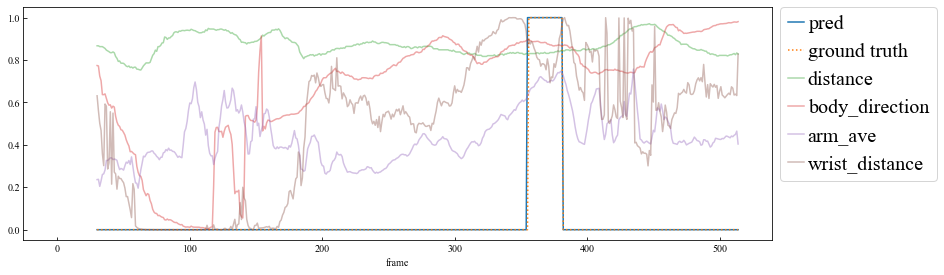

08_002_40_426_433


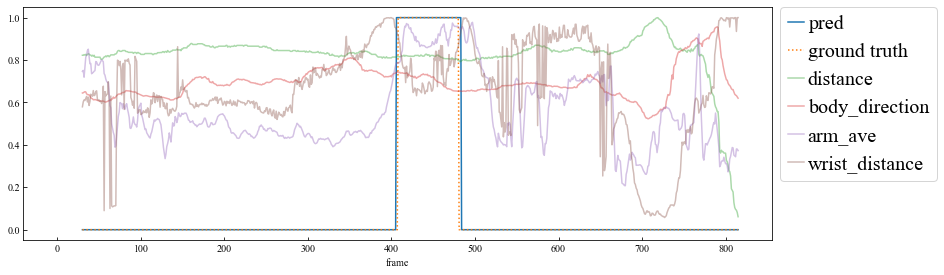

08_002_41_426_433


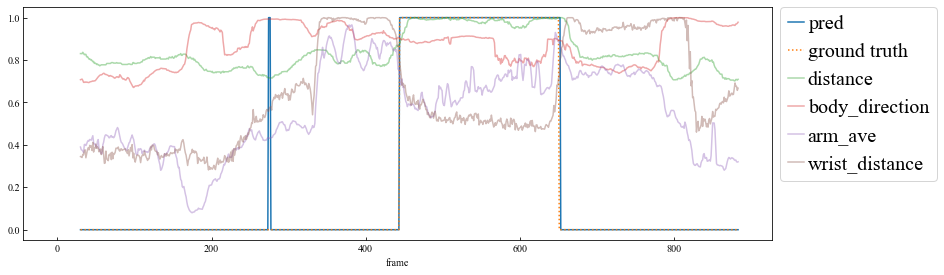

08_002_43_426_433


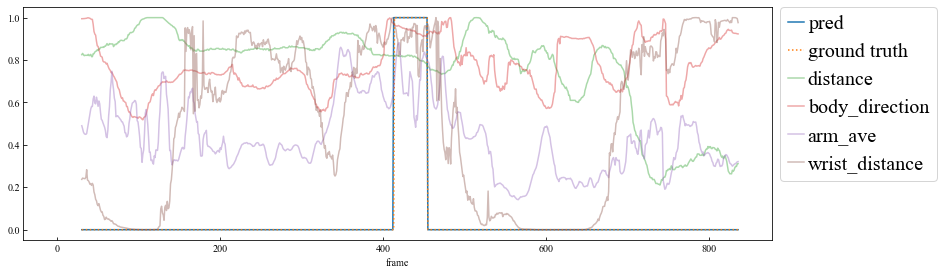

08_002_45_433_466


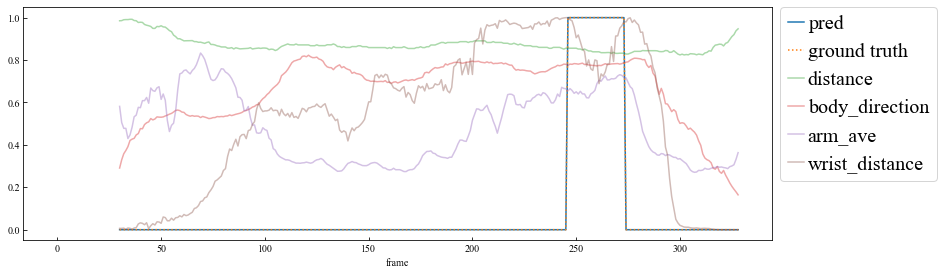

08_002_45_433_467


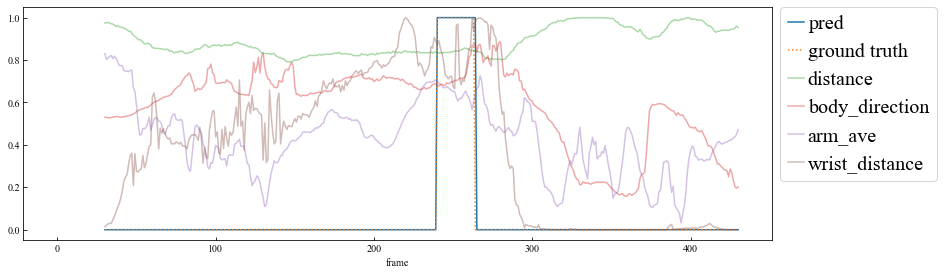

09_001_01_2_9


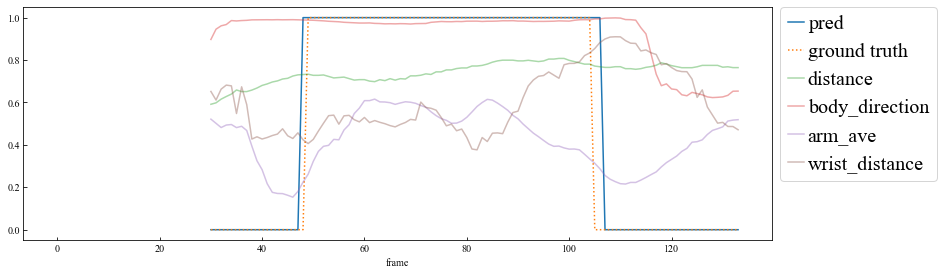

09_001_03_29_32


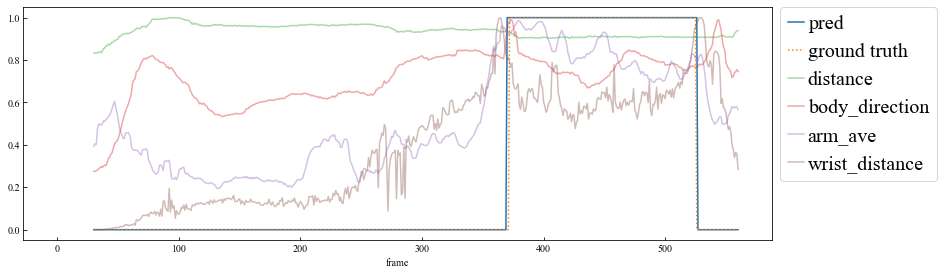

09_001_04_29_30


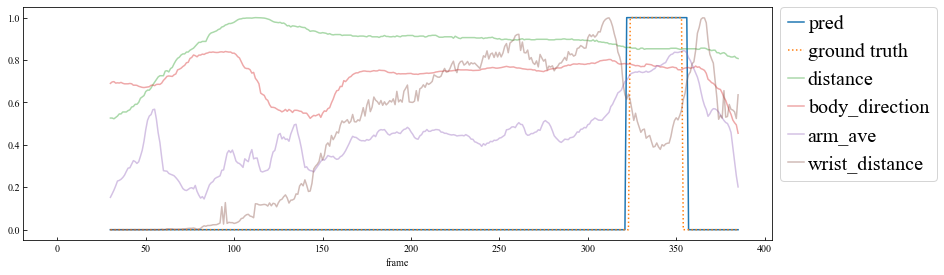

09_001_06_29_46


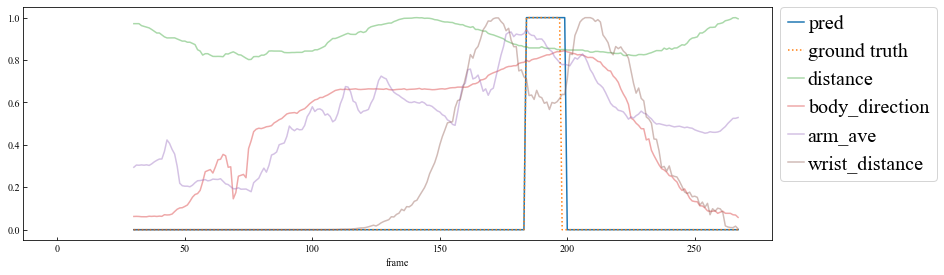

09_001_07_15_50


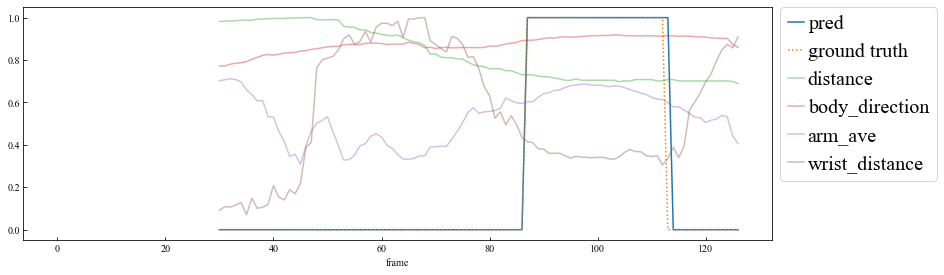

09_001_08_15_50


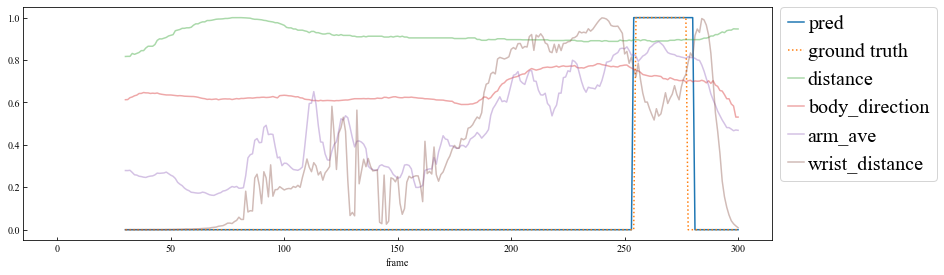

09_001_09_15_50


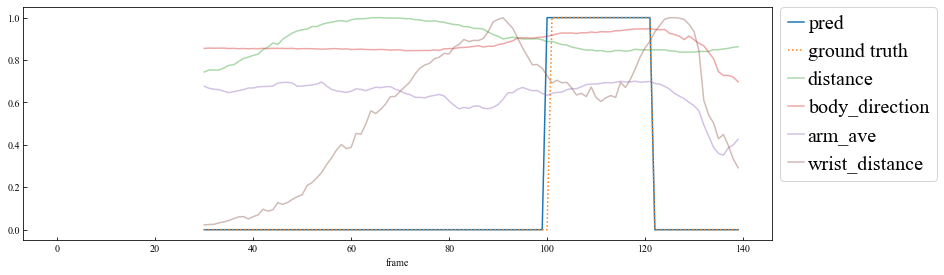

09_002_01_4_6


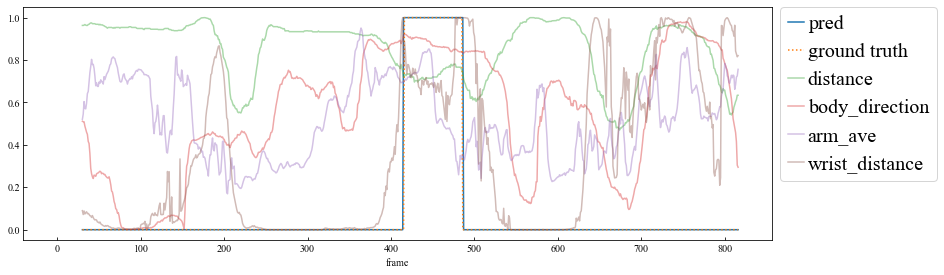

09_002_02_8_18


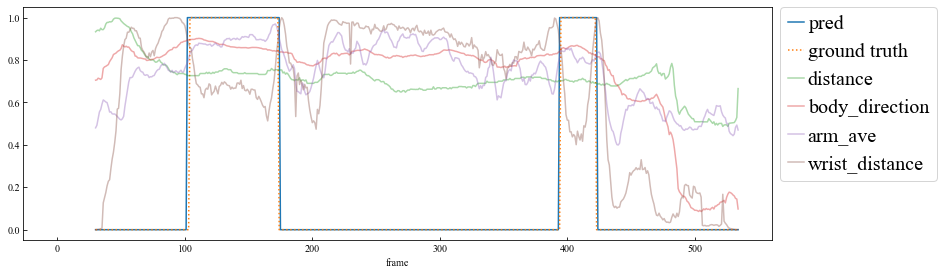

09_002_03_26_27


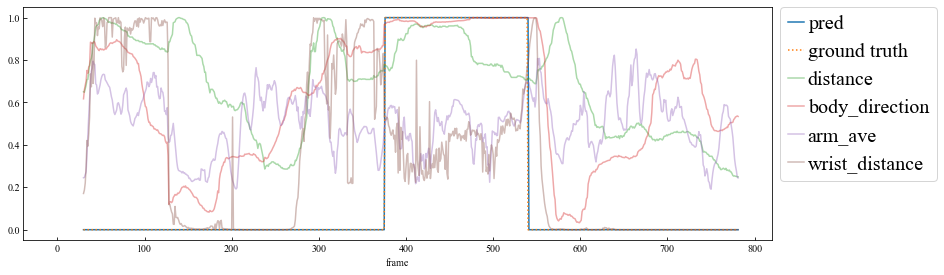

09_002_04_26_28


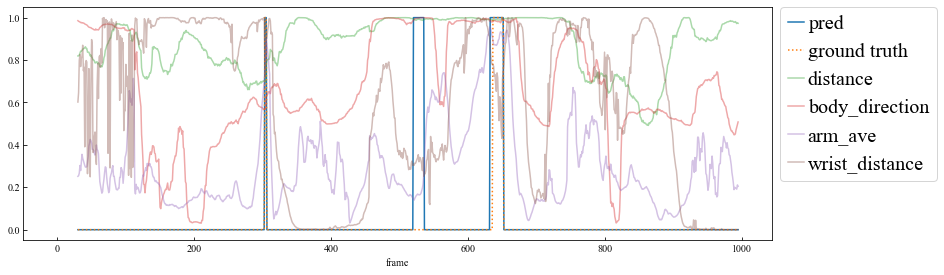

09_002_06_44_46


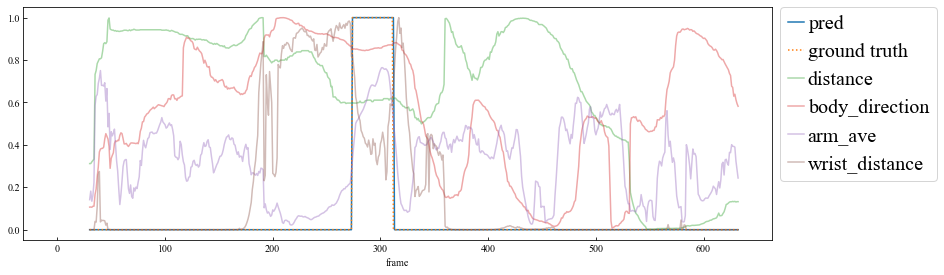

09_002_07_37_60


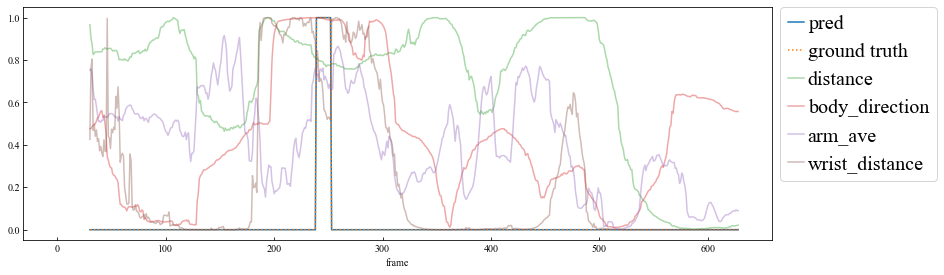

09_002_09_60_75


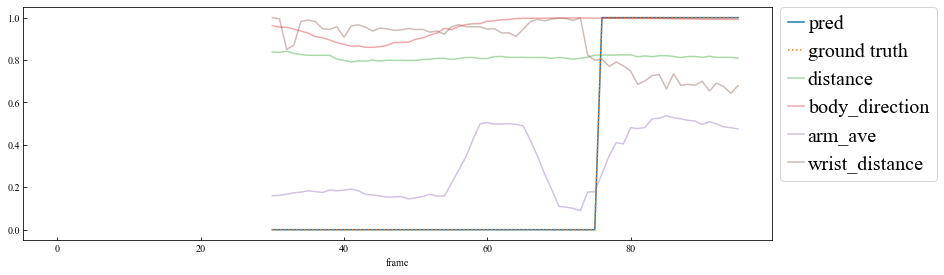

09_002_09_60_76


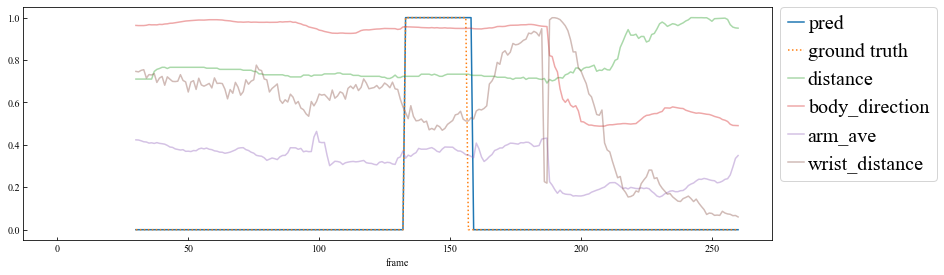

09_002_10_80_82


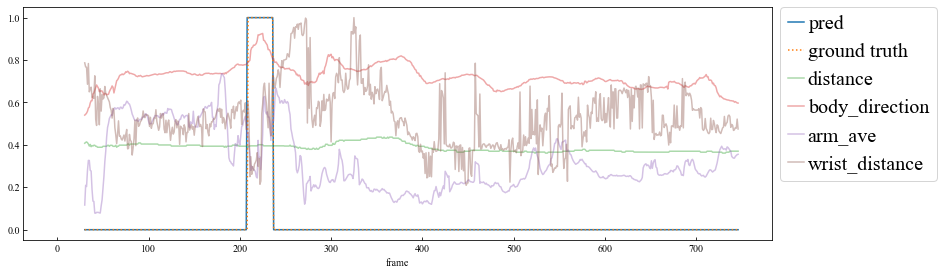

09_002_11_60_80


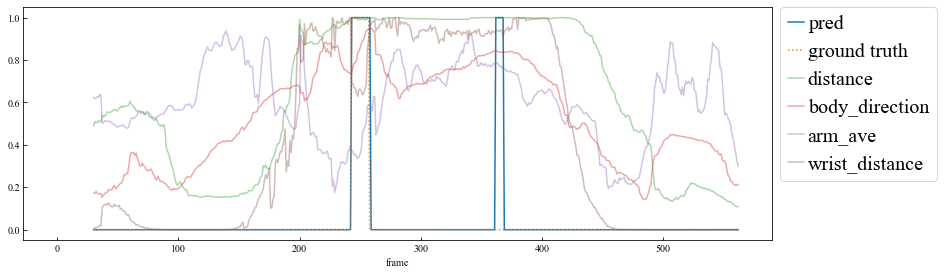

09_002_12_60_80


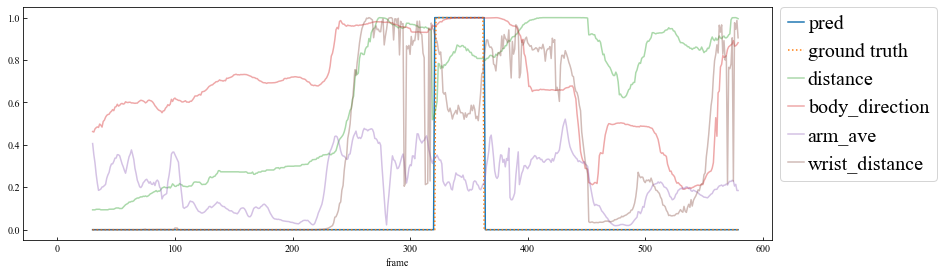

09_002_13_60_118


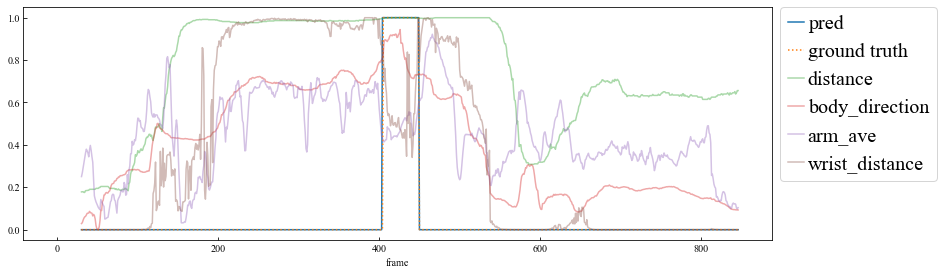

09_002_14_136_139


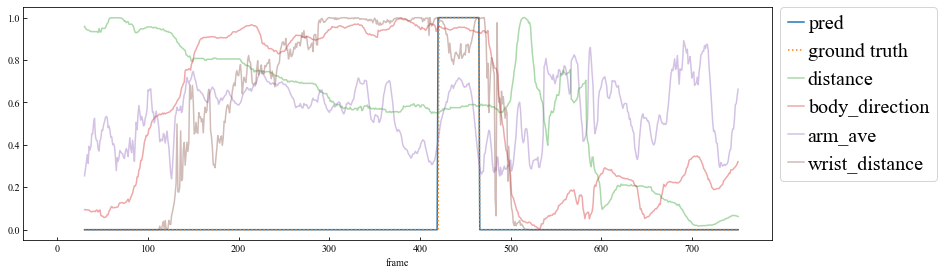

09_002_15_157_159


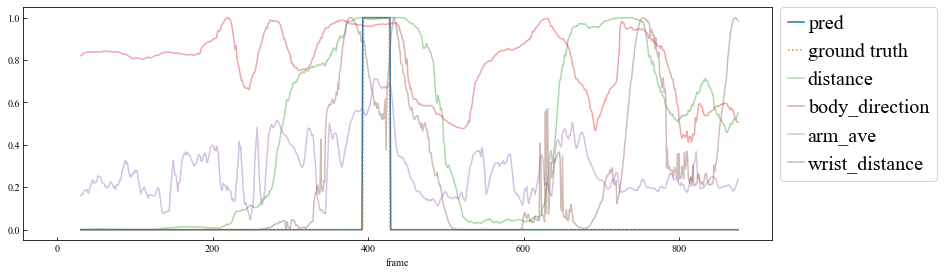

09_002_16_157_170


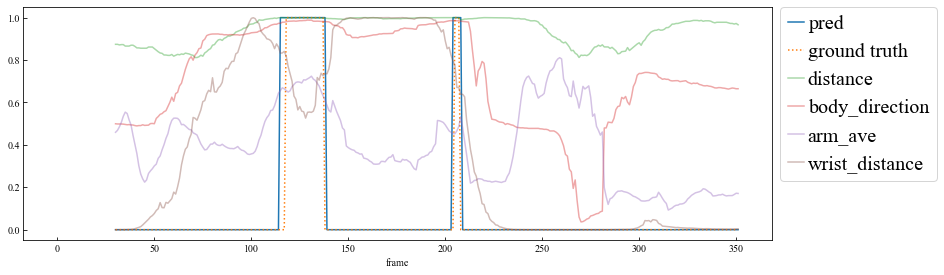

09_002_17_174_177


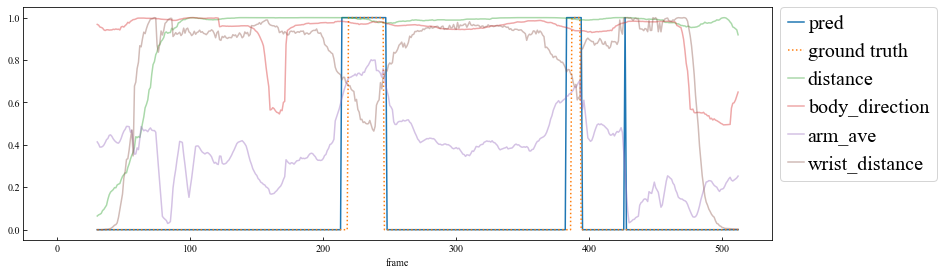

09_002_18_174_177


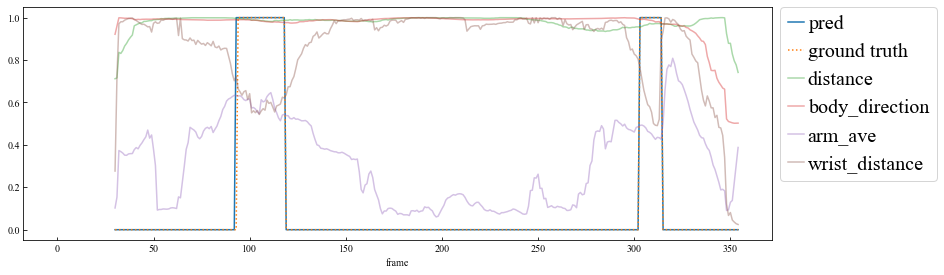

In [11]:
y_all_train = []
pred_all_train = []
y_eve_train = []
pred_eve_train = []

model.eval()
with torch.no_grad():
    for key in train_keys:
        x_lst = np.array(x_dict[key])
        y_lst = y_dict[key]
        
        x, _ = create_sequence(x_lst, y_lst, seq_len, size)
        x = torch.Tensor(np.array(x)).float().to(device)
        
        if len(x) == 0:
            continue

        pred = model(x)
        pred = pred.max(1)[1]
        pred = pred.cpu().numpy()

        x_lst = x_lst[seq_len - 1:]
        y_lst = y_lst[seq_len - 1:]
            
        y_all_train += y_lst
        pred_all_train += pred.tolist()
        y_eve_train.append(1 in y_lst)
        pred_eve_train.append(1 in pred.tolist())
        
        if 1 not in y_lst:
            continue
            
        print(key)
        path = None
        if key in save_keys:
            path = os.path.join("data", "passing", "image", f"rnn_test_{key}.pdf")
        plot(x_lst, y_lst, pred, seq_len, path=path)

In [12]:
print('accuracy: {:.3f}'.format(accuracy_score(y_all_train, pred_all_train)))
print('precision: {:.3f}'.format(precision_score(y_all_train, pred_all_train)))
print('recall: {:.3f}'.format(recall_score(y_all_train, pred_all_train)))
print('f1_score: {:.3f}'.format(f1_score(y_all_train, pred_all_train)))

accuracy: 0.999
precision: 0.879
recall: 0.999
f1_score: 0.935


In [13]:
# per event
print('accuracy: {:.3f}'.format(accuracy_score(y_eve_train, pred_eve_train)))
print('precision: {:.3f}'.format(precision_score(y_eve_train, pred_eve_train)))
print('recall: {:.3f}'.format(recall_score(y_eve_train, pred_eve_train)))
print('f1_score: {:.3f}'.format(f1_score(y_eve_train, pred_eve_train)))

accuracy: 0.991
precision: 0.750
recall: 1.000
f1_score: 0.857


## テストデータ

In [14]:
save_keys = [
    '08_03_2_5',
]

02_001_02_1_3


/tmp/ipykernel_2628136/1288139756.py:14: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at  ../torch/csrc/utils/tensor_new.cpp:210.)
  x = torch.Tensor(x).float().to(device)


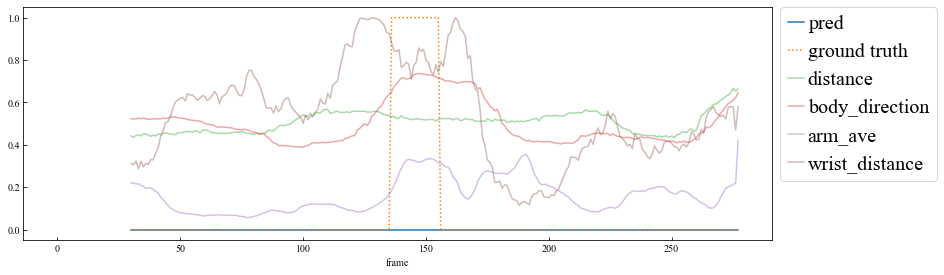

02_001_02_1_4


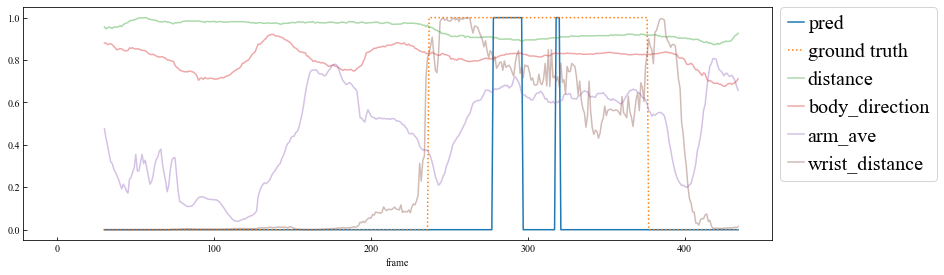

02_001_09_38_50


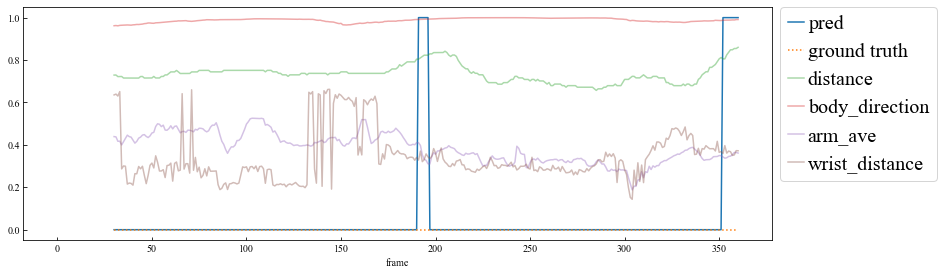

02_001_11_63_71


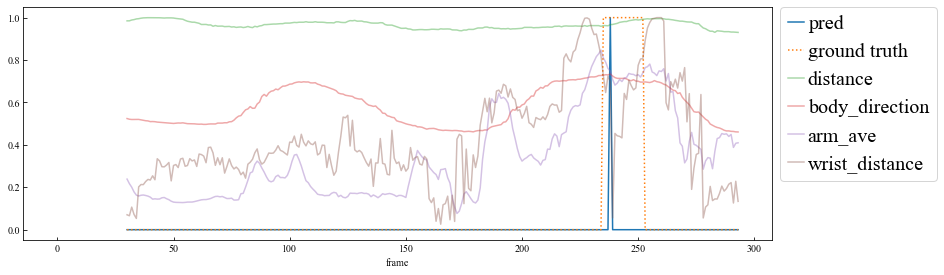

02_001_15_63_94


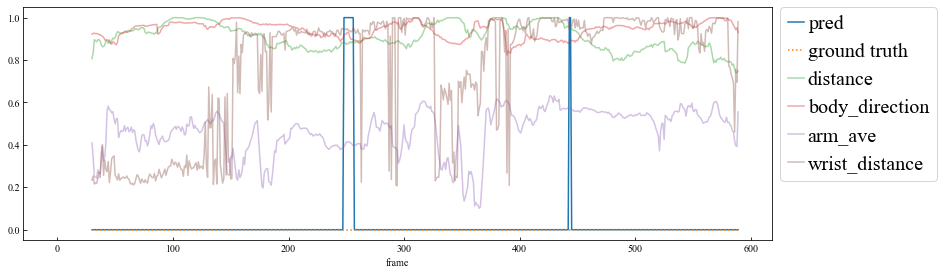

02_001_15_94_96


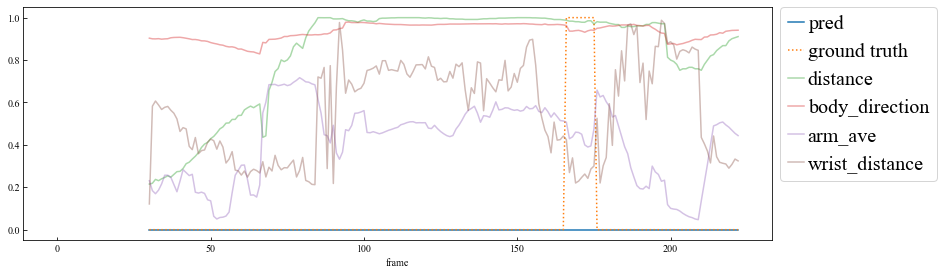

02_001_18_103_122


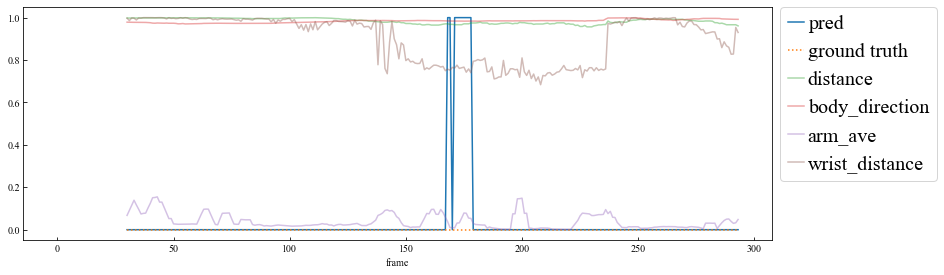

02_001_23_38_168


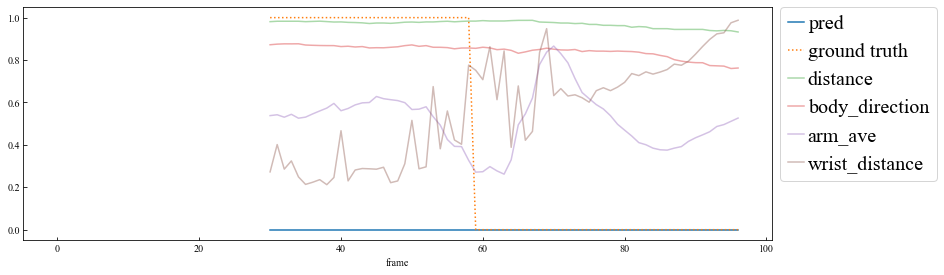

07_001_05_45_70


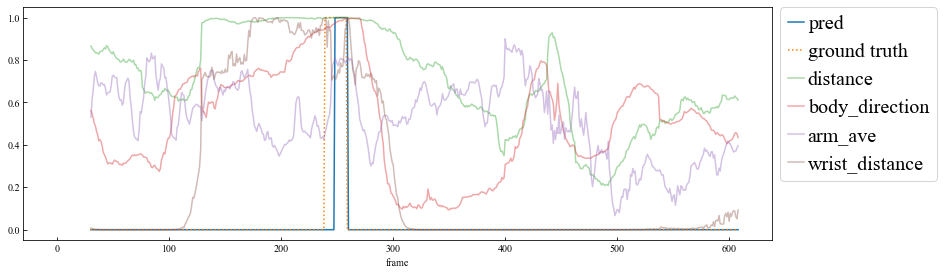

07_001_07_107_112


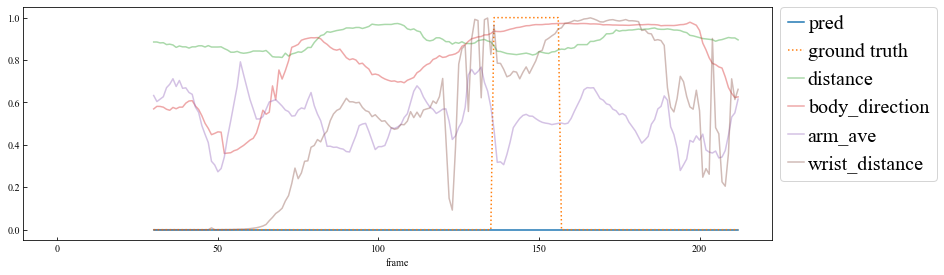

07_001_09_45_135


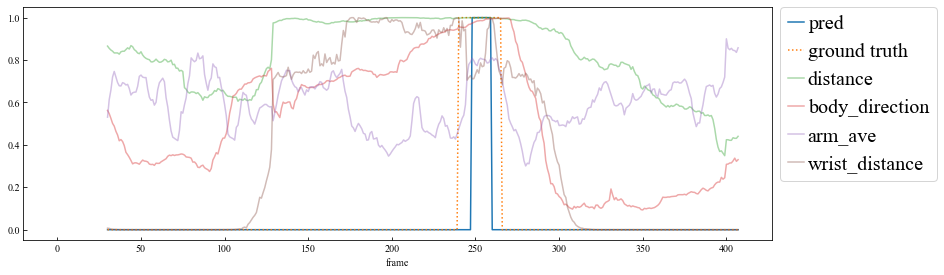

07_001_11_70_139


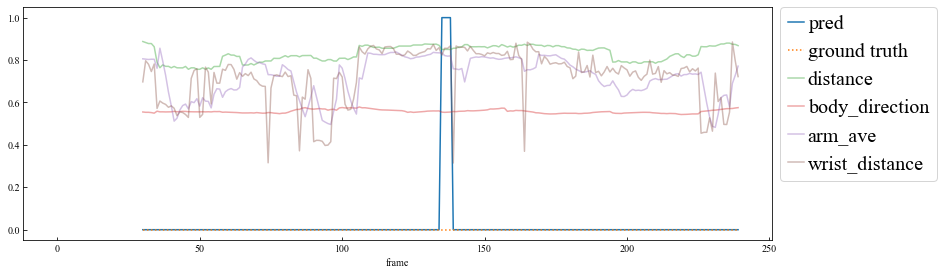

07_001_13_194_196


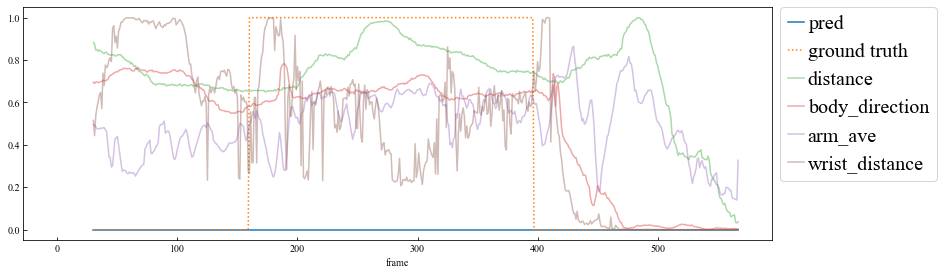

07_001_15_209_238


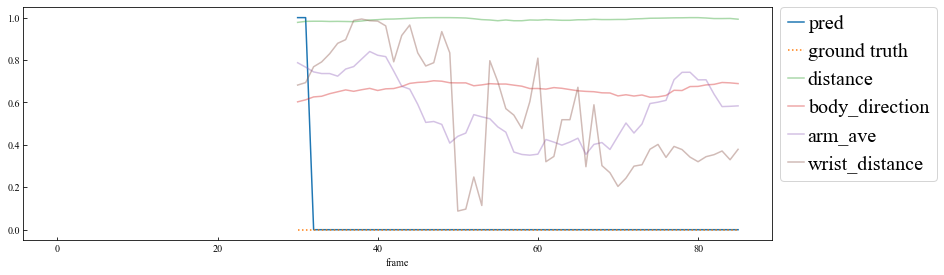

07_001_16_229_244


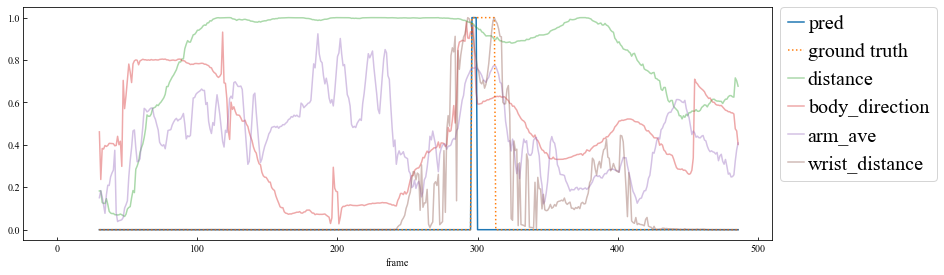

07_001_18_218_270


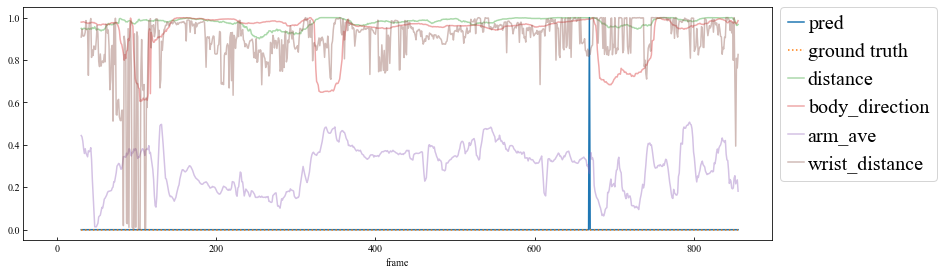

07_001_19_274_283


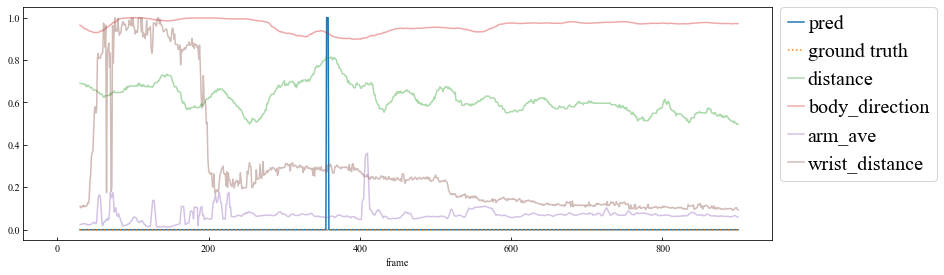

07_001_19_274_295


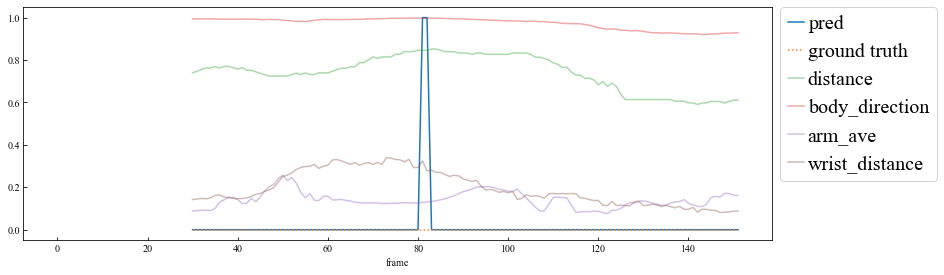

07_001_20_281_310


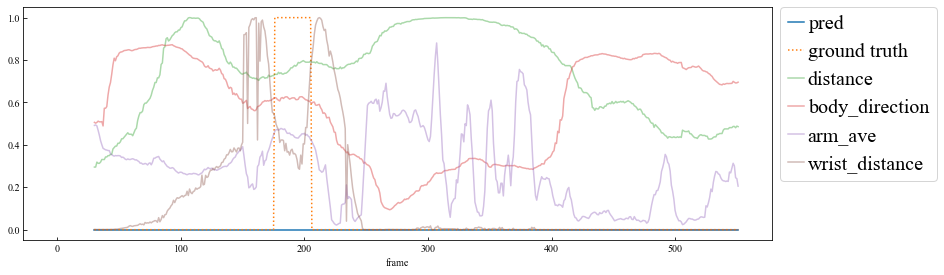

07_001_22_274_333


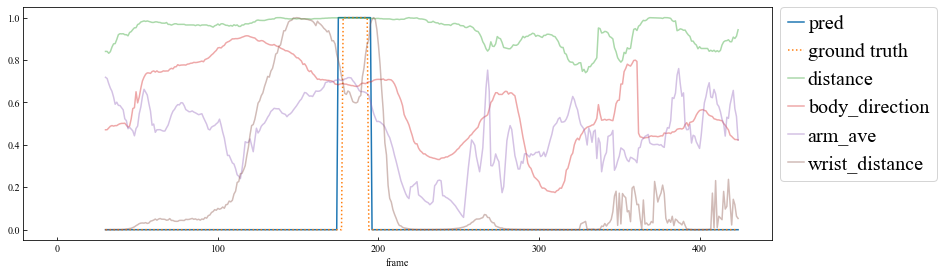

07_001_25_368_369


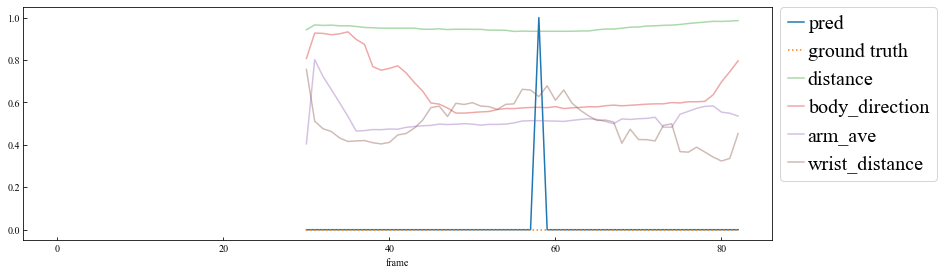

07_001_25_369_378


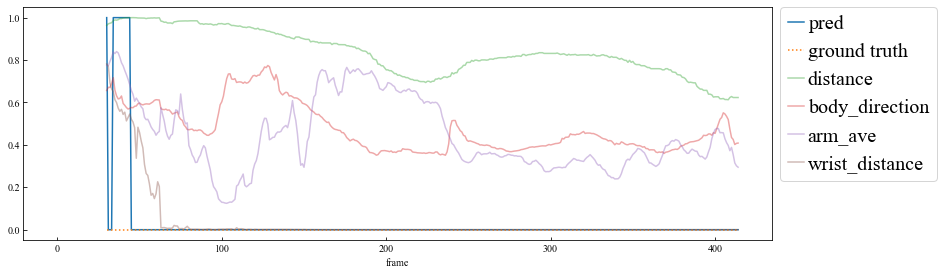

07_001_27_382_392


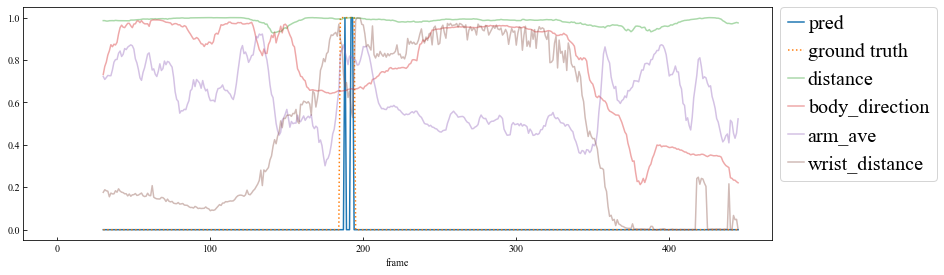

07_001_30_430_436


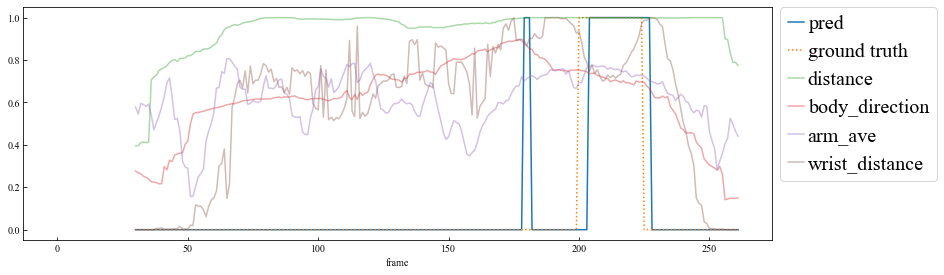

07_001_33_460_466


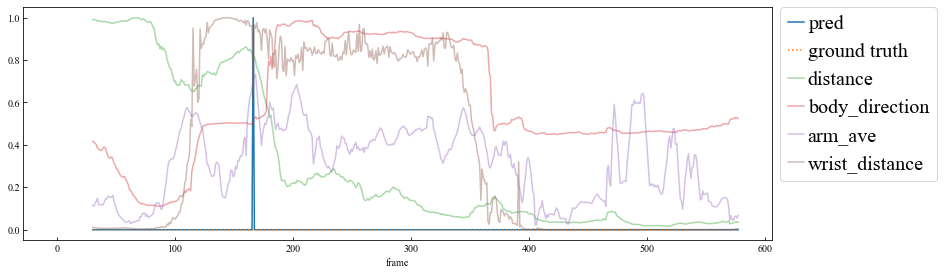

07_001_41_565_594


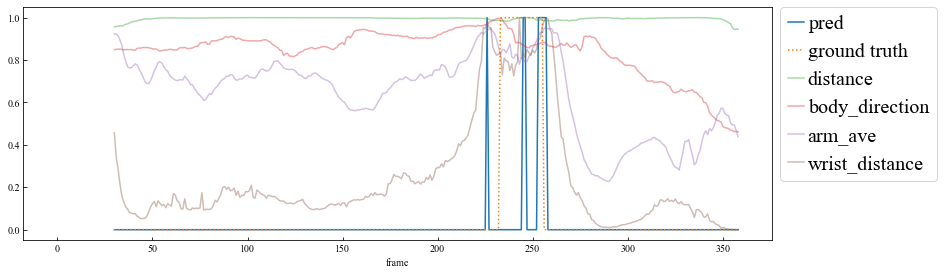

07_001_43_609_610


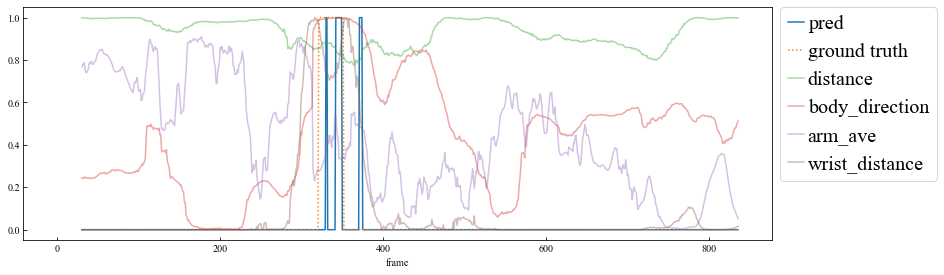

07_001_44_605_621


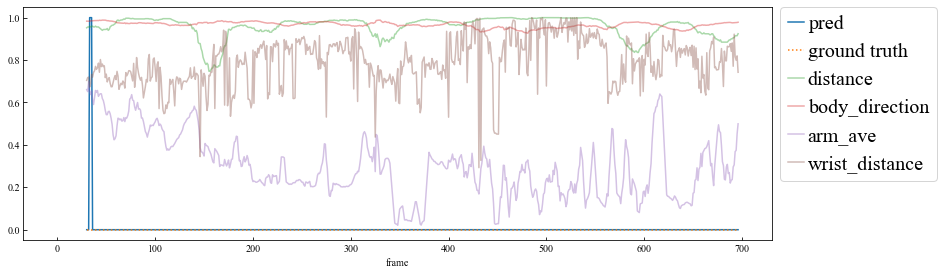

08_001_09_43_51


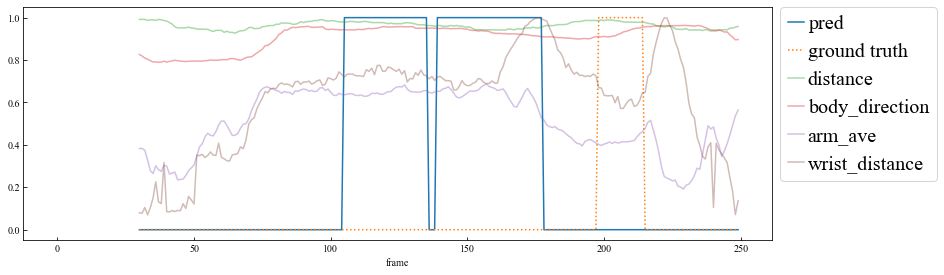

08_001_10_43_51


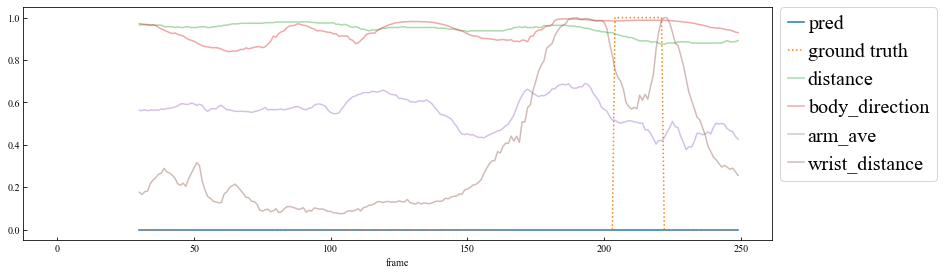

08_001_18_89_103


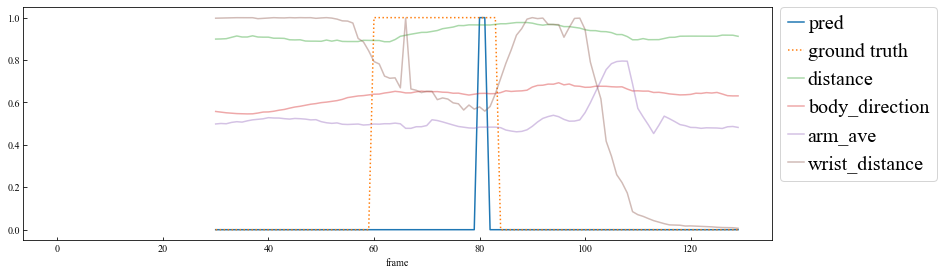

08_001_23_112_120


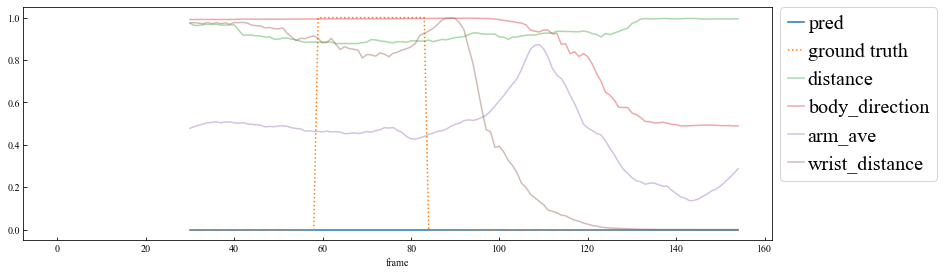

08_001_24_111_112


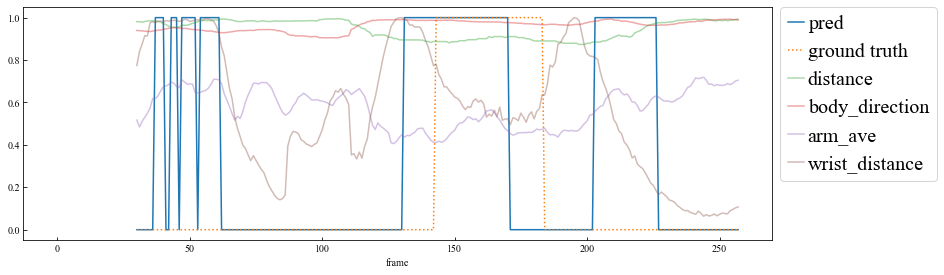

08_001_24_85_112


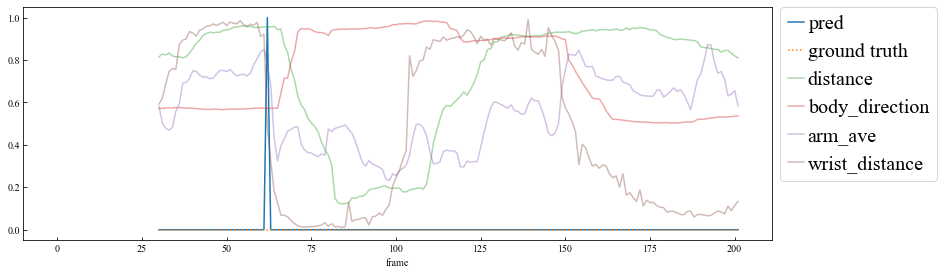

08_001_25_111_134


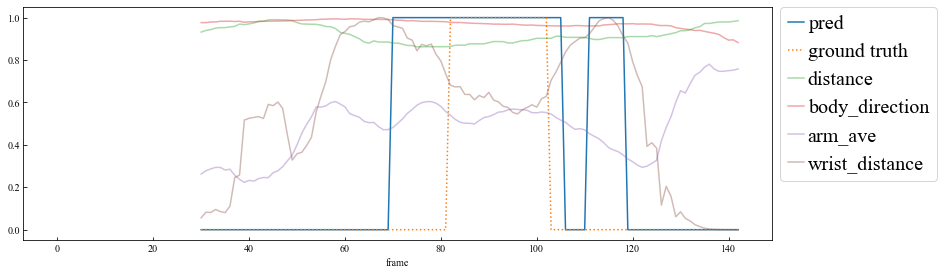

08_001_37_158_195


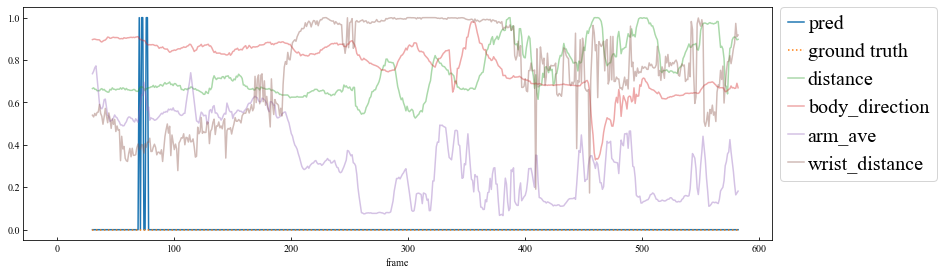

08_001_41_205_213


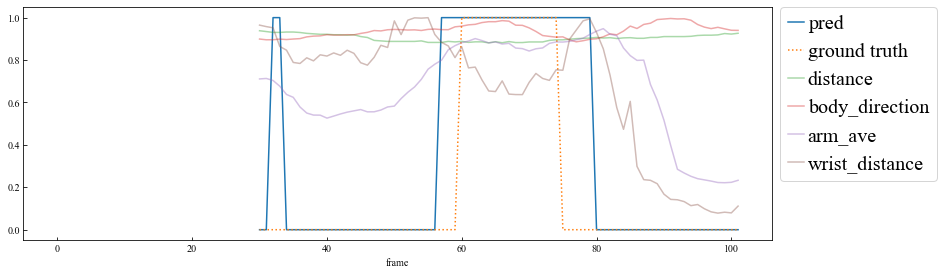

08_002_02_10_27


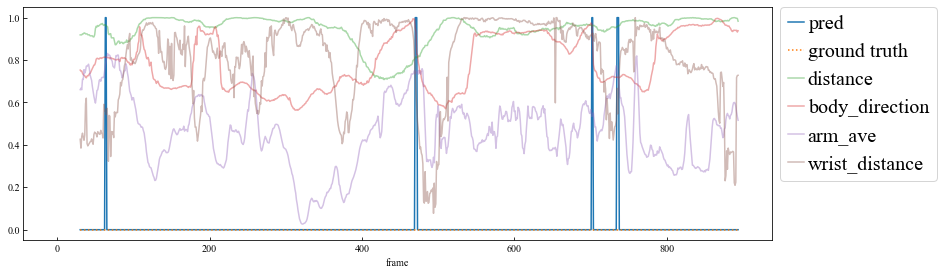

08_002_02_10_29


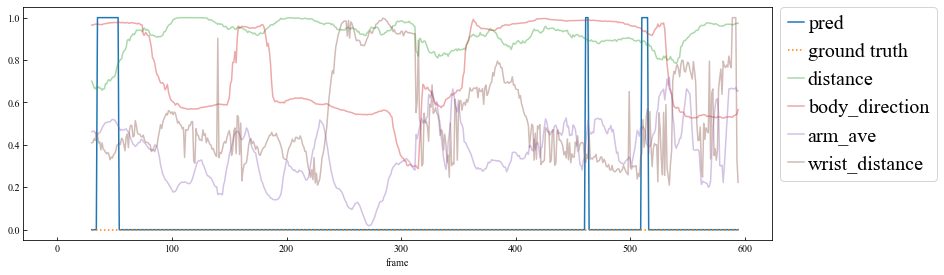

08_002_04_50_52


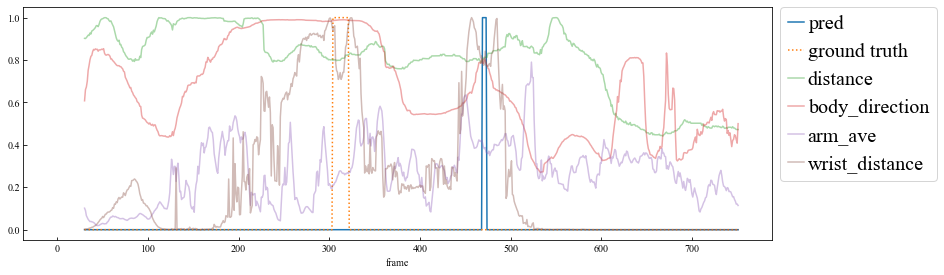

08_002_07_49_73


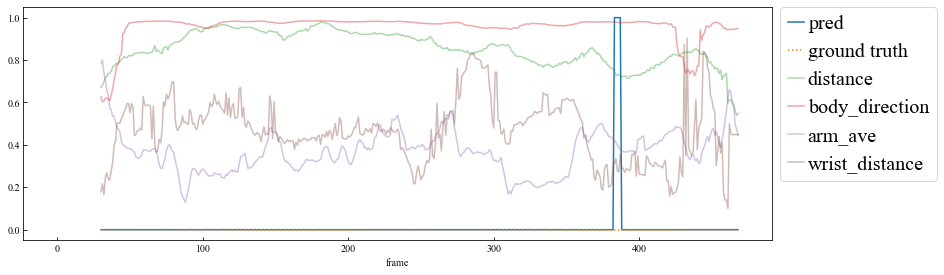

08_002_07_68_73


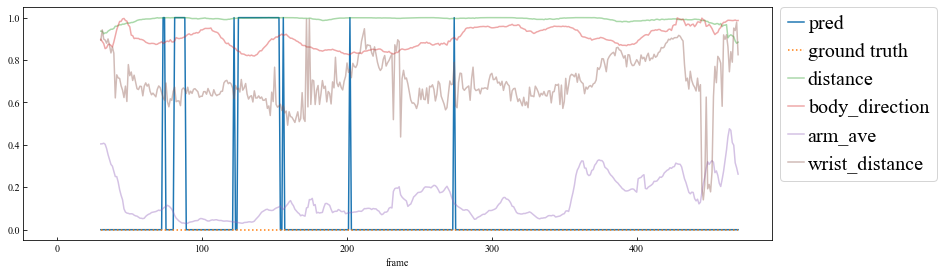

08_002_09_103_106


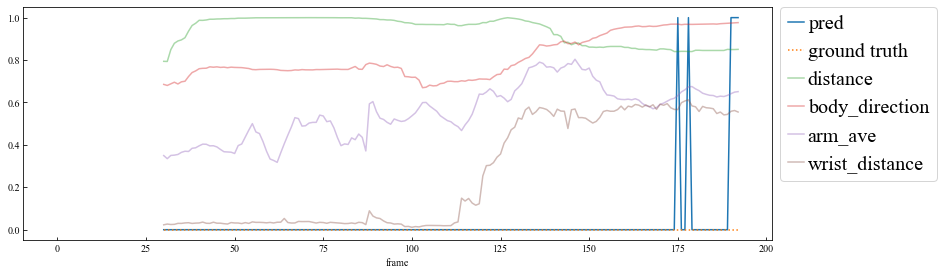

08_002_11_118_125


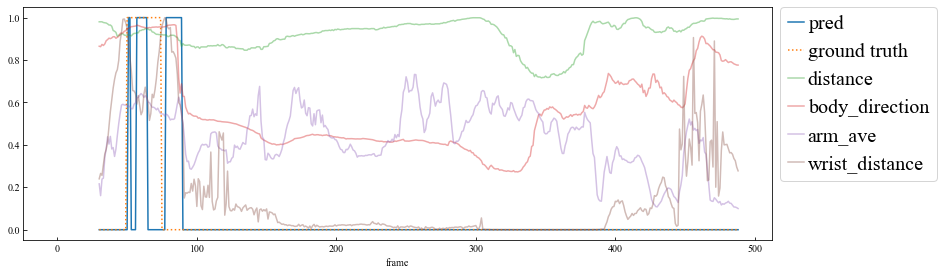

08_002_13_126_147


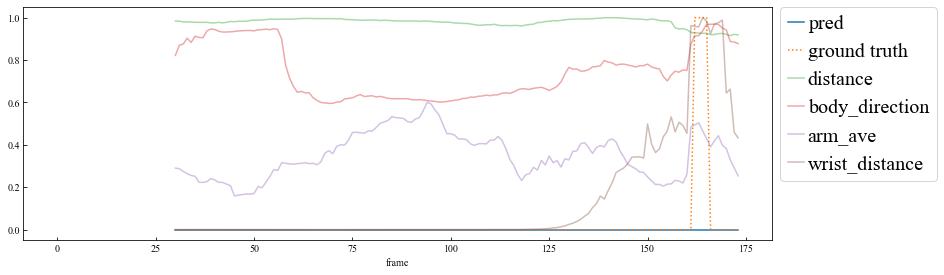

08_002_16_179_186


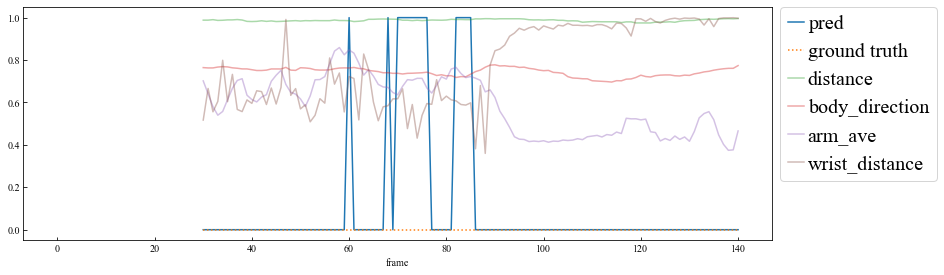

08_002_16_195_200


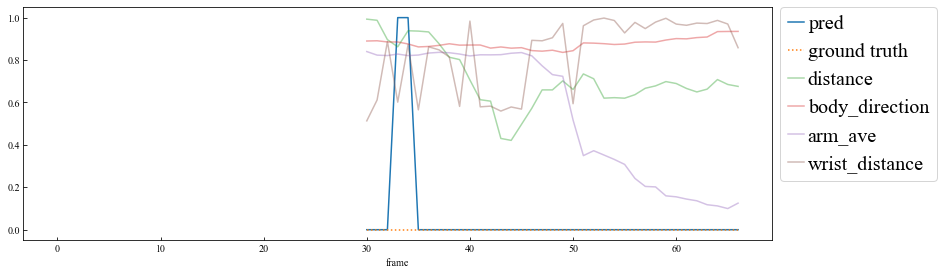

08_002_18_217_221


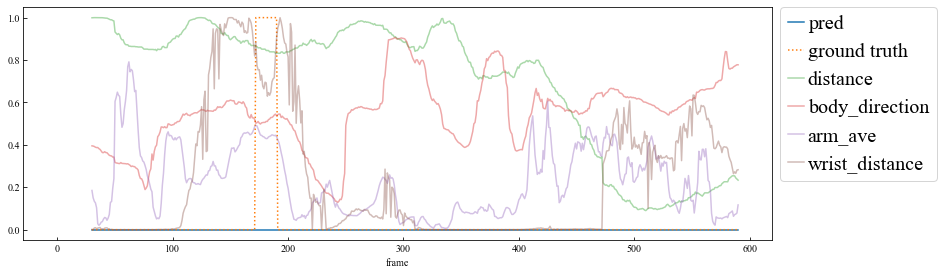

08_002_25_272_284


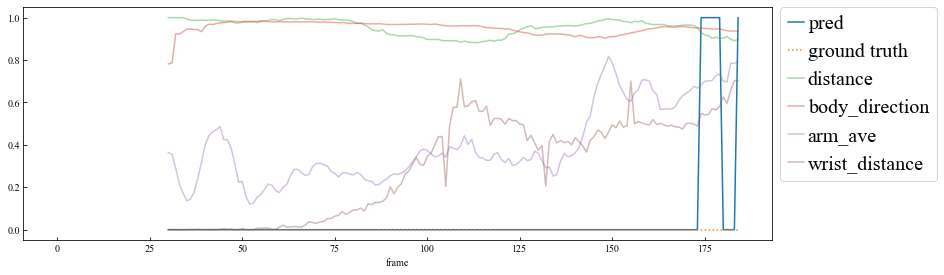

08_002_34_377_383


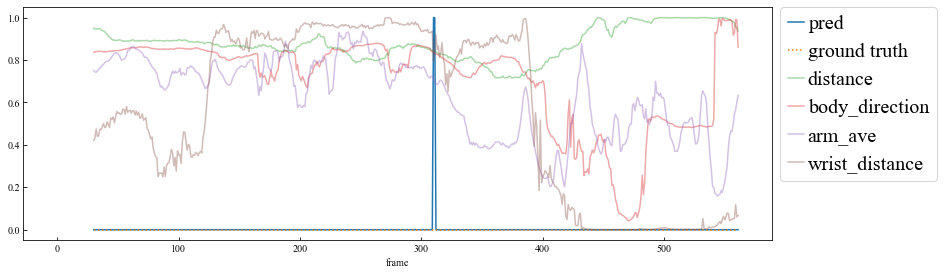

08_002_35_390_391


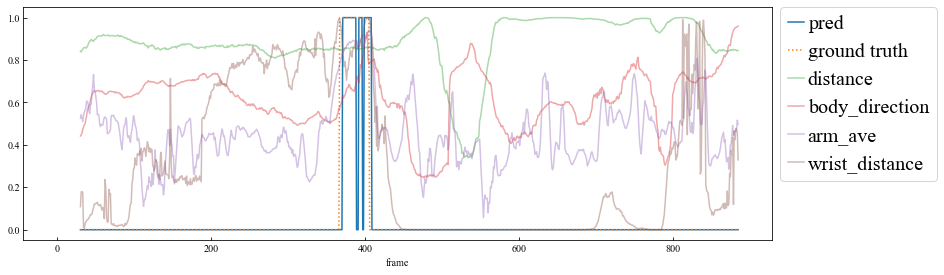

08_002_36_384_399


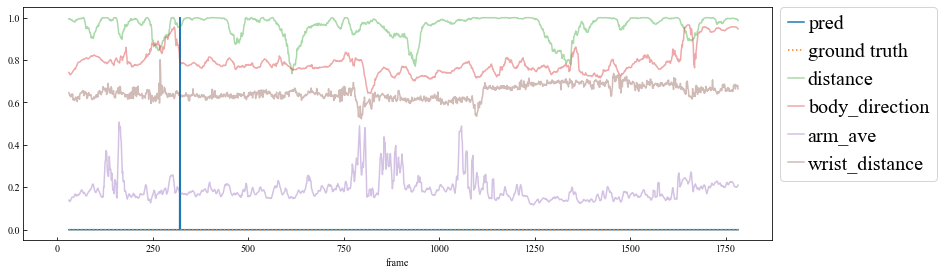

08_002_38_390_391


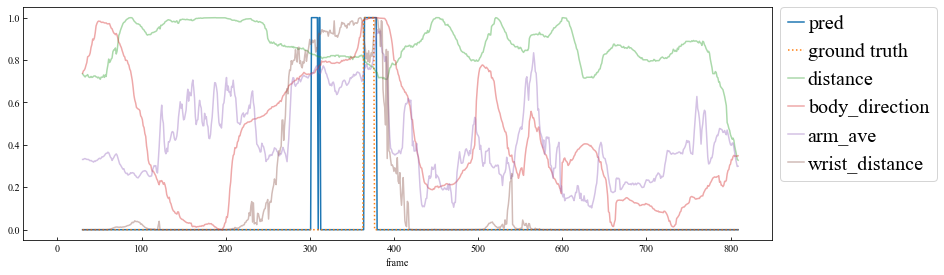

08_002_40_426_436


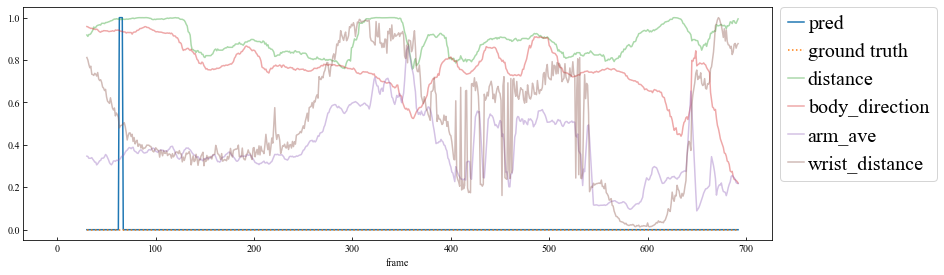

08_002_41_426_441


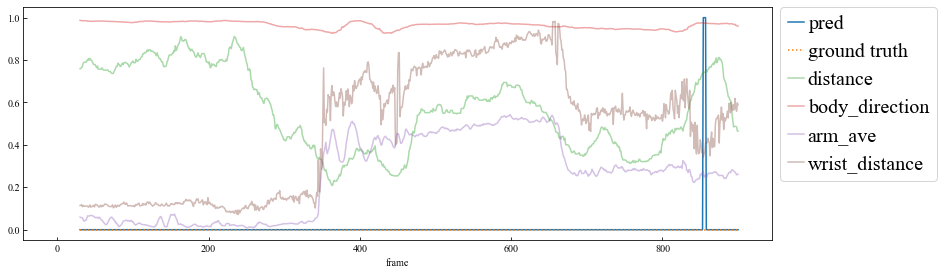

08_002_42_426_433


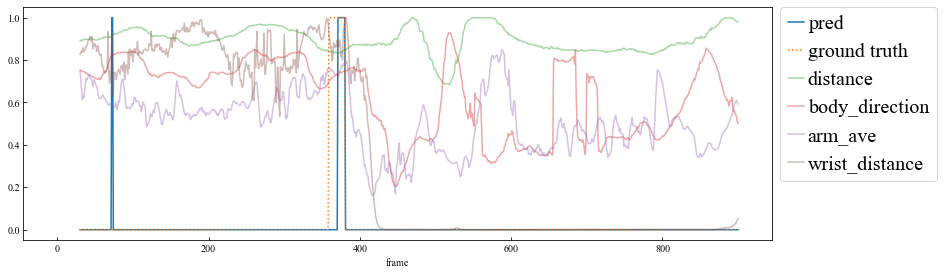

08_002_43_433_448


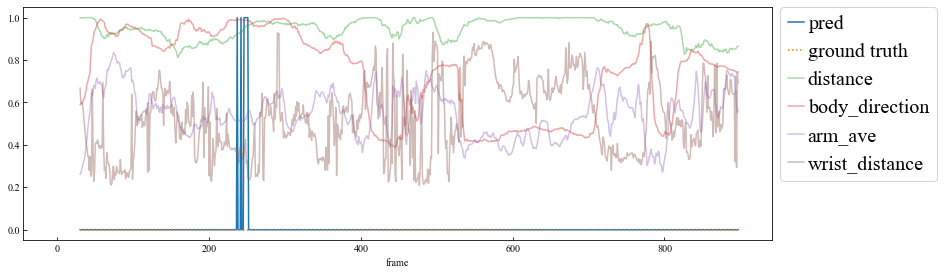

08_002_44_433_448


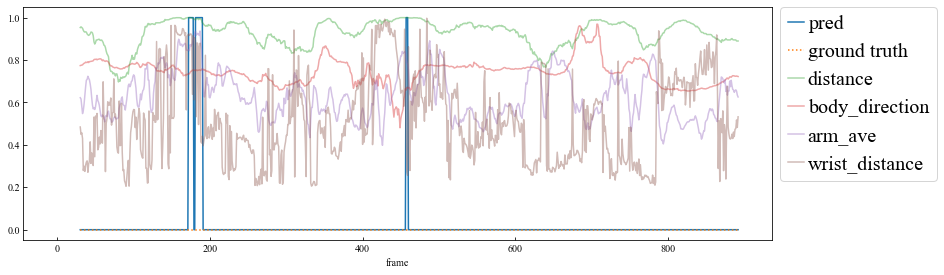

08_002_44_433_460


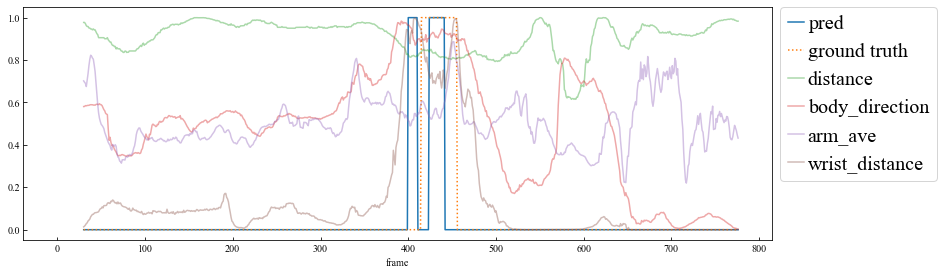

08_002_45_433_457


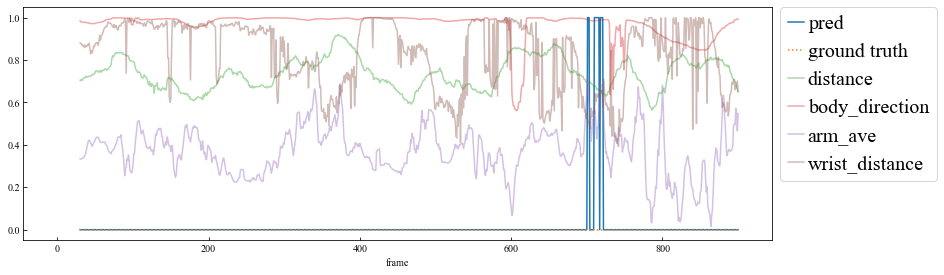

08_002_46_433_467


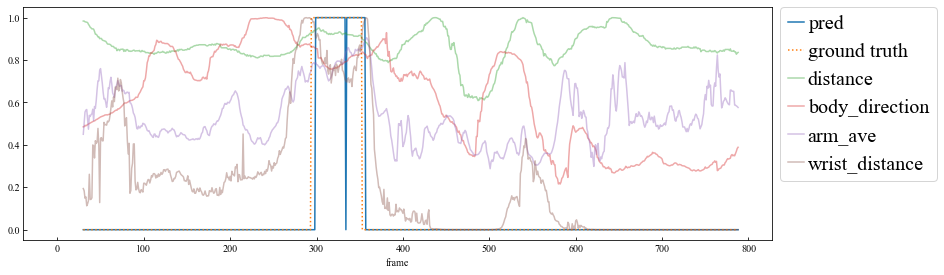

09_001_02_7_16


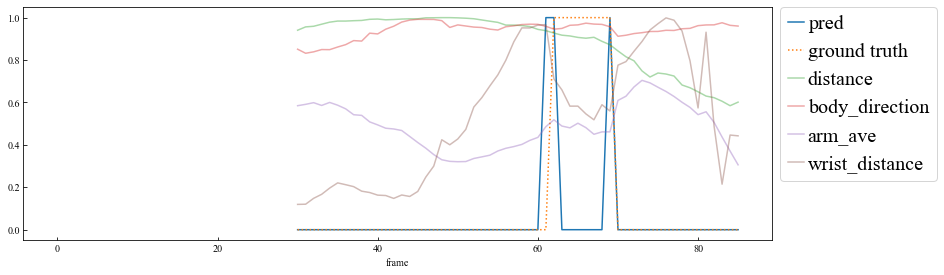

09_001_03_29_38


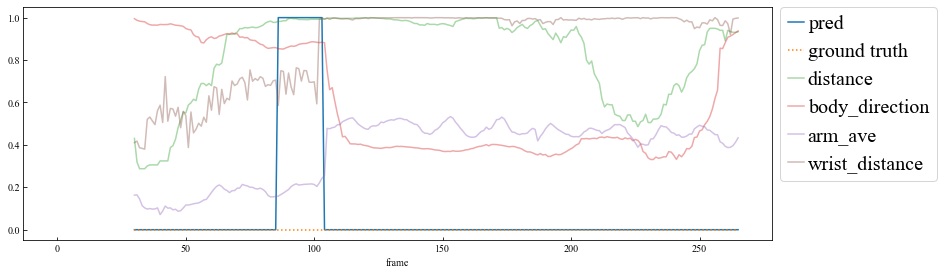

09_001_03_5_32


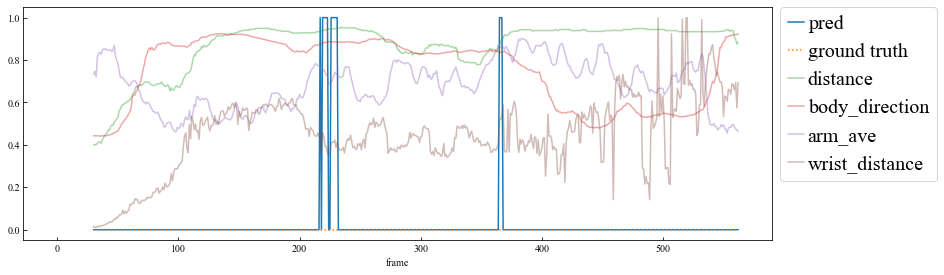

09_001_04_5_30


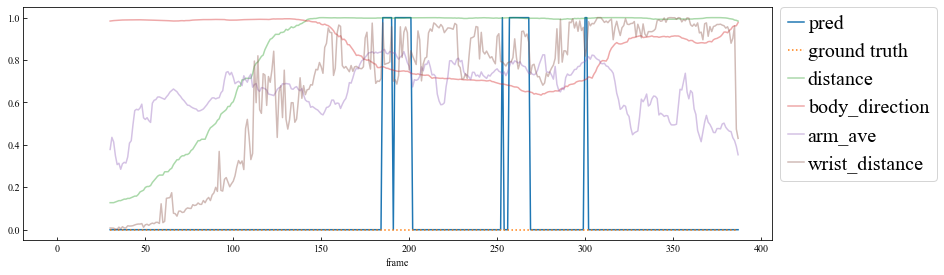

09_001_05_28_46


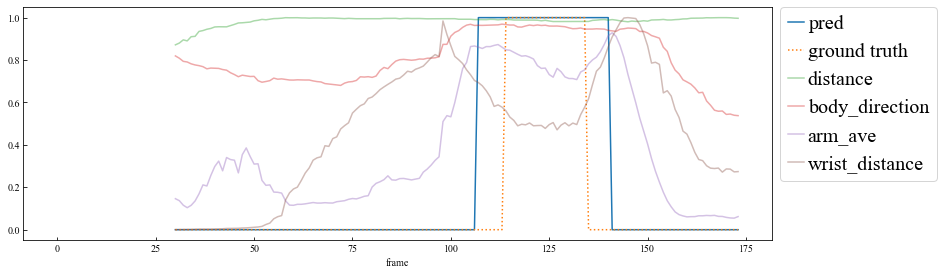

09_001_07_15_28


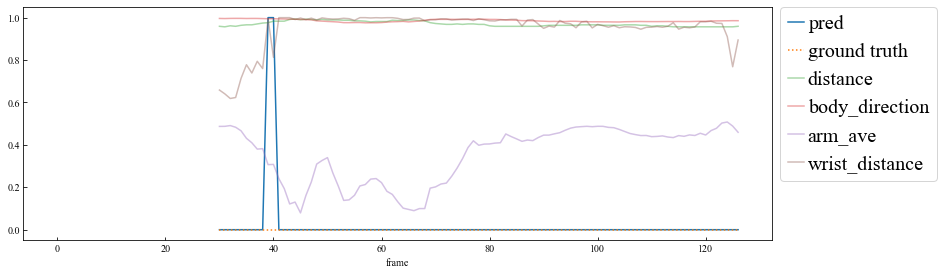

09_002_02_8_14


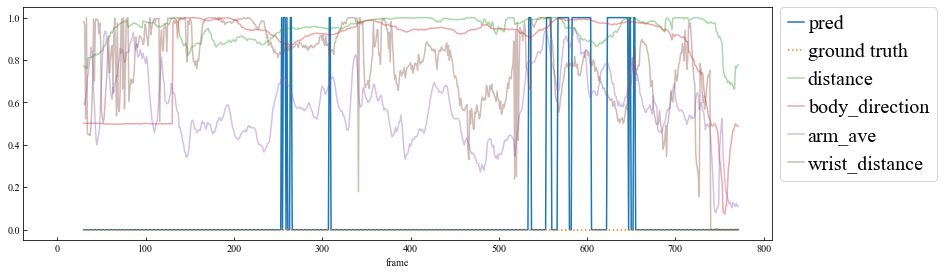

09_002_03_11_28


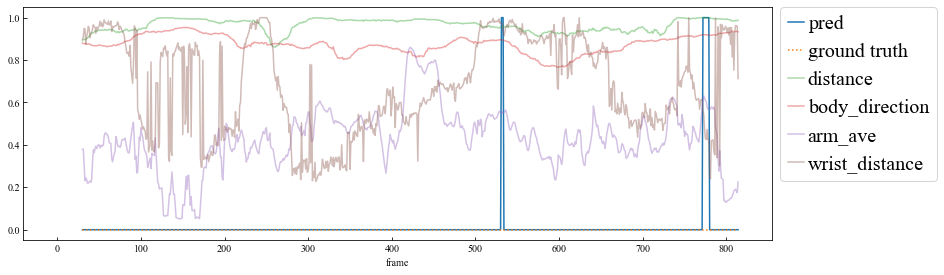

09_002_03_26_28


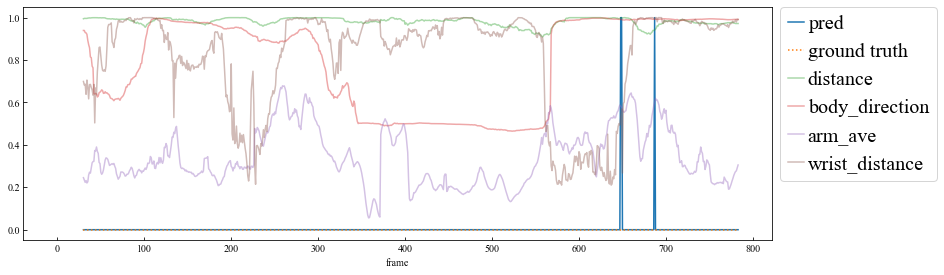

09_002_04_28_34


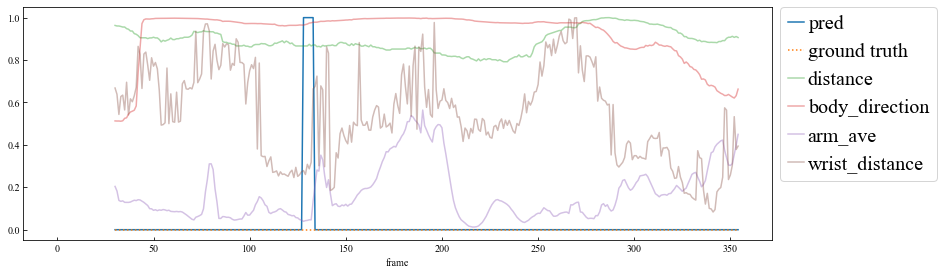

09_002_04_35_37


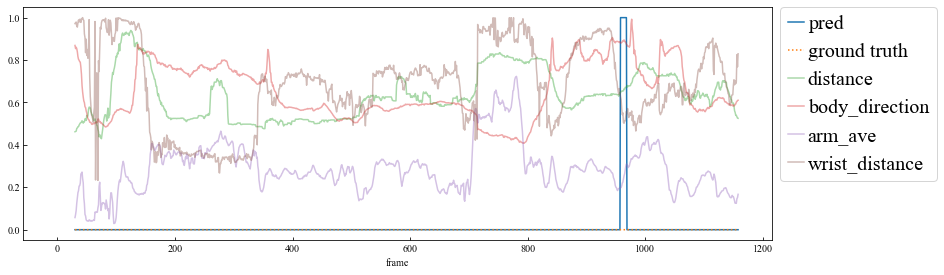

09_002_10_78_80


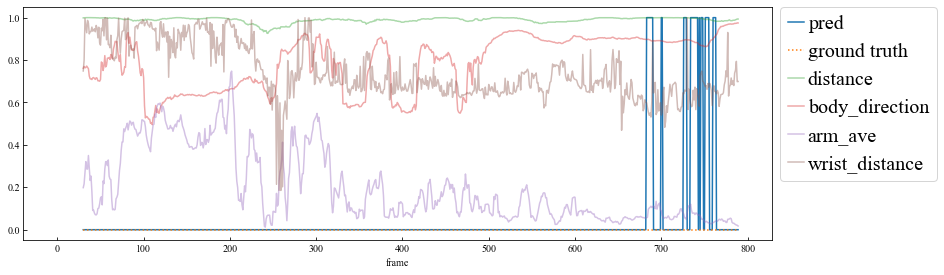

09_002_10_80_86


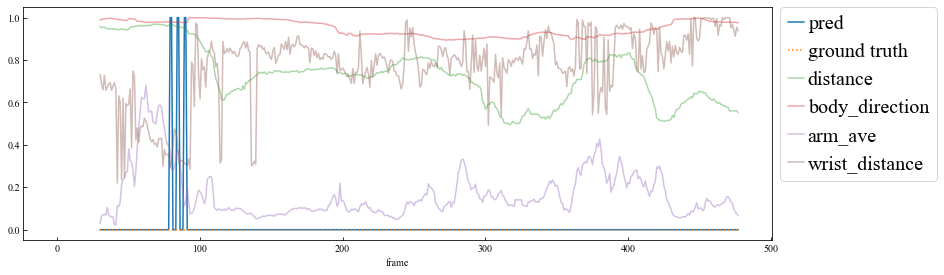

09_002_13_106_116


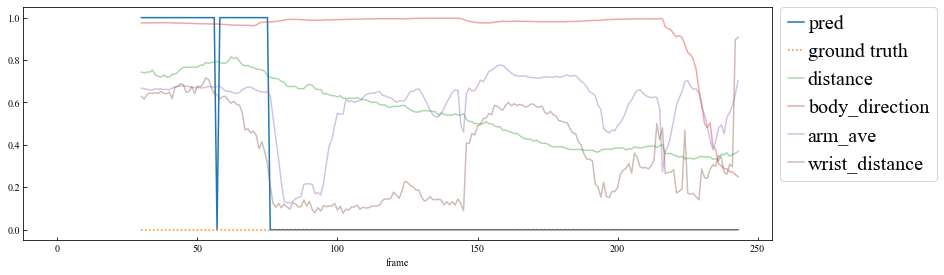

09_002_13_97_106


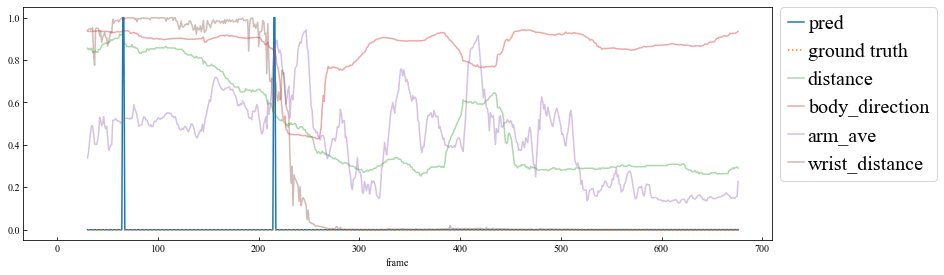

09_002_14_97_146


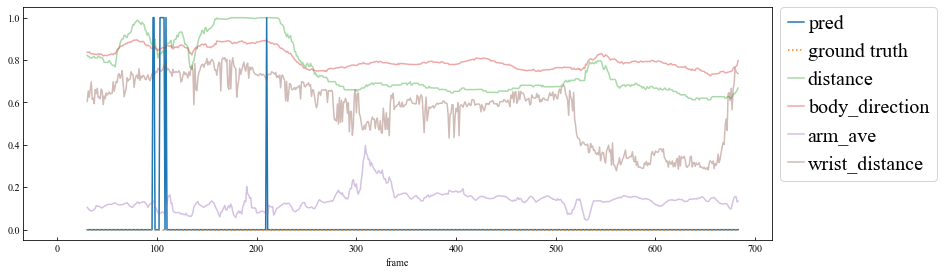

In [15]:
y_all_test = []
pred_all_test = []
y_eve_test = []
pred_eve_test = []
tn, fn = 0, 0

model.eval()
with torch.no_grad():
    for key in test_keys:
        x_lst = np.array(x_dict[key])
        y_lst = y_dict[key]

        x, _ = create_sequence(x_lst, y_lst, seq_len, size)
        x = torch.Tensor(x).float().to(device)

        if len(x) == 0:
            tn += 1
            continue
            
        pred = model(x)
        pred = pred.max(1)[1]
        pred = pred.cpu().numpy()

        x_lst = x_lst[seq_len - 1:]
        y_lst = y_lst[seq_len - 1:]
        
        y_all_test += y_lst
        pred_all_test += pred.tolist()
        y_eve_test.append(1 in y_lst)
        pred_eve_test.append(1 in pred.tolist())
        if 1 not in y_lst:
            if 1 not in pred:
                tn += 1
            else:
                fn += 1
        
        if 1 not in pred and 1 not in y_lst:
            continue
            
        print(key)
        path = None
        if key in save_keys:
            path = os.path.join("data", "passing", "image", f"rnn_test_{key}.pdf")
        plot(x_lst, y_lst, pred, seq_len, path=path)

accuracy: 0.995
precision: 0.301
recall: 0.296
f1_score: 0.299


<AxesSubplot:>

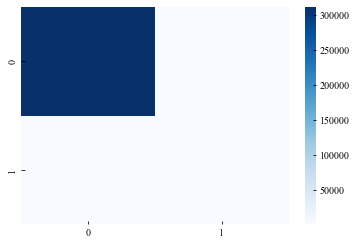

In [16]:
print('accuracy: {:.3f}'.format(accuracy_score(y_all_test, pred_all_test)))
print('precision: {:.3f}'.format(precision_score(y_all_test, pred_all_test)))
print('recall: {:.3f}'.format(recall_score(y_all_test, pred_all_test)))
print('f1_score: {:.3f}'.format(f1_score(y_all_test, pred_all_test)))

cm = confusion_matrix(y_all_test, pred_all_test)
sns.heatmap(cm, cmap='Blues')

accuracy: 0.959
precision: 0.358
recall: 0.706
f1_score: 0.475
true negative: 2443
false negative: 43


<AxesSubplot:>

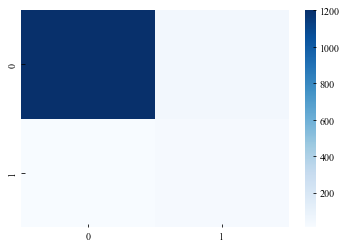

In [17]:
# per event
print('accuracy: {:.3f}'.format(accuracy_score(y_eve_test, pred_eve_test)))
print('precision: {:.3f}'.format(precision_score(y_eve_test, pred_eve_test)))
print('recall: {:.3f}'.format(recall_score(y_eve_test, pred_eve_test)))
print('f1_score: {:.3f}'.format(f1_score(y_eve_test, pred_eve_test)))

print('true negative:', tn)
print('false negative:', fn)

cm = confusion_matrix(y_eve_test, pred_eve_test)
sns.heatmap(cm, cmap='Blues')